# Design and deploy a credit scoring model
# Notebook 3 - Model comparison and selection

# Objectives of the notebook

Try and compare many types of classifiers in different methods to manage unbalanced data in order to ultimately select the most suitable solution to meet our needs.

*NB: Values' labels suffixed "_train" correspond to scores obtained by cross-validation on the train set.*

# Glossary

__- TP:__ True positives correspond to customers which are classified as they would default the repayment of their loan and they would as expected.<br>
__- FP:__ False positives correspond to customers which were guessed trustless to repay their loans whereas they would have to (Secondary case to avoid and minimize if possible).<br>
__- FN:__ False negatives correspond to customers which were guessed trustful to repay their loans whereas they will not (Worst case to absolutly minimize).<br>
__- TN:__ True negatives correspond to customers which are classified as they would not default the repayment of their loan and they don't as expected.<br>
__- cv:__ Cross-validation.<br>
__- scl:__ Data scaled.<br>
__- rsp:__ Resampling.<br>
__- wt:__ Weight (for the cost-sensitive method).<br>
__- opt:__ Optimized.<br>
__- usp:__ Undersampled.<br>
__- osp:__ Oversampled.<br>
__- clf:__ Classifier.<br>

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Design-and-deploy-a-credit-scoring-model" data-toc-modified-id="Design-and-deploy-a-credit-scoring-model-1">Design and deploy a credit scoring model</a></span></li><li><span><a href="#Notebook-3---Model-comparison-and-selection" data-toc-modified-id="Notebook-3---Model-comparison-and-selection-2">Notebook 3 - Model comparison and selection</a></span></li><li><span><a href="#Objectives-of-the-notebook" data-toc-modified-id="Objectives-of-the-notebook-3">Objectives of the notebook</a></span></li><li><span><a href="#Glossary" data-toc-modified-id="Glossary-4">Glossary</a></span></li><li><span><a href="#I)-Importation-of-the-dataset-into-a-pandas-dataframe" data-toc-modified-id="I)-Importation-of-the-dataset-into-a-pandas-dataframe-5">I) Importation of the dataset into a pandas dataframe</a></span><ul class="toc-item"><li><span><a href="#1)-Import-all-librairies-and-tools-required-to-realize-the-project-and-set-the-first-global-variables" data-toc-modified-id="1)-Import-all-librairies-and-tools-required-to-realize-the-project-and-set-the-first-global-variables-5.1">1) Import all librairies and tools required to realize the project and set the first global variables</a></span></li><li><span><a href="#2)-Settings-of-global-graphics-parameters" data-toc-modified-id="2)-Settings-of-global-graphics-parameters-5.2">2) Settings of global graphics parameters</a></span></li><li><span><a href="#3)-Global-files'-path" data-toc-modified-id="3)-Global-files'-path-5.3">3) Global files' path</a></span></li><li><span><a href="#4)-Importation-of-the-preprocessed-datasets" data-toc-modified-id="4)-Importation-of-the-preprocessed-datasets-5.4">4) Importation of the preprocessed datasets</a></span></li><li><span><a href="#5)-Separation-of-the-explanatory-and-explicated-variables" data-toc-modified-id="5)-Separation-of-the-explanatory-and-explicated-variables-5.5">5) Separation of the explanatory and explicated variables</a></span></li></ul></li><li><span><a href="#II)-Models" data-toc-modified-id="II)-Models-6">II) Models</a></span><ul class="toc-item"><li><span><a href="#1)-Importation-of-required-libraries" data-toc-modified-id="1)-Importation-of-required-libraries-6.1">1) Importation of required libraries</a></span></li><li><span><a href="#2)-Global-variables" data-toc-modified-id="2)-Global-variables-6.2">2) Global variables</a></span><ul class="toc-item"><li><span><a href="#a)-Notebook-configuration" data-toc-modified-id="a)-Notebook-configuration-6.2.1">a) Notebook configuration</a></span></li><li><span><a href="#b)-Defaults" data-toc-modified-id="b)-Defaults-6.2.2">b) Defaults</a></span></li><li><span><a href="#c)-Summarizing-table-creating-/-loading" data-toc-modified-id="c)-Summarizing-table-creating-/-loading-6.2.3">c) Summarizing table creating / loading</a></span></li></ul></li><li><span><a href="#3)-Data-resampling-settings" data-toc-modified-id="3)-Data-resampling-settings-6.3">3) Data resampling settings</a></span><ul class="toc-item"><li><span><a href="#a)-Functions" data-toc-modified-id="a)-Functions-6.3.1">a) Functions</a></span></li><li><span><a href="#b)-Oversampling" data-toc-modified-id="b)-Oversampling-6.3.2">b) Oversampling</a></span></li><li><span><a href="#c)-Undersampling" data-toc-modified-id="c)-Undersampling-6.3.3">c) Undersampling</a></span></li></ul></li><li><span><a href="#4)-Functions" data-toc-modified-id="4)-Functions-6.4">4) Functions</a></span><ul class="toc-item"><li><span><a href="#a)-Hyperparameter-tuning" data-toc-modified-id="a)-Hyperparameter-tuning-6.4.1">a) Hyperparameter tuning</a></span></li><li><span><a href="#b)-Evaluation-of-models'-performances" data-toc-modified-id="b)-Evaluation-of-models'-performances-6.4.2">b) Evaluation of models' performances</a></span></li><li><span><a href="#c)-Building-of-the-models'-pipelines" data-toc-modified-id="c)-Building-of-the-models'-pipelines-6.4.3">c) Building of the models' pipelines</a></span></li><li><span><a href="#d)-Hyperparameters-tuning-and-models-evaluations-repeatable-code-blocks" data-toc-modified-id="d)-Hyperparameters-tuning-and-models-evaluations-repeatable-code-blocks-6.4.4">d) Hyperparameters tuning and models evaluations repeatable code blocks</a></span></li></ul></li><li><span><a href="#5)-Modelisation" data-toc-modified-id="5)-Modelisation-6.5">5) Modelisation</a></span><ul class="toc-item"><li><span><a href="#a)-Baseline-model:-Dummy-classifier" data-toc-modified-id="a)-Baseline-model:-Dummy-classifier-6.5.1">a) Baseline model: Dummy classifier</a></span><ul class="toc-item"><li><span><a href="#i.-Libraries-importation" data-toc-modified-id="i.-Libraries-importation-6.5.1.1">i. Libraries importation</a></span></li><li><span><a href="#ii.-Creation-of-the-model's-pipeline" data-toc-modified-id="ii.-Creation-of-the-model's-pipeline-6.5.1.2">ii. Creation of the model's pipeline</a></span></li><li><span><a href="#iii.-Evaluation-by-cross-validation-over-the-train-set" data-toc-modified-id="iii.-Evaluation-by-cross-validation-over-the-train-set-6.5.1.3">iii. Evaluation by cross-validation over the train set</a></span></li><li><span><a href="#iv.-Generalization-over-the-test-set" data-toc-modified-id="iv.-Generalization-over-the-test-set-6.5.1.4">iv. Generalization over the test set</a></span></li></ul></li><li><span><a href="#b)-Logistic-regressor" data-toc-modified-id="b)-Logistic-regressor-6.5.2">b) Logistic regressor</a></span><ul class="toc-item"><li><span><a href="#i.-Importation" data-toc-modified-id="i.-Importation-6.5.2.1">i. Importation</a></span></li><li><span><a href="#ii.-Creation-of-the-model-pipeline" data-toc-modified-id="ii.-Creation-of-the-model-pipeline-6.5.2.2">ii. Creation of the model pipeline</a></span></li><li><span><a href="#iii.-Hyperparameters-tuning" data-toc-modified-id="iii.-Hyperparameters-tuning-6.5.2.3">iii. Hyperparameters tuning</a></span></li><li><span><a href="#iv.-Evaluation-by-cross-validation-over-the-train-set" data-toc-modified-id="iv.-Evaluation-by-cross-validation-over-the-train-set-6.5.2.4">iv. Evaluation by cross-validation over the train set</a></span></li><li><span><a href="#v.-Generalization-over-the-test-set" data-toc-modified-id="v.-Generalization-over-the-test-set-6.5.2.5">v. Generalization over the test set</a></span></li></ul></li><li><span><a href="#c)-Random-forest" data-toc-modified-id="c)-Random-forest-6.5.3">c) Random forest</a></span><ul class="toc-item"><li><span><a href="#i.-Importation" data-toc-modified-id="i.-Importation-6.5.3.1">i. Importation</a></span></li><li><span><a href="#ii.-Creation-of-the-model-pipeline" data-toc-modified-id="ii.-Creation-of-the-model-pipeline-6.5.3.2">ii. Creation of the model pipeline</a></span></li><li><span><a href="#iii.-Hyperparameters-tuning" data-toc-modified-id="iii.-Hyperparameters-tuning-6.5.3.3">iii. Hyperparameters tuning</a></span></li><li><span><a href="#iv.-Evaluation-by-cross-validation-over-the-train-set" data-toc-modified-id="iv.-Evaluation-by-cross-validation-over-the-train-set-6.5.3.4">iv. Evaluation by cross-validation over the train set</a></span></li><li><span><a href="#v.-Generalization-over-the-test-set" data-toc-modified-id="v.-Generalization-over-the-test-set-6.5.3.5">v. Generalization over the test set</a></span></li></ul></li><li><span><a href="#d)-XGBoosting" data-toc-modified-id="d)-XGBoosting-6.5.4">d) XGBoosting</a></span><ul class="toc-item"><li><span><a href="#i.-Importation" data-toc-modified-id="i.-Importation-6.5.4.1">i. Importation</a></span></li><li><span><a href="#ii.-Creation-of-the-model-pipeline" data-toc-modified-id="ii.-Creation-of-the-model-pipeline-6.5.4.2">ii. Creation of the model pipeline</a></span></li><li><span><a href="#iii.-Hyperparameters-tuning" data-toc-modified-id="iii.-Hyperparameters-tuning-6.5.4.3">iii. Hyperparameters tuning</a></span></li><li><span><a href="#iv.-Evaluation-by-cross-validation-over-the-train-set" data-toc-modified-id="iv.-Evaluation-by-cross-validation-over-the-train-set-6.5.4.4">iv. Evaluation by cross-validation over the train set</a></span></li><li><span><a href="#v.-Generalization-over-the-test-set" data-toc-modified-id="v.-Generalization-over-the-test-set-6.5.4.5">v. Generalization over the test set</a></span></li></ul></li><li><span><a href="#e)-LightGBM" data-toc-modified-id="e)-LightGBM-6.5.5">e) LightGBM</a></span><ul class="toc-item"><li><span><a href="#i.-Importation" data-toc-modified-id="i.-Importation-6.5.5.1">i. Importation</a></span></li><li><span><a href="#ii.-Creation-of-the-model-pipeline" data-toc-modified-id="ii.-Creation-of-the-model-pipeline-6.5.5.2">ii. Creation of the model pipeline</a></span></li><li><span><a href="#iii.-Hyperparameters-tuning" data-toc-modified-id="iii.-Hyperparameters-tuning-6.5.5.3">iii. Hyperparameters tuning</a></span></li><li><span><a href="#iv.-Evaluation-by-cross-validation-over-the-train-set" data-toc-modified-id="iv.-Evaluation-by-cross-validation-over-the-train-set-6.5.5.4">iv. Evaluation by cross-validation over the train set</a></span></li><li><span><a href="#v.-Generalization-over-the-test-set" data-toc-modified-id="v.-Generalization-over-the-test-set-6.5.5.5">v. Generalization over the test set</a></span></li></ul></li><li><span><a href="#f)-Models-comparison" data-toc-modified-id="f)-Models-comparison-6.5.6">f) Models comparison</a></span><ul class="toc-item"><li><span><a href="#i.-Summarizing-table" data-toc-modified-id="i.-Summarizing-table-6.5.6.1">i. Summarizing table</a></span></li><li><span><a href="#ii.-Figures" data-toc-modified-id="ii.-Figures-6.5.6.2">ii. Figures</a></span></li><li><span><a href="#iii.-Conclusion" data-toc-modified-id="iii.-Conclusion-6.5.6.3">iii. Conclusion</a></span></li></ul></li></ul></li></ul></li></ul></div>

# I) Importation of the dataset into a pandas dataframe

## 1) Import all librairies and tools required to realize the project and set the first global variables

In [1]:
### File management ###

# Files' path.
import os.path

# Save and load files.
import csv
import pickle


### Data manipulations ###

import numpy as np
from numpy import set_printoptions # Saving full data when exporting to csv format.
import pandas as pd


### Custom functions ###

from shared_functions import *


### Date & time ###

# Time measurment and datetime management
import datetime as dt
from time import time


### Warnings removal ###

import warnings
warnings.filterwarnings('ignore')
#warnings.simplefilter(action='ignore', category=FutureWarning)


### Data visualizations ###

from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns

## 2) Settings of global graphics parameters

In [2]:
### Set default figure parameters for the whole notebook ###

# Default parameters for matplotlib's figures.
plt.rcParams['figure.figsize'] = [6,6]
plt.rcParams['figure.dpi'] = 200
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.spines.top'] = False
plt.rcParams['xtick.bottom'] = True
plt.rcParams['ytick.left'] = True

# Default parameters of seaborn's figures.
sns.set_style('white') # NB: Needs to be above sns.set_theme to properly attend custom_params.
custom_params = {'axes.spines.right': False, 'axes.spines.top': False}
sns.set_theme(style='ticks', palette='deep', rc=custom_params)

## 3) Global files' path

In [3]:
# Global file paths.
#EXPORTS_DIR_PATH = 'Exports'
EXPORTS_MODELS_DIR_PATH = r'Exports\Models\Tried'
MLFLOW_EXPORTS_MODELS_DIR_PATH = r'Exports\Models\Tried\MLFlow'
IMPORTS_DIR_PATH = r'Exports\Preprocessed_data'

CSV_MODELS_FILE = 'models_info.csv'
PKL_MODELS_FILE = 'models_info.pkl'
#JSON_MODELS_FILE = 'models_info.json'
#DATASETS_DIR_PATH = r'D:\0Partage\MP-P2PNet\MP-Sync\MP-Sync_Pro\Info\OC_DS\Projet 7\Datasets' #os.path.join('D:', '0Partage', 'MP-P2PNet', 'MP-Sync', 'MP-Sync_Pro', 'Info', 'OC_DS', 'Projet 7', 'Datasets')

## 4) Importation of the preprocessed datasets

In [4]:
from sklearn.model_selection import train_test_split

In [5]:
# Load the datatsets.
#df_train = pd.read_csv(os.path.join(IMPORTS_DIR_PATH, 'preprocessed_data_train.csv'))
#df_test = pd.read_csv(os.path.join(IMPORTS_DIR_PATH, 'preprocessed_data_test.csv'))
#df_train = pickle.load(open(os.path.join(IMPORTS_DIR_PATH, 'preprocessed_data_train.pkl'), 'rb'))
#df_test = pickle.load(open(os.path.join(IMPORTS_DIR_PATH, 'preprocessed_data_test.pkl'), 'rb'))
df_train = pd.read_pickle(os.path.join(IMPORTS_DIR_PATH, 'preprocessed_data_train.pkl'))
df_test = pd.read_pickle(os.path.join(IMPORTS_DIR_PATH, 'preprocessed_data_test.pkl'))

*NB: Only a sample of the 75 000 first customers are selected for training as my computer runs out of memory with more during the hyperparameter tuning steps with RandomizedSearchCV() applied over the Random Forest of scikit-learn.*

In [6]:
# Resample the train set with stratification over the TARGET feature.
df_train, _ = train_test_split(df_train, stratify=df_train['TARGET'], test_size=0.70, random_state=0)

In [7]:
# Reset both indexes in order to avoid any "index out of bound" error.
df_train = df_train.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

In [8]:
# Remove the customer IDs feature before giving data to the model.
del_features = ['SK_ID_CURR'] #, 'SK_ID_CURR', 'SK_ID_BUREAU', 'SK_ID_PREV', 'index', 'level_0']

df_train = df_train.drop(del_features, axis=1)
df_test = df_test.drop(del_features, axis=1)

In [9]:
#%%time

# Turns all categorical columns as int when possible.
# NB: Required in case that data is load from a format which does not store or is not coming from a pd.df python object
#     (such as csv storing files).
#df_train = find_int_cols(df_train)
#df_test = find_int_cols(df_test)
#df_train.info()

In [10]:
# Reduce the memory load of both datasets for better process performance.
#print("Train set df memory optimization:")
#df_train = reduce_memory(df_train)
#print()
#df_train.info()

#print("\n")

#print("Test set df memory optimization:")
#df_test = reduce_memory(df_test)
#print()
#df_test.info()

## 5) Separation of the explanatory and explicated variables

In [11]:
# Train set.
X_TRAIN = df_train.drop('TARGET', axis=1) # Explanatories.
y_TRAIN = df_train['TARGET'] # Explained.

# Test set.
X_TEST = df_test.drop('TARGET', axis=1) # Explanatories.
y_TEST = df_test['TARGET'] # Explained.

# II) Models

## 1) Importation of required libraries

In [12]:
# Additional common libraries.
#from numpy import argmax, argmin
import math
#from random import sample as py_rd_sp # Python random sampling.

# sklearn tools ad libraries.
from sklearn.preprocessing import MinMaxScaler #, StandardScaler, RobustScaler
from sklearn.model_selection import StratifiedKFold, GridSearchCV, RandomizedSearchCV, cross_val_predict, cross_val_score
from sklearn.metrics import roc_curve, auc, roc_auc_score, precision_recall_curve, fbeta_score, confusion_matrix, precision_score, recall_score

# Make a sklearn job scorer.
from sklearn.metrics import make_scorer

*NB: In order to calculate the best probability threshold the AUROC is selected over the AUPR since the first one focuses on the FP and FN balance (the 2 most important values to consider for this project) while the AUPR focused exclusively on the positive (minority class) (=> FP) which does not take into account the most relevant value for this project (FN): 1 FN is considered 10 times more important than 1 FP.*

## 2) Global variables

### a) Notebook configuration

In [13]:
# Enable/disable MLFlow experience recording.
MLFLOW_XP = False

# True: Allows hyperparameter tuning, False: Get the results stored from the last hyperparameters tuning.
HT = False

# Force the summarizing table to update with the results of the current experiment
# (not only if the tracked score is higher than the one already stored). 
FU = False

# Select the imbalance management strategy.
IMB_PROCESS = 'Weight' #None 'Weight' 'Osp' 'Usp'

# Load or create a new dataframe to store all models' informations (True = load, False = create a new one).
GET_CSV_FILE = True

# Update the stored csv file containing all information concerning models after training and evaluation.
UPDATE_TABLE = False

### b) Defaults

In [14]:
# Global common scaler to use.
SCALER = MinMaxScaler()
if SCALER == None:
    SCALER_PREFIX_LABEL = ''
else:
    SCALER_PREFIX_LABEL = 'scl_'
    
# Initialize the default cross validation method to use.
SKF_5 = StratifiedKFold(5, shuffle=True, random_state=0)

### c) Summarizing table creating / loading

Create or load the df that will store all results which will allow to compare all tried models.

In [15]:
# Set and initialize the main scorer used for the models comparisons.
MAIN_SCORER_TRAIN_LABEL = 'Job_score_train'
MAIN_SCORER_TEST_LABEL = 'Job_score_test'
MAIN_SCORER_VAL = 0


# Load/create and initialize the dataframe in which store all relevant models' information (best hyperparameters, scores...).
# NB: In case of the creation of the file data=np.full((1,len(l_COL_LABELS)), None) to force dtypes as objects
#     until one of the next added entries (rows) are full then, it will be removed. Otherwise, the np.nan values which will appear
#     within the first row will convert their columns' dtypes to float64 and prevent their replacement
#     by objects such as np.array.
l_COL_LABELS = ['Model_labels', 'Models',
                'yhat_train', 'yhat_test',
                'Best_proba_threshold_train', 'Best_proba_threshold_test',
                MAIN_SCORER_TRAIN_LABEL, MAIN_SCORER_TEST_LABEL, 
                'AUROC_scores_train', 'AUROC_scores_test',
                'F1_score_train', 'F1_score_test',
                'F2_score_train', 'F2_score_test',
                #'F-bêta_score_train', 'F-bêta_score_test',
                'Process_time_train (s)', 'Process_time_test (s)',
                'Confusion_matrix_values_train ([TP, FP, FN, TN])', 'Confusion_matrix_values_test ([TP, FP, FN, TN])',
                'Sensitivity_train', 'Sensitivity_test',
                'Specificity_train', 'Specificity_test',
                'Accuracy_train', 'Accuracy_test',
                'Precision_train', 'Precision_test'
               ]

if GET_CSV_FILE:
    try:
        df_MODELS = pd.read_pickle(os.path.join(EXPORTS_MODELS_DIR_PATH, PKL_MODELS_FILE))#.set_index('Model_labels')
        print('Dataframe imported !')
        
    except:
        print("No stored csv file were found. A new dataframe is created...")
        df_MODELS = pd.DataFrame(data=np.full((1,len(l_COL_LABELS)), ''), columns=l_COL_LABELS).set_index('Model_labels')
        if UPDATE_TABLE:
            df_MODELS.to_pickle(os.path.join(EXPORTS_MODELS_DIR_PATH, PKL_MODELS_FILE))
            print("New CSV file created !")
        else:
            print("Set the global variable \"UPDATE_TABLE\" or \"GET_CSV_FILE\" to \"True\" to generate a new one")
    
else:
    print("Creation of a new dataframe to store models informations...")
    df_MODELS = pd.DataFrame(data=np.full((1,len(l_COL_LABELS)), None), columns=l_COL_LABELS).set_index('Model_labels')
    if UPDATE_TABLE:
        df_MODELS.to_pickle(os.path.join(EXPORTS_MODELS_DIR_PATH, PKL_MODELS_FILE))
        print("New CSV file created !")
    else:
        print("*WARNING* This dataset won't be exported to a CSV file with the current parameters.")

print()
display(df_MODELS.info())

Dataframe imported !

<class 'pandas.core.frame.DataFrame'>
Index: 26 entries, dummy_clf to scl_wt_lgbm_clf_fine_opt
Data columns (total 25 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   Models                                            26 non-null     object 
 1   yhat_train                                        26 non-null     object 
 2   yhat_test                                         26 non-null     object 
 3   Best_proba_threshold_train                        26 non-null     float64
 4   Best_proba_threshold_test                         26 non-null     float64
 5   Job_score_train                                   26 non-null     float64
 6   Job_score_test                                    26 non-null     float64
 7   AUROC_scores_train                                26 non-null     float64
 8   AUROC_scores_test                                 26 no

None

In [16]:
df_MODELS

,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F1_score_train,...,"Confusion_matrix_values_train ([TP, FP, FN, TN])","Confusion_matrix_values_test ([TP, FP, FN, TN])",Sensitivity_train,Sensitivity_test,Specificity_train,Specificity_test,Accuracy_train,Accuracy_test,Precision_train,Precision_test
Model_labels,,,,,,,,,,,,,,,,,,,,,
dummy_clf,"(DummyClassifier(random_state=0, strategy='str...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527832,0.532227,0.500488,0.499268,0.080872,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079712,0.000000,0.921875,1.000000,0.853516,0.919434,0.082031,NaN
logi_reg_clf_opt,"(LogisticRegression(C=1e-05, penalty=None))","[0.033066418095732714, 0.03007705954760686, 0....","[0.07824874203922699, 0.09149148707242516, 0.1...",0.080017,0.080017,0.611328,0.611816,0.651367,0.653320,0.200439,...,"[4027, 30198, 1931, 37645]","[3254, 24103, 1711, 32434]",0.675781,0.655273,0.554688,0.573730,0.564453,0.580078,0.117676,0.118958
rf_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.075, 0.2, 0.025, 0.025, 0.0, 0.225, 0.0, 0....","[0.0, 0.075, 0.15, 0.025, 0.1, 0.1, 0.1, 0.05,...",0.100000,0.075000,0.652739,0.644213,0.700945,0.696554,0.239932,...,"[3518, 19849, 2440, 47994]","[3293, 21060, 1672, 35477]",0.590467,0.663243,0.707427,0.627501,0.697985,0.630386,0.150554,0.135219
xgb_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.025, 0.2, 0.025, 0.075, 0.0, 0.25, 0.0, 0.0...","[0.0, 0.025, 0.125, 0.025, 0.125, 0.175, 0.125...",0.100000,0.100000,0.653940,0.650466,0.700888,0.696130,0.240878,...,"[3532, 19836, 2426, 48007]","[2913, 16596, 2052, 39941]",0.592816,0.586707,0.707619,0.706458,0.698351,0.696790,0.151147,0.149316
lgbm_clf_opt,"(LGBMClassifier(colsample_bytree=0.7, learning...","[0.021936205597345243, 0.029568041126756296, 0...","[0.031716460534315975, 0.06559982930144571, 0....",0.070000,0.075000,0.686776,0.689275,0.746162,0.748967,0.268821,...,"[3851, 18842, 2107, 49001]","[3182, 15165, 1783, 41372]",0.646358,0.640886,0.722271,0.731769,0.716142,0.724432,0.169700,0.173434
scl_dummy_clf,"(MinMaxScaler(), DummyClassifier(random_state=...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527989,0.532429,0.500691,0.499301,0.080865,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079725,0.000000,0.921657,1.000000,0.853688,0.919271,0.082038,NaN
scl_logi_reg_clf_opt,"(MinMaxScaler(), LogisticRegression(C=100.0))","[0.035853712231460805, 0.1475082341545223, 0.0...","[0.04184723335839981, 0.04286953092831966, 0.1...",0.075000,0.080000,0.701639,0.698070,0.768655,0.765997,0.271702,...,"[4288, 21318, 1670, 46525]","[3425, 16661, 1540, 39876]",0.719705,0.689829,0.685775,0.705308,0.688514,0.704058,0.167461,0.170517
scl_rf_clf_opt,"(MinMaxScaler(), (DecisionTreeClassifier(max_d...","[0.075, 0.3, 0.05, 0.0, 0.025, 0.275, 0.0, 0.1...","[0.05, 0.0, 0.075, 0.05, 0.075, 0.125, 0.125, ...",0.100000,0.075000,0.654380,0.645418,0.702637,0.699355,0.241519,...,"[3524, 19700, 2434, 48143]","[3307, 21072, 1658, 35465]",0.591474,0.666062,0.709624,0.627288,0.700085,0.630419,0.151740,0.135650
scl_xgb_clf_opt,"(MinMaxScaler(), XGBClassifier(base_score=None...","[0.021636762, 0.07428472, 0.009730786, 0.01228...","[0.012133582, 0.10084057, 0.08689384, 0.117308...",0.045000,0.035000,0.664025,0.656069,0.722360,0.715501,0.242595,...,"[3923, 22461, 2035, 45382]","[3541, 22281, 1424, 34256]",0.658442,0.713192,0.668927,0.605904,0.668080,0.614565,0.148689,0.137131


## 3) Data resampling settings

*NB: Resampler should be applied on the train set for training only and not on the validation or the test sets which represent the reality (which is unbalanced).*

### a) Functions

In [17]:
def rsp_test (X, y, rsp):
    
    """ Test the resampling method. """
    
    print("Class balance before:", Counter(y))
    
    print("Resampling...")
    
    X_res, y_res = rsp.fit_resample(X, y)
    
    print("Class balance after:", Counter(y_res))

### b) Oversampling

SMOTENC was chosen over SMOTE (and other SMOTE variants) because of its abilities to manage both numerical and categorical features (17 categorical features). The risk with other SMOTE variant are to create fictive and unrealistic categorical values that the model will train on. <br>
=> Eventually leading the model to show good performances while not reflecting reality. 
  
*NB: Use imblearn.pipeline.Pipeline to build pipelines with imblearn's resamplers and not the sklearn pipeline or the validation subsets during cross-validations will be oversampled too.*

In [18]:
from collections import Counter # Used to check the resulting balance of data after resampling.
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTENC # NB: SMOTENC can manage categorial features in addition of numerical ones while SMOTE cannot.

In [19]:
# Create a mask which will indicate SMOTENC which features it should consider as a category.
# NB: In practice the trick is to consider all "int" columns as categories in order to force SMOTE
#     to avoid to return float values for these columns.
#l_CAT_COLS = []
#l_CAT_COLS_MASK = []
#for col in X_TRAIN.columns:
#    col_type = X_TRAIN[col].dtypes
#    if col_type != object:
#        if str(col_type)[:3] == 'int':
#            l_CAT_COLS.append(col)
#            l_CAT_COLS_MASK.append(True)
#        else:
#            l_CAT_COLS_MASK.append(False)

#print("List of names of the %i categorical features:\n %s" % (len(l_CAT_COLS), l_CAT_COLS))

In [20]:
# List of categorical columns gotten from the features engineering notebook.
l_CAT_COLS = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 
              'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'FLAG_WORK_PHONE', 'REGION_RATING_CLIENT',
              'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE',
              'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_18', 'AGE_RANGE']

# Create a mask which will indicate SMOTENC which features it should consider as a category.
l_CAT_COLS_MASK = []
for col in X_TRAIN.columns:
    if col in l_CAT_COLS:
        l_CAT_COLS_MASK.append(True)
    else:
        l_CAT_COLS_MASK.append(False)

print("Mask to get the %i categorical features:\n %s" % (len(l_CAT_COLS), l_CAT_COLS_MASK))

Mask to get the 17 categorical features:
 [True, True, True, False, False, False, False, False, True, True, True, True, False, False, False, False, False, True, False, True, False, False, True, True, True, True, False, False, False, False, False, False, True, True, True, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, F

In [21]:
# Display the dataframe with only its categorical features.
display_EZ(df_train[l_CAT_COLS].head(3))

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,REGION_RATING_CLIENT,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_8,FLAG_DOCUMENT_18,AGE_RANGE
0,0,0,1,2,0,0,0,0,3,0,1,0,8,1,0,0,1
1,0,1,0,0,0,1,0,0,3,0,0,0,9,1,0,0,2
2,0,1,0,0,0,1,0,1,2,0,0,0,12,1,0,0,3


*NB: As discussed within the previous notebook, categorical features are left label encoded.*

In [22]:
# Set the oversampling method.
OSP = SMOTENC(categorical_features=l_CAT_COLS_MASK, sampling_strategy=1.0, random_state=0, n_jobs=-1)

In [23]:
#%%time

# Oversampling test.
#rsp_test(X_TRAIN, y_TRAIN, OSP)
#print()

In [24]:
# Set the SMOTE hyperparameters range.
k_neighbors = [int(x) for x in np.linspace(start=3, stop=6, num=4)]
#sampling_strategy = [round(x, 2) for x in np.linspace(start=0.2, stop=1.0, num=9)]

# Generate the grid.
OSP_GRID = ({'resampler__k_neighbors': k_neighbors,
             #'resampler__sampling_strategy': sampling_strategy
            })

*NB: During the hyperparameter optimization step of ensemblist classifiers, the program might go throuh memory allocation troubles (ex: "Unable to allocate 219. GiB") according to the set of hyperparameters tried. In this case, reducing the range of the number of estimators or the size of the sample of customers should help.*

### c) Undersampling

Unlike oversampling the minority class, undersampling consist in removing entries from the majority class in order to adjust it to the minority class.  
Among the different undersampling techniques (see the report for more details), Near Miss 3 was the one chosen for its ease of use and its efficient way to perform calculations. This technique preserves the information in the majority class while reducing its size.

*NB: Comparison and description between common undersampling methods:*  
- *Notebooks:  
https://www.kaggle.com/code/residentmario/advanced-under-sampling-and-data-cleaning  
https://machinelearningmastery.com/undersampling-algorithms-for-imbalanced-classification/* 
- *Videos:  
https://www.youtube.com/watch?v=luoeyiX6Xf8*

In [25]:
from imblearn.under_sampling import NearMiss #, RandomUnderSampler, EditedNearestNeighbours, NeighbourhoodCleaningRule

In [26]:
# Set the undersampling method.
USP = NearMiss(version=3, n_jobs=-1)

In [27]:
%%time

# Undersampling test.
rsp_test(X_TRAIN, y_TRAIN, USP)
print()

Class balance before: Counter({0: 67843, 1: 5958})
Resampling...
Class balance after: Counter({0: 5958, 1: 5958})

CPU times: total: 26.1 s
Wall time: 2.2 s


In [28]:
# Set the undersampler hyperparameters range.
n_neighbors = [int(x) for x in np.linspace(start=1, stop=20, num=5)]
n_neighbors[0] = 3

# Generate the grid.
USP_GRID = ({'resampler__n_neighbors': n_neighbors})

__- Annexe__

In [29]:
### Method to normalize selected columns.

#from sklearn.compose import ColumnTransformer

#l_NUM_COLS = X_TRAIN.columns[~np.array(l_CAT_COLS_MASK)]
#num_cols_norm = ColumnTransformer([('num_cols', StandardScaler(), l_NUM_COLS),
#                                   ('cat_cols', 'passthrough', l_CAT_COLS)]) #NB: 'passthrough' allows to ignore the set columns.

#df = pd.DataFrame(MinMaxScaler().fit_transform(X_TRAIN), columns=X_TRAIN.columns)
#display_EZ(df[l_CAT_COLS])

## 4) Functions 

### a) Hyperparameter tuning

In [30]:
def hyper_tune_rand_grid (model, X, y, para_grid, scorer, cv, score_label = 'score',
                          n_iter = 100, grid_loop = 1, range_precision = None, rand_state = 0,
                          final_gscv=False, verbose = 0):
    
    """
    Description
    -----------
    Tune the chosen hyperapameters of the model by checking a random number of combinations with the RandomizedSearchCV() method.
    This function can also tunes the hyperparameters by taking the best combination among the best one found in each loop run.
    
    Parameters
    ----------
    model: sklearn model
        Model to test.
    X: pandas.Dataframe()
        Dataframe of the explanatories.
    y: pandas.Dataframe()
        Dataframe of the explicated.
    para_grid: dictionary
        Parameters of the model to tune.
    scorer: float
        Variable that evaluate the performance of a set of hyperparameter's values.
    cv: int
        Number of cross validation folds.
    score_label: str
        Selected scorer's label.
    n_iter: int
        Number of combinations of hyperparameters within which the RandomizedSearchCV will pick the best.
    grid_loop: int
        Number of loop run.
    range_precision: int
        Number of decimals to round to.
    rand_state: int
        random_state parameter in order to fix the randomness of the runs.
    final_gscv: bool
        This parameter allows to make a GridSearchCV() among all hyperparameters' values saved
        from the best combinations at end of each loop.

    Return: sklearn.RandomizedSearchCV()
    ------
    Returns the fitted randomized model grid.
        
    """      
    
    def show ():
        
        """
        Description
        -----------
        Show relevant information at the end of the process.
        
        """  
               
        # Display the best hyperparameter.
        print("\nBest estimator found:\n", model_grid.best_estimator_)
        print("\nBest score found:\n", score_label, '=', round(model_grid.best_score_, 3))
        print("\nBest hyperparameters found:\n", model_grid.best_params_)
        #print("\nCorresponding generalization score over the test set :\n", score_label, '=', round(model_grid.score(X_TEST, y_TEST), 3))

        
    # Create a dictionary with all parameters to test as keys and empty lists as values.
    best_para_stored = para_grid.copy()
    for key in best_para_stored.keys():
        best_para_stored[key] = []
    
    # Create a dictionary that will store the best model's configurations after each RandomizedSearchCV().
    best_model_grids = {}
    
    
    # Tune hyperparameters.
    for i in range(grid_loop):
               
        # Initialize the RandomizedSearchCV of parameters.
        model_grid = RandomizedSearchCV(estimator=model, param_distributions=para_grid, cv=cv, scoring=scorer,
                                        n_iter=n_iter, refit=True, n_jobs=-1, random_state=rand_state,
                                        verbose=verbose)#, error_score="raise")

        # Launch the RandomizedSearchCV().
        # NB: Step needed to be able to get the "best_params_" method unless refit=True.
        model_grid.fit(X, y)#.to_numpy().ravel())
        
        # Get the best parameters values in a dictionary.
        best_para = model_grid.best_params_
        
        # Get the corresponding best score.
        best_score = model_grid.best_score_
        
        # Get the best model configuration got in this loop run.
        best_model_grids.update({best_score: model_grid})
                
        # Loop to store the best parameters got in this loop run, in order to make the average at the end of all runs.
        for key in best_para_stored.keys():
            
            # Get the best value for the "key" parameter.
            if range_precision != None:
                best_para_value = round(best_para.get(key), range_precision)
            else:
                best_para_value = best_para.get(key)
            
            # Store this value in the dictionary set at the beginning of the function ("best_para_stored").
            best_para_stored[key].append(best_para_value)
            
            # Remove duplicates.
            best_para_stored[key] = list(set(best_para_stored[key]))

            
    # Management of the best hyperparameters' values found.
    if grid_loop > 1:
        
        # Find the best combination of hyperparameters among the preselected values.
        if  final_gscv:
                        
            # Replace the initial parameters with the best ones found.
            para_grid = best_para_stored

            # Set the parameters of GridSearchCV().
            model_grid = GridSearchCV(estimator=model, param_grid=para_grid, cv=cv, scoring=scorer, n_jobs=-1, verbose=verbose)
            
            # Launch the GridSearchCV().
            model_grid.fit(X, y)
        
        # Get the best combination of hyperparameters among the best combination saved after each loop iteration.
        else:
            
            # Get all best scores saved.
            best_scores = [key for key in best_model_grids]
            
            # Find the best score over the best ones in the list.
            best_score = max(best_scores)
            
            # Get the corresponding pipeline/model set with the best combination.
            model_grid = best_model_grids[best_score]
    
    
    # Show results.
    show()
        
    return model_grid

### b) Evaluation of models' performances

In [31]:
def evaluate (y_pred_proba_P, y_true = y_TEST, fig = (1,1,1,1), l_model_labels = ['Model']):
    
    """ Evaluate the model and draw the corresponding figures. """
    
    global MAIN_SCORER_VAL
    
    ### Calculate necessary variables.
    
    # List of the probability thresholds to try.
    l_proba_thrs = np.linspace(0, 1, num=201)
    
    # Get the predictions corresponding to each probability thresholds tried.
    l_y_pred = get_y_pred_list(y_pred_proba_P, l_proba_thrs)
    
    # Get the corresponding TP, FP, FN and TN for each probability thresholds tried.
    np_tp, np_fp, np_fn, np_tn = np.array(get_tp_fp_fn_tn_lists(y_true, l_y_pred))
    
    # FN cost coefficient (FN ~ 10 FP).
    fn_cost_coeff = 10
    
    # Display figures configuration.
    n_fig = fig.count(1)
    
    if n_fig != 0:
        plt.figure(figsize=(12,12), dpi=300)
        p = 0
        if n_fig == 1:
            l = 1; c = 1
        elif n_fig == 2:
            l = 1; c = 2
        elif n_fig >= 3:
            l = 2; c = 2  
    
    
    ### Calculate the optimal probability threshold.
    
    # Calculate the optimal threshold.
    model_best_thr, best_thr_idx = opt_proba_thr(np_tp, np_fp, np_fn, np_tn, l_proba_thrs)    
    
    # Plot figures.
    if fig[0]:
        p += 1 
        plt.subplot(l,c,p)
        figure_density(y_true, y_pred_proba_P, model_best_thr)
    
    if fig[1]:
        p += 1 
        plt.subplot(l,c,p)
        #figure_sum_fp_coeff_fn(np_fp, np_fn, l_proba_thrs, model_best_thr, fn_cost_coeff)
        figure_job_score_curve(y_true, y_pred_proba_P, model_label, thr_line_vis=True, return_fig=False)
    
    
    ### Calculate scores.
    
    #print("\n" + "-" * 100 + "\n")
    print("\n" + "   ### Scores ###" + "\n")
    
    # Calculate the accuracy: (TP + TN) / (TP + FP + FN + TN).
    accuracy = (np_tp[best_thr_idx] + np_tn[best_thr_idx]) / (np_tp[best_thr_idx] + np_fp[best_thr_idx] + np_fn[best_thr_idx] + np_tn[best_thr_idx])
    print("Accuracy  = %.3f" % accuracy)
    
    # Calculate the precision: TP / (TP + FP).
    precision = precision_score(y_true, l_y_pred[best_thr_idx])
    print("Precision = %.3f" % precision)
    
    # Calculate the recall: TP / (TP + FN).
    recall = recall_score(y_true, l_y_pred[best_thr_idx])
    print("Recall    = %.3f" % recall)
    
    # AUROC score.
    roc_auc_s = roc_auc_score(y_true, y_pred_proba_P)
    print("AUROC     = %.3f" % roc_auc_s) #%.3f
    
    # Plot figure.
    if fig[2]:
        p += 1 
        plt.subplot(l,c,p)
        figure_roc(y_true, [y_pred_proba_P], l_model_labels)
    
    
    # Calculate the F1 and F2 scores.
    f1 = fbeta_score(y_true, l_y_pred[best_thr_idx], beta=1)
    f2 = fbeta_score(y_true, l_y_pred[best_thr_idx], beta=2)
    print("F1        = %.3f" % f1)
    print("F2        = %.3f" % f2)
    
    # F-bêta score.
    # NB: beta = Recall / Precision = 10 ~ cost FN / cost FP = 10 ?
    #square_beta = 100
    #beta = round(math.sqrt(square_beta), 2)
    beta = 2
      
    # Calculate the F-bêta score for each probability thresholds tried in order to plot it next.
    l_fbeta = []
    for y_pred in l_y_pred:
        fbeta = fbeta_score(y_true, y_pred, beta=beta)
        l_fbeta.append(fbeta)
    #fbeta = get_fbeta_score(l_proba_thrs, l_fbeta, beta, model_best_thr, best_thr_idx)
    # Get the optimal F-bêta score.
    #print("F%s = %.3f" % (beta, l_fbeta[best_thr_idx]))
    #print("F%s curve peak = %.3f" % (beta, max(l_fbeta)))
    
    # Plot figure.
    if fig[3]:
        p += 1 
        plt.subplot(l,c,p)
        figure_fbeta_score(l_proba_thrs, beta, l_fbeta, model_best_thr, model_label)
        

    # Job score.
    g_norm = gain_norm(y_true, l_y_pred[best_thr_idx])
    MAIN_SCORER_VAL = g_norm
    print("Job score = %.3f" % g_norm)
  
    
    print("\n" + "-" * 100 + "\n")
    # Draw figures.
    if fig != (0,0,0,0):
        plt.show()
        
        
    # Confusion matrix.
    print("Confusion matrix:")
    figure_confusion_matrix(y_true, l_y_pred[best_thr_idx])
     
    return model_best_thr, g_norm, roc_auc_s, f1, f2, [np_tp[best_thr_idx], np_fp[best_thr_idx], np_fn[best_thr_idx], np_tn[best_thr_idx]]

### c) Building of the models' pipelines

In [32]:
def select_rsp (imb_process, osp = OSP, usp = USP):
    
    """ Select the method to manage the unbalanced data. """
    
    if imb_process == 'Osp':
        return osp
    elif imb_process == 'Usp':
        return usp

In [33]:
def select_model_label (imb_process, label_root, scaler_prefix_label = SCALER_PREFIX_LABEL):
    
    """ Build the label to associate to the model. """
    
    if imb_process == 'Osp':
        model_label = scaler_prefix_label + 'osp_' + label_root
    elif imb_process == 'Usp':
        model_label = scaler_prefix_label + 'usp_' + label_root
    elif imb_process == 'Weight':
        model_label = scaler_prefix_label + 'wt_' + label_root
    else:
        model_label = scaler_prefix_label + label_root
    
    return model_label

In [34]:
def set_model_pipeline (model, scaler, imb_process, l_cat_cols_mask = None):
    
    """ Set the model's pipeline. """
       
    # Initiliaze the model or the pipeline with its default values.
    # NB: scaler = MinMaxScaler() as binary categories won't be changed and
    #     the distance between all other values of a feature will be kept.
    pl_parts = []
    
    # Add the scaler.
    if scaler != None:
        pl_parts.append(('scaler', scaler))
    
    # Add the resampler.
    if imb_process in ['Osp', 'Usp']:
        resampler = select_rsp(imb_process) # Get the resampler.
        pl_parts.append(['resampler', resampler])
    
    # Add the classifier.
    pl_parts.append(['model', model])
           
    return Pipeline(pl_parts)

### d) Hyperparameters tuning and models evaluations repeatable code blocks

In [35]:
def block_hyperparams_tune (df = df_MODELS, X = X_TRAIN, y = y_TRAIN, cv = SKF_5, tune = HT,
                            n_iter = 20, grid_loop = 1, range_precision = None, rand_state = 0,
                            verbose = 2, model_label = 'model_label', final_gscv=False):
    
    """ Section block which tunes the model hyperparameters and select the best ones or load an already tuned model. """
    
    # Tune the hyperparameters of the model.
    # NB: Verbose displays within the terminal of the server session.
    if tune:
        model_grid = hyper_tune_rand_grid(model_pl, X, y, hyperparams_grid, g_norm_scorer, cv, score_label='g_norm',
                                          n_iter=n_iter, grid_loop=grid_loop, range_precision=range_precision,
                                          rand_state=rand_state, verbose=verbose, final_gscv=final_gscv)

        # Get the model set with the best hyperparameters found.
        model_pl_opt = model_grid.best_estimator_

    # Load the last values calculated for the hyperparameters.
    else:
        df = pd.read_pickle(os.path.join(EXPORTS_MODELS_DIR_PATH, PKL_MODELS_FILE))#.set_index('Model_labels')
        model_pl_opt = df.loc[model_label, 'Models']
        
        # Show the model best hyperparameters combination found.
        print("\nBest combination of hyperparmaters found:\n")
        pprint(model_pl.get_params(), compact=True)
        
    return model_pl_opt

In [36]:
def block_evaluate (model_pl, df, model_label, X = X_TRAIN, y = y_TRAIN, X_test = X_TEST, y_test = y_TEST, cv = SKF_5,
                    eval_dataset = 'train_cv', update_table = UPDATE_TABLE):

    """ Section block which fits, predicts, evaluates then, stores the model with its relevant scores and attributes. """
    
    # Changes to apply between the train and the test set before evaluation.
    if eval_dataset == 'test':
        y_true = y_test
        if imb_process in ['Osp', 'Usp']:
            model_pl.steps.pop(1) # Remove the resampling part from the pipeline if the evaluation is made on the test set.
    else:
        y_true = y
    
    # Train the model and get its predictions probabilities.
    y_pred_proba_NP, process_time = model_fit_predict(model_pl, X, y, cv=cv, X_test=X_TEST)
 
    # Evaluate the model.
    #best_thr, g_norm, rocauc, fbeta, cm_vals = evaluate(y_pred_proba_NP[:,1], y_true)
    best_thr, g_norm, rocauc, f1, f2, cm_vals = evaluate(y_pred_proba_NP[:,1], y_true)
    
    # Calculate classification indicators.
    l_indicators = calc_indicators(cm_vals)
    
    # Store the relevant values in the model storage dataframe.
    l_tracked_vars = [model_label, model_pl, y_pred_proba_NP[:,1], best_thr, g_norm, rocauc, f1, f2, process_time, cm_vals, l_indicators]

    # Tracking MLFlow (cross-validated train set).
    if MLFLOW_XP and eval_dataset != 'test':
        mlflow_experiment_tracker(model_pl, df, model_label, X, y, l_tracked_vars)
    
    # Update the csv file if the main score is higher and the user allowed it.
    df = update_sum_table(df, l_tracked_vars, update_table, eval_dataset, MAIN_SCORER_VAL, l_COL_LABELS, force_update=FU)
    
    return df

## 5) Modelisation

*NB: Basics on comparing classifiers and class imbalance: https://towardsdatascience.com/why-using-a-dummy-classifier-is-a-smart-move-4a55080e3549*  
  
*NB: Code to set more or modify existing pipeline parameters: ex: model_pl.set_params(**{'model__max_depth': 10})*

### a) Baseline model: Dummy classifier

The dummy classifier gives a measure of "baseline" performance: the success rate one should expect to achieve even by just guessing.  
It is a classifier model that makes predictions without trying to find patterns within the data. All strategies make predictions that ignore the input feature values passed as the "X" argument to fit and predict. The predictions typically depend on values observed in the "y" parameter passed to fit.  
=> The strategy selected is "stratified". "Stratified" generates random predictions by respecting the training set class distribution. So, this strategy keeps the same proportion of predicted positives and negatives as in the training target ("y") passed for the fitting step. 

*NB: doc: https://www.sktime.net/en/latest/api_reference/auto_generated/sktime.classification.dummy.DummyClassifier.html*

#### i. Libraries importation

In [37]:
from sklearn.dummy import DummyClassifier

#### ii. Creation of the model's pipeline

In [38]:
# Initialize the model with its default values.
model = DummyClassifier(strategy="stratified", random_state=0)

# Add a scaler to transform data prior modelisation.
scaler = SCALER

# Select the class imbalance management method.
imb_process = IMB_PROCESS

# Set the label of the model according to the way imbalaced data is managed.
model_label = select_model_label(imb_process, 'dummy_clf')

# Build the model or the pipeline with its default values.
# NB: scaler = MinMaxScaler() as binary categories won't be changed and
#     the distance between all other values of a feature will be kept.
model_pl = set_model_pipeline(model, scaler, imb_process)

# Check the pipeline.
model_pl

Pipeline(steps=[('scaler', MinMaxScaler()),
                ['model',
                 DummyClassifier(random_state=0, strategy='stratified')]])

#### iii. Evaluation by cross-validation over the train set


   ### Scores ###

Accuracy  = 0.854
Precision = 0.082
Recall    = 0.080
AUROC     = 0.501
F1        = 0.081
F2        = 0.080
Job score = 0.528

----------------------------------------------------------------------------------------------------



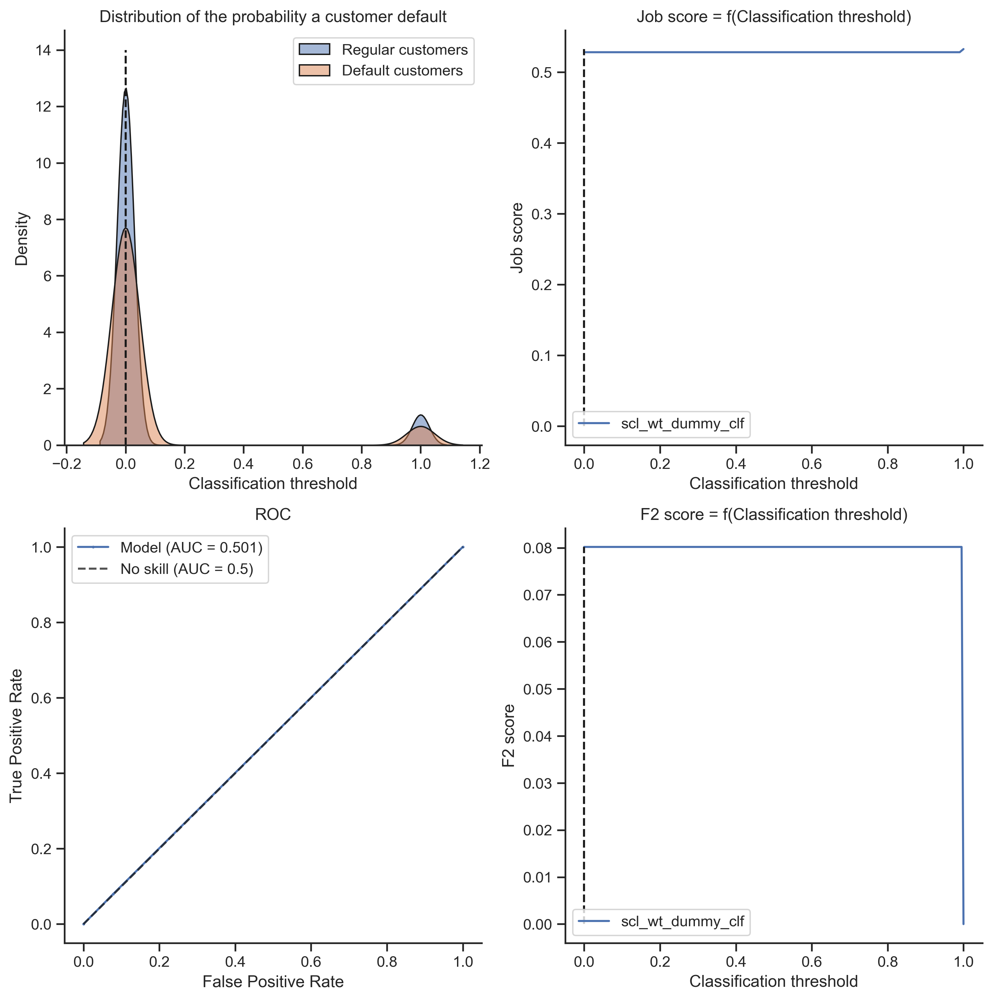

Confusion matrix:


,True negatives,True positives
Predicted negatives,TN: 62528,FN: 5483
Predicted positives,FP: 5315,TP: 475


,True negatives,True positives
Predicted negatives,TN: 85 %,FN: 7 %
Predicted positives,FP: 7 %,TP: 1 %


Updating entry...
Done!


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F1_score_train,...,"Confusion_matrix_values_train ([TP, FP, FN, TN])","Confusion_matrix_values_test ([TP, FP, FN, TN])",Sensitivity_train,Sensitivity_test,Specificity_train,Specificity_test,Accuracy_train,Accuracy_test,Precision_train,Precision_test
Model_labels,,,,,,,,,,,,,,,,,,,,,
dummy_clf,"(DummyClassifier(random_state=0, strategy='str...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527832,0.532227,0.500488,0.499268,0.080872,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079712,0.000000,0.921875,1.000000,0.853516,0.919434,0.082031,NaN
logi_reg_clf_opt,"(LogisticRegression(C=1e-05, penalty=None))","[0.033066418095732714, 0.03007705954760686, 0....","[0.07824874203922699, 0.09149148707242516, 0.1...",0.080017,0.080017,0.611328,0.611816,0.651367,0.653320,0.200439,...,"[4027, 30198, 1931, 37645]","[3254, 24103, 1711, 32434]",0.675781,0.655273,0.554688,0.573730,0.564453,0.580078,0.117676,0.118958
rf_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.075, 0.2, 0.025, 0.025, 0.0, 0.225, 0.0, 0....","[0.0, 0.075, 0.15, 0.025, 0.1, 0.1, 0.1, 0.05,...",0.100000,0.075000,0.652739,0.644213,0.700945,0.696554,0.239932,...,"[3518, 19849, 2440, 47994]","[3293, 21060, 1672, 35477]",0.590467,0.663243,0.707427,0.627501,0.697985,0.630386,0.150554,0.135219
xgb_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.025, 0.2, 0.025, 0.075, 0.0, 0.25, 0.0, 0.0...","[0.0, 0.025, 0.125, 0.025, 0.125, 0.175, 0.125...",0.100000,0.100000,0.653940,0.650466,0.700888,0.696130,0.240878,...,"[3532, 19836, 2426, 48007]","[2913, 16596, 2052, 39941]",0.592816,0.586707,0.707619,0.706458,0.698351,0.696790,0.151147,0.149316
lgbm_clf_opt,"(LGBMClassifier(colsample_bytree=0.7, learning...","[0.021936205597345243, 0.029568041126756296, 0...","[0.031716460534315975, 0.06559982930144571, 0....",0.070000,0.075000,0.686776,0.689275,0.746162,0.748967,0.268821,...,"[3851, 18842, 2107, 49001]","[3182, 15165, 1783, 41372]",0.646358,0.640886,0.722271,0.731769,0.716142,0.724432,0.169700,0.173434
scl_dummy_clf,"(MinMaxScaler(), DummyClassifier(random_state=...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527989,0.532429,0.500691,0.499301,0.080865,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079725,0.000000,0.921657,1.000000,0.853688,0.919271,0.082038,NaN
scl_logi_reg_clf_opt,"(MinMaxScaler(), LogisticRegression(C=100.0))","[0.035853712231460805, 0.1475082341545223, 0.0...","[0.04184723335839981, 0.04286953092831966, 0.1...",0.075000,0.080000,0.701639,0.698070,0.768655,0.765997,0.271702,...,"[4288, 21318, 1670, 46525]","[3425, 16661, 1540, 39876]",0.719705,0.689829,0.685775,0.705308,0.688514,0.704058,0.167461,0.170517
scl_rf_clf_opt,"(MinMaxScaler(), (DecisionTreeClassifier(max_d...","[0.075, 0.3, 0.05, 0.0, 0.025, 0.275, 0.0, 0.1...","[0.05, 0.0, 0.075, 0.05, 0.075, 0.125, 0.125, ...",0.100000,0.075000,0.654380,0.645418,0.702637,0.699355,0.241519,...,"[3524, 19700, 2434, 48143]","[3307, 21072, 1658, 35465]",0.591474,0.666062,0.709624,0.627288,0.700085,0.630419,0.151740,0.135650
scl_xgb_clf_opt,"(MinMaxScaler(), XGBClassifier(base_score=None...","[0.021636762, 0.07428472, 0.009730786, 0.01228...","[0.012133582, 0.10084057, 0.08689384, 0.117308...",0.045000,0.035000,0.664025,0.656069,0.722360,0.715501,0.242595,...,"[3923, 22461, 2035, 45382]","[3541, 22281, 1424, 34256]",0.658442,0.713192,0.668927,0.605904,0.668080,0.614565,0.148689,0.137131


In [39]:
# Evaluate the model and store the results in the storage dataframe and MLFlow.
df_MODELS = block_evaluate(model_pl, df_MODELS, model_label,
                           X = X_TRAIN, y = y_TRAIN, cv = SKF_5,
                           eval_dataset = 'train_cv',
                           update_table = UPDATE_TABLE)

# Show the table.
display(df_MODELS)

#### iv. Generalization over the test set


   ### Scores ###

Accuracy  = 0.919
Precision = 0.000
Recall    = 0.000
AUROC     = 0.499
F1        = 0.000
F2        = 0.000
Job score = 0.532

----------------------------------------------------------------------------------------------------



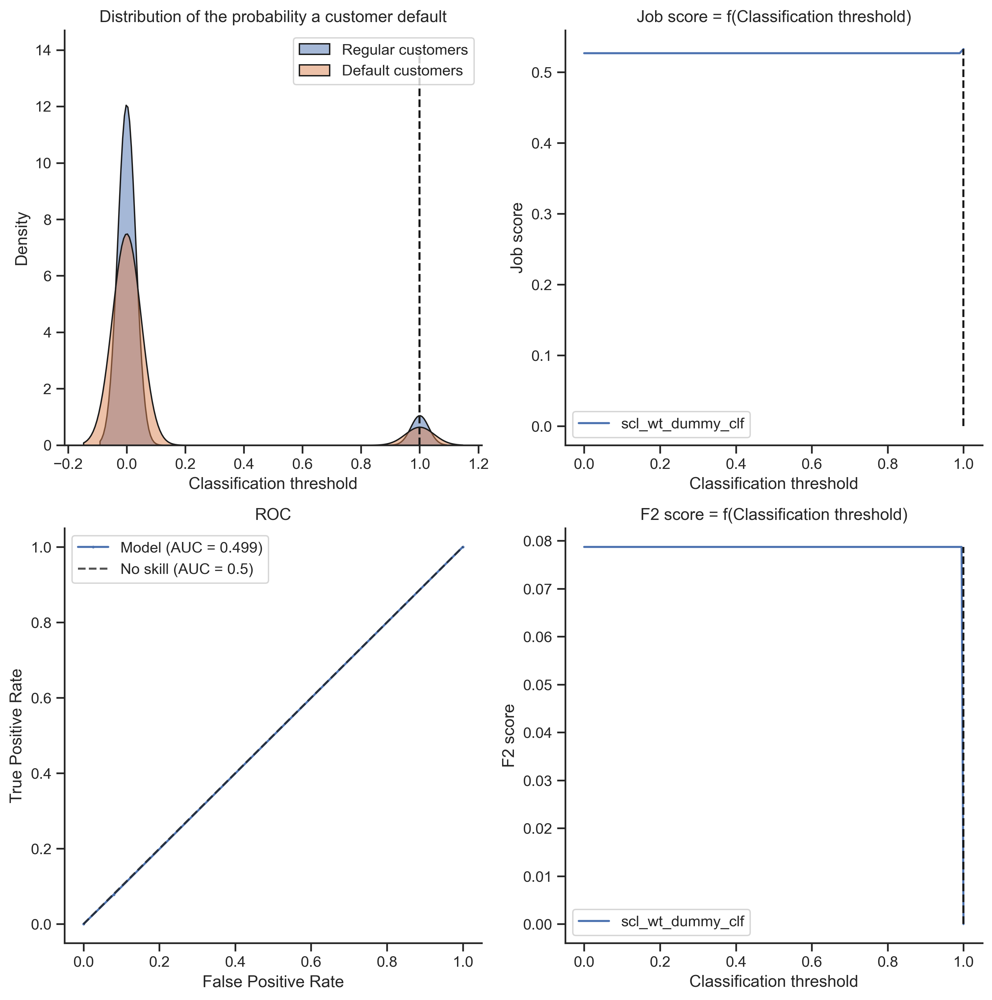

Confusion matrix:


,True negatives,True positives
Predicted negatives,TN: 56537,FN: 4965
Predicted positives,FP: 0,TP: 0


,True negatives,True positives
Predicted negatives,TN: 92 %,FN: 8 %
Predicted positives,FP: 0 %,TP: 0 %


Updating entry...
Done!


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F1_score_train,...,"Confusion_matrix_values_train ([TP, FP, FN, TN])","Confusion_matrix_values_test ([TP, FP, FN, TN])",Sensitivity_train,Sensitivity_test,Specificity_train,Specificity_test,Accuracy_train,Accuracy_test,Precision_train,Precision_test
Model_labels,,,,,,,,,,,,,,,,,,,,,
dummy_clf,"(DummyClassifier(random_state=0, strategy='str...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527832,0.532227,0.500488,0.499268,0.080872,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079712,0.000000,0.921875,1.000000,0.853516,0.919434,0.082031,NaN
logi_reg_clf_opt,"(LogisticRegression(C=1e-05, penalty=None))","[0.033066418095732714, 0.03007705954760686, 0....","[0.07824874203922699, 0.09149148707242516, 0.1...",0.080017,0.080017,0.611328,0.611816,0.651367,0.653320,0.200439,...,"[4027, 30198, 1931, 37645]","[3254, 24103, 1711, 32434]",0.675781,0.655273,0.554688,0.573730,0.564453,0.580078,0.117676,0.118958
rf_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.075, 0.2, 0.025, 0.025, 0.0, 0.225, 0.0, 0....","[0.0, 0.075, 0.15, 0.025, 0.1, 0.1, 0.1, 0.05,...",0.100000,0.075000,0.652739,0.644213,0.700945,0.696554,0.239932,...,"[3518, 19849, 2440, 47994]","[3293, 21060, 1672, 35477]",0.590467,0.663243,0.707427,0.627501,0.697985,0.630386,0.150554,0.135219
xgb_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.025, 0.2, 0.025, 0.075, 0.0, 0.25, 0.0, 0.0...","[0.0, 0.025, 0.125, 0.025, 0.125, 0.175, 0.125...",0.100000,0.100000,0.653940,0.650466,0.700888,0.696130,0.240878,...,"[3532, 19836, 2426, 48007]","[2913, 16596, 2052, 39941]",0.592816,0.586707,0.707619,0.706458,0.698351,0.696790,0.151147,0.149316
lgbm_clf_opt,"(LGBMClassifier(colsample_bytree=0.7, learning...","[0.021936205597345243, 0.029568041126756296, 0...","[0.031716460534315975, 0.06559982930144571, 0....",0.070000,0.075000,0.686776,0.689275,0.746162,0.748967,0.268821,...,"[3851, 18842, 2107, 49001]","[3182, 15165, 1783, 41372]",0.646358,0.640886,0.722271,0.731769,0.716142,0.724432,0.169700,0.173434
scl_dummy_clf,"(MinMaxScaler(), DummyClassifier(random_state=...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527989,0.532429,0.500691,0.499301,0.080865,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079725,0.000000,0.921657,1.000000,0.853688,0.919271,0.082038,NaN
scl_logi_reg_clf_opt,"(MinMaxScaler(), LogisticRegression(C=100.0))","[0.035853712231460805, 0.1475082341545223, 0.0...","[0.04184723335839981, 0.04286953092831966, 0.1...",0.075000,0.080000,0.701639,0.698070,0.768655,0.765997,0.271702,...,"[4288, 21318, 1670, 46525]","[3425, 16661, 1540, 39876]",0.719705,0.689829,0.685775,0.705308,0.688514,0.704058,0.167461,0.170517
scl_rf_clf_opt,"(MinMaxScaler(), (DecisionTreeClassifier(max_d...","[0.075, 0.3, 0.05, 0.0, 0.025, 0.275, 0.0, 0.1...","[0.05, 0.0, 0.075, 0.05, 0.075, 0.125, 0.125, ...",0.100000,0.075000,0.654380,0.645418,0.702637,0.699355,0.241519,...,"[3524, 19700, 2434, 48143]","[3307, 21072, 1658, 35465]",0.591474,0.666062,0.709624,0.627288,0.700085,0.630419,0.151740,0.135650
scl_xgb_clf_opt,"(MinMaxScaler(), XGBClassifier(base_score=None...","[0.021636762, 0.07428472, 0.009730786, 0.01228...","[0.012133582, 0.10084057, 0.08689384, 0.117308...",0.045000,0.035000,0.664025,0.656069,0.722360,0.715501,0.242595,...,"[3923, 22461, 2035, 45382]","[3541, 22281, 1424, 34256]",0.658442,0.713192,0.668927,0.605904,0.668080,0.614565,0.148689,0.137131


In [40]:
# Evaluate the model over the test set and store the results within the storage dataframe.
df_MODELS = block_evaluate(model_pl, df_MODELS, model_label,
                           X = X_TRAIN, y = y_TRAIN, X_test=X_TEST, y_test = y_TEST, cv=0,
                           eval_dataset = 'test',
                           update_table = UPDATE_TABLE)

# Show the table.
display(df_MODELS)

### b) Logistic regressor

#### i. Importation

In [41]:
from sklearn.linear_model import LogisticRegression

#### ii. Creation of the model pipeline

In [42]:
# Initialize the model with its default values.
model = LogisticRegression()

# Add a scaler to transform data prior modelisation.
scaler = SCALER

# Select the class imbalance management method.
imb_process = IMB_PROCESS

# Set the label of the model according to the way imbalaced data is managed.
model_label = select_model_label(imb_process, 'logi_reg_clf_opt')

# Build the model or the pipeline with its default values.
# NB: scaler = MinMaxScaler() as binary categories won't be changed and
#     the distance between all other values of a feature will be kept.
model_pl = set_model_pipeline(model, scaler, imb_process)

# Check the pipeline.
model_pl

Pipeline(steps=[('scaler', MinMaxScaler()), ['model', LogisticRegression()]])

#### iii. Hyperparameters tuning

In [43]:
# Get the list of the model's hyperparameters.
pprint(model_pl.get_params(), compact=True)

{'memory': None,
 'model': LogisticRegression(),
 'model__C': 1.0,
 'model__class_weight': None,
 'model__dual': False,
 'model__fit_intercept': True,
 'model__intercept_scaling': 1,
 'model__l1_ratio': None,
 'model__max_iter': 100,
 'model__multi_class': 'auto',
 'model__n_jobs': None,
 'model__penalty': 'l2',
 'model__random_state': None,
 'model__solver': 'lbfgs',
 'model__tol': 0.0001,
 'model__verbose': 0,
 'model__warm_start': False,
 'scaler': MinMaxScaler(),
 'scaler__clip': False,
 'scaler__copy': True,
 'scaler__feature_range': (0, 1),
 'steps': [('scaler', MinMaxScaler()), ['model', LogisticRegression()]],
 'verbose': False}


In [44]:
### Hyperparameters tuning range setting ###

# Set the value's ranges to try for the selected hypermarameters to tune.
C = [x for x in np.logspace(start=-5, stop=2, num=8)]
penalty = [None, 'l2']


### Building of the hyperparameters' grid ###

# Add the classifier's hyperparameters to tune.
hyperparams_grid = ({'model__C': C,
                     'model__penalty': penalty})


### Add and/or set additional contextual hyperparameters if required ###

# Add the hyperparameters preset of the resampler if needed.
if imb_process == 'Osp':
    hyperparams_grid.update(OSP_GRID)
elif imb_process == 'Usp':
    hyperparams_grid.update(USP_GRID)

# Add a weight hyperparameter for the imbalanced data.
elif imb_process == 'Weight':
    model_pl['model'].set_params(class_weight='balanced')


### Check the results ###    

# Show the hyperparameters list and their associated range of values to try.
print("Hyperameters tuning ranges:")
pprint(hyperparams_grid)

print()

# Show the pipeline models' default hyperparmeters' values.
print("Default values of the model's hyperparameters:")
pprint(model_pl)

Hyperameters tuning ranges:
{'model__C': [1e-05, 0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0],
 'model__penalty': [None, 'l2']}

Default values of the model's hyperparameters:
Pipeline(steps=[('scaler', MinMaxScaler()),
                ['model', LogisticRegression(class_weight='balanced')]])


In [45]:
%%time

# Hyperparameters tuning.
model_pl_opt = block_hyperparams_tune(df=df_MODELS, X=X_TRAIN, y=y_TRAIN, cv=SKF_5, tune=HT,
                                      n_iter=20, grid_loop=1, range_precision=None, rand_state=0,
                                      verbose=2, model_label=model_label)
print()


Best combination of hyperparmaters found:

{'memory': None,
 'model': LogisticRegression(class_weight='balanced'),
 'model__C': 1.0,
 'model__class_weight': 'balanced',
 'model__dual': False,
 'model__fit_intercept': True,
 'model__intercept_scaling': 1,
 'model__l1_ratio': None,
 'model__max_iter': 100,
 'model__multi_class': 'auto',
 'model__n_jobs': None,
 'model__penalty': 'l2',
 'model__random_state': None,
 'model__solver': 'lbfgs',
 'model__tol': 0.0001,
 'model__verbose': 0,
 'model__warm_start': False,
 'scaler': MinMaxScaler(),
 'scaler__clip': False,
 'scaler__copy': True,
 'scaler__feature_range': (0, 1),
 'steps': [('scaler', MinMaxScaler()),
           ['model', LogisticRegression(class_weight='balanced')]],
 'verbose': False}

CPU times: total: 1.16 s
Wall time: 122 ms


#### iv. Evaluation by cross-validation over the train set


   ### Scores ###

Accuracy  = 0.709
Precision = 0.174
Recall    = 0.695
AUROC     = 0.769
F1        = 0.279
F2        = 0.435
Job score = 0.703

----------------------------------------------------------------------------------------------------



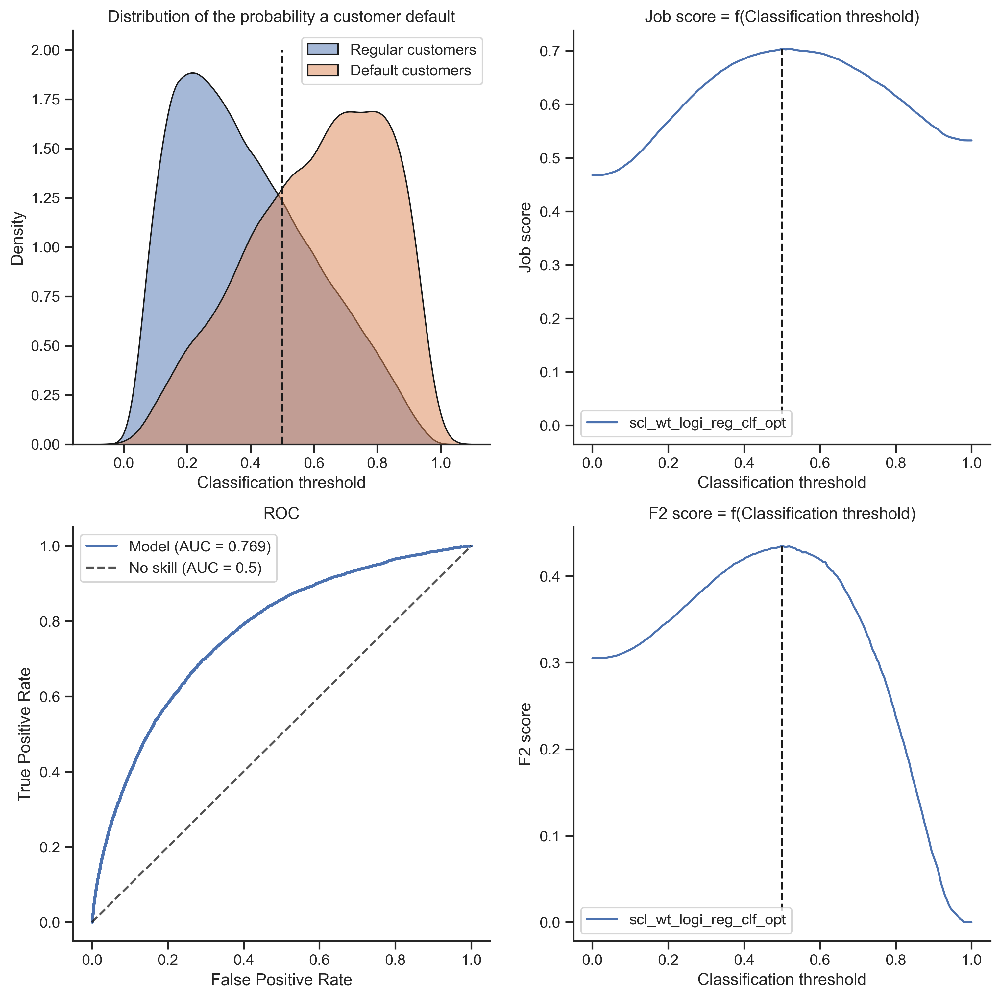

Confusion matrix:


,True negatives,True positives
Predicted negatives,TN: 48221,FN: 1818
Predicted positives,FP: 19622,TP: 4140


,True negatives,True positives
Predicted negatives,TN: 65 %,FN: 2 %
Predicted positives,FP: 27 %,TP: 6 %


Updating entry...
Done!


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F1_score_train,...,"Confusion_matrix_values_train ([TP, FP, FN, TN])","Confusion_matrix_values_test ([TP, FP, FN, TN])",Sensitivity_train,Sensitivity_test,Specificity_train,Specificity_test,Accuracy_train,Accuracy_test,Precision_train,Precision_test
Model_labels,,,,,,,,,,,,,,,,,,,,,
dummy_clf,"(DummyClassifier(random_state=0, strategy='str...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527832,0.532227,0.500488,0.499268,0.080872,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079712,0.000000,0.921875,1.000000,0.853516,0.919434,0.082031,NaN
logi_reg_clf_opt,"(LogisticRegression(C=1e-05, penalty=None))","[0.033066418095732714, 0.03007705954760686, 0....","[0.07824874203922699, 0.09149148707242516, 0.1...",0.080017,0.080017,0.611328,0.611816,0.651367,0.653320,0.200439,...,"[4027, 30198, 1931, 37645]","[3254, 24103, 1711, 32434]",0.675781,0.655273,0.554688,0.573730,0.564453,0.580078,0.117676,0.118958
rf_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.075, 0.2, 0.025, 0.025, 0.0, 0.225, 0.0, 0....","[0.0, 0.075, 0.15, 0.025, 0.1, 0.1, 0.1, 0.05,...",0.100000,0.075000,0.652739,0.644213,0.700945,0.696554,0.239932,...,"[3518, 19849, 2440, 47994]","[3293, 21060, 1672, 35477]",0.590467,0.663243,0.707427,0.627501,0.697985,0.630386,0.150554,0.135219
xgb_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.025, 0.2, 0.025, 0.075, 0.0, 0.25, 0.0, 0.0...","[0.0, 0.025, 0.125, 0.025, 0.125, 0.175, 0.125...",0.100000,0.100000,0.653940,0.650466,0.700888,0.696130,0.240878,...,"[3532, 19836, 2426, 48007]","[2913, 16596, 2052, 39941]",0.592816,0.586707,0.707619,0.706458,0.698351,0.696790,0.151147,0.149316
lgbm_clf_opt,"(LGBMClassifier(colsample_bytree=0.7, learning...","[0.021936205597345243, 0.029568041126756296, 0...","[0.031716460534315975, 0.06559982930144571, 0....",0.070000,0.075000,0.686776,0.689275,0.746162,0.748967,0.268821,...,"[3851, 18842, 2107, 49001]","[3182, 15165, 1783, 41372]",0.646358,0.640886,0.722271,0.731769,0.716142,0.724432,0.169700,0.173434
scl_dummy_clf,"(MinMaxScaler(), DummyClassifier(random_state=...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527989,0.532429,0.500691,0.499301,0.080865,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079725,0.000000,0.921657,1.000000,0.853688,0.919271,0.082038,NaN
scl_logi_reg_clf_opt,"(MinMaxScaler(), LogisticRegression(C=100.0))","[0.035853712231460805, 0.1475082341545223, 0.0...","[0.04184723335839981, 0.04286953092831966, 0.1...",0.075000,0.080000,0.701639,0.698070,0.768655,0.765997,0.271702,...,"[4288, 21318, 1670, 46525]","[3425, 16661, 1540, 39876]",0.719705,0.689829,0.685775,0.705308,0.688514,0.704058,0.167461,0.170517
scl_rf_clf_opt,"(MinMaxScaler(), (DecisionTreeClassifier(max_d...","[0.075, 0.3, 0.05, 0.0, 0.025, 0.275, 0.0, 0.1...","[0.05, 0.0, 0.075, 0.05, 0.075, 0.125, 0.125, ...",0.100000,0.075000,0.654380,0.645418,0.702637,0.699355,0.241519,...,"[3524, 19700, 2434, 48143]","[3307, 21072, 1658, 35465]",0.591474,0.666062,0.709624,0.627288,0.700085,0.630419,0.151740,0.135650
scl_xgb_clf_opt,"(MinMaxScaler(), XGBClassifier(base_score=None...","[0.021636762, 0.07428472, 0.009730786, 0.01228...","[0.012133582, 0.10084057, 0.08689384, 0.117308...",0.045000,0.035000,0.664025,0.656069,0.722360,0.715501,0.242595,...,"[3923, 22461, 2035, 45382]","[3541, 22281, 1424, 34256]",0.658442,0.713192,0.668927,0.605904,0.668080,0.614565,0.148689,0.137131


In [46]:
# Evaluate the model and store the results in the storage dataframe and MLFlow.
df_MODELS = block_evaluate(model_pl_opt, df_MODELS, model_label,
                           X = X_TRAIN, y = y_TRAIN, cv = SKF_5,
                           eval_dataset = 'train_cv',
                           update_table = UPDATE_TABLE)

# Show the table.
display(df_MODELS)

#### v. Generalization over the test set


   ### Scores ###

Accuracy  = 0.669
Precision = 0.161
Recall    = 0.733
AUROC     = 0.766
F1        = 0.264
F2        = 0.428
Job score = 0.696

----------------------------------------------------------------------------------------------------



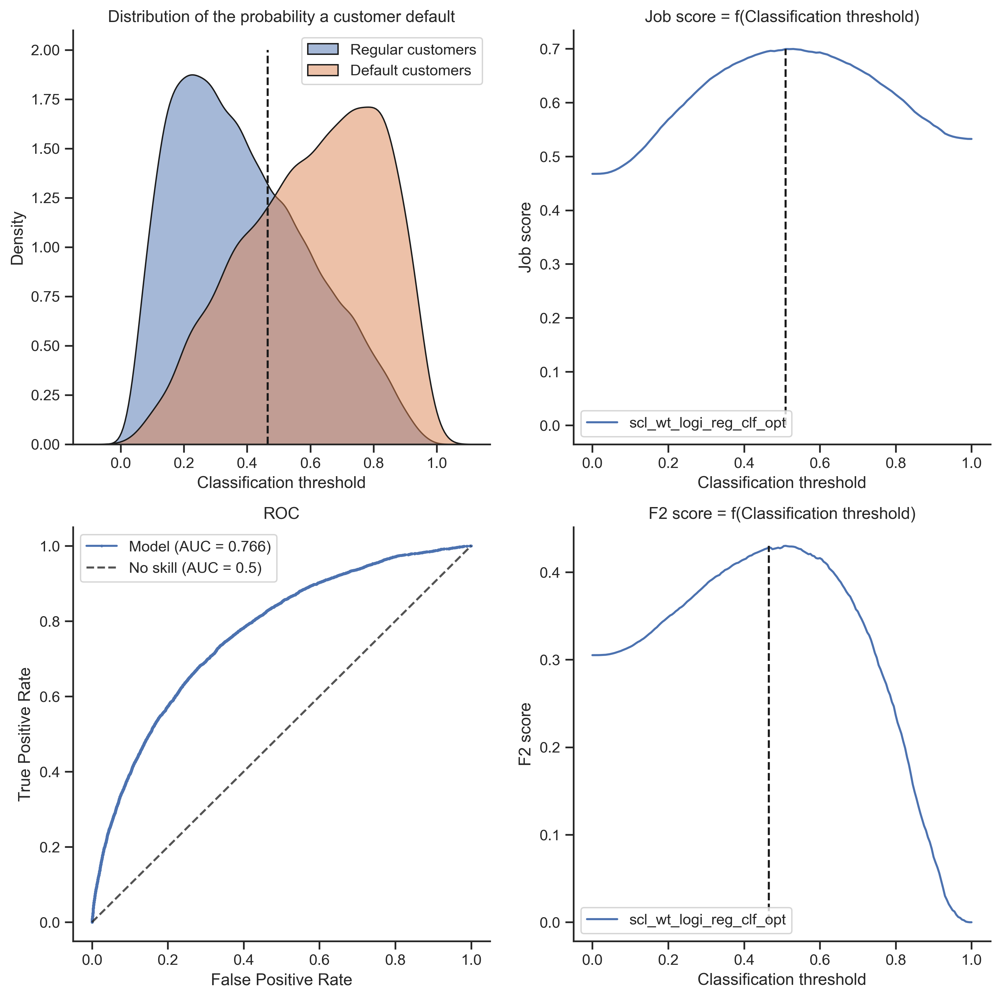

Confusion matrix:


,True negatives,True positives
Predicted negatives,TN: 37523,FN: 1325
Predicted positives,FP: 19014,TP: 3640


,True negatives,True positives
Predicted negatives,TN: 61 %,FN: 2 %
Predicted positives,FP: 31 %,TP: 6 %


Updating entry...
Done!


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F1_score_train,...,"Confusion_matrix_values_train ([TP, FP, FN, TN])","Confusion_matrix_values_test ([TP, FP, FN, TN])",Sensitivity_train,Sensitivity_test,Specificity_train,Specificity_test,Accuracy_train,Accuracy_test,Precision_train,Precision_test
Model_labels,,,,,,,,,,,,,,,,,,,,,
dummy_clf,"(DummyClassifier(random_state=0, strategy='str...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527832,0.532227,0.500488,0.499268,0.080872,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079712,0.000000,0.921875,1.000000,0.853516,0.919434,0.082031,NaN
logi_reg_clf_opt,"(LogisticRegression(C=1e-05, penalty=None))","[0.033066418095732714, 0.03007705954760686, 0....","[0.07824874203922699, 0.09149148707242516, 0.1...",0.080017,0.080017,0.611328,0.611816,0.651367,0.653320,0.200439,...,"[4027, 30198, 1931, 37645]","[3254, 24103, 1711, 32434]",0.675781,0.655273,0.554688,0.573730,0.564453,0.580078,0.117676,0.118958
rf_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.075, 0.2, 0.025, 0.025, 0.0, 0.225, 0.0, 0....","[0.0, 0.075, 0.15, 0.025, 0.1, 0.1, 0.1, 0.05,...",0.100000,0.075000,0.652739,0.644213,0.700945,0.696554,0.239932,...,"[3518, 19849, 2440, 47994]","[3293, 21060, 1672, 35477]",0.590467,0.663243,0.707427,0.627501,0.697985,0.630386,0.150554,0.135219
xgb_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.025, 0.2, 0.025, 0.075, 0.0, 0.25, 0.0, 0.0...","[0.0, 0.025, 0.125, 0.025, 0.125, 0.175, 0.125...",0.100000,0.100000,0.653940,0.650466,0.700888,0.696130,0.240878,...,"[3532, 19836, 2426, 48007]","[2913, 16596, 2052, 39941]",0.592816,0.586707,0.707619,0.706458,0.698351,0.696790,0.151147,0.149316
lgbm_clf_opt,"(LGBMClassifier(colsample_bytree=0.7, learning...","[0.021936205597345243, 0.029568041126756296, 0...","[0.031716460534315975, 0.06559982930144571, 0....",0.070000,0.075000,0.686776,0.689275,0.746162,0.748967,0.268821,...,"[3851, 18842, 2107, 49001]","[3182, 15165, 1783, 41372]",0.646358,0.640886,0.722271,0.731769,0.716142,0.724432,0.169700,0.173434
scl_dummy_clf,"(MinMaxScaler(), DummyClassifier(random_state=...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527989,0.532429,0.500691,0.499301,0.080865,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079725,0.000000,0.921657,1.000000,0.853688,0.919271,0.082038,NaN
scl_logi_reg_clf_opt,"(MinMaxScaler(), LogisticRegression(C=100.0))","[0.035853712231460805, 0.1475082341545223, 0.0...","[0.04184723335839981, 0.04286953092831966, 0.1...",0.075000,0.080000,0.701639,0.698070,0.768655,0.765997,0.271702,...,"[4288, 21318, 1670, 46525]","[3425, 16661, 1540, 39876]",0.719705,0.689829,0.685775,0.705308,0.688514,0.704058,0.167461,0.170517
scl_rf_clf_opt,"(MinMaxScaler(), (DecisionTreeClassifier(max_d...","[0.075, 0.3, 0.05, 0.0, 0.025, 0.275, 0.0, 0.1...","[0.05, 0.0, 0.075, 0.05, 0.075, 0.125, 0.125, ...",0.100000,0.075000,0.654380,0.645418,0.702637,0.699355,0.241519,...,"[3524, 19700, 2434, 48143]","[3307, 21072, 1658, 35465]",0.591474,0.666062,0.709624,0.627288,0.700085,0.630419,0.151740,0.135650
scl_xgb_clf_opt,"(MinMaxScaler(), XGBClassifier(base_score=None...","[0.021636762, 0.07428472, 0.009730786, 0.01228...","[0.012133582, 0.10084057, 0.08689384, 0.117308...",0.045000,0.035000,0.664025,0.656069,0.722360,0.715501,0.242595,...,"[3923, 22461, 2035, 45382]","[3541, 22281, 1424, 34256]",0.658442,0.713192,0.668927,0.605904,0.668080,0.614565,0.148689,0.137131


In [47]:
# Evaluate the model over the test set and store the results within the storage dataframe.
df_MODELS = block_evaluate(model_pl_opt, df_MODELS, model_label,
                           X = X_TRAIN, y = y_TRAIN, X_test=X_TEST, y_test=y_TEST, cv=0,
                           eval_dataset = 'test',
                           update_table = UPDATE_TABLE)

# Show the table.
display(df_MODELS)

### c) Random forest

#### i. Importation

In [48]:
from sklearn.ensemble import RandomForestClassifier

#### ii. Creation of the model pipeline

In [49]:
# Initialize the model with its default values.
model = RandomForestClassifier()

# Add a scaler to transform data prior modelisation.
scaler = SCALER

# Select the class imbalance management method.
imb_process = IMB_PROCESS

# Set the label of the model according to the way imbalaced data is managed.
model_label = select_model_label(imb_process, 'rf_clf_opt')

# Build the model or the pipeline with its default values.
# NB: scaler = MinMaxScaler() as binary categories won't be changed and
#     the distance between all other values of a feature will be kept.
model_pl = set_model_pipeline(model, scaler, imb_process)

# Check the pipeline.
model_pl

Pipeline(steps=[('scaler', MinMaxScaler()),
                ['model', RandomForestClassifier()]])

#### iii. Hyperparameters tuning

In [50]:
# Get the list of the model's hyperparameters.
pprint(model_pl.get_params(), compact=True)

{'memory': None,
 'model': RandomForestClassifier(),
 'model__bootstrap': True,
 'model__ccp_alpha': 0.0,
 'model__class_weight': None,
 'model__criterion': 'gini',
 'model__max_depth': None,
 'model__max_features': 'sqrt',
 'model__max_leaf_nodes': None,
 'model__max_samples': None,
 'model__min_impurity_decrease': 0.0,
 'model__min_samples_leaf': 1,
 'model__min_samples_split': 2,
 'model__min_weight_fraction_leaf': 0.0,
 'model__n_estimators': 100,
 'model__n_jobs': None,
 'model__oob_score': False,
 'model__random_state': None,
 'model__verbose': 0,
 'model__warm_start': False,
 'scaler': MinMaxScaler(),
 'scaler__clip': False,
 'scaler__copy': True,
 'scaler__feature_range': (0, 1),
 'steps': [('scaler', MinMaxScaler()), ['model', RandomForestClassifier()]],
 'verbose': False}


In [51]:
### Hyperparameters tuning range setting ###

# Number of trees in the random forest.
n_estimators = [int(x) for x in np.linspace(start = 0, stop = 50, num = 51)][1:]

# Maximum number of levels in each tree.
max_depth = [int(x) for x in np.linspace(1, 100, num = 11)]

# Minimum number of samples required to split a node.
min_samples_split = [int(x) for x in np.linspace(1, 100, num = 11)]
min_samples_split[0] = 2

# Minimum number of sample per leaf.
min_samples_leaf = [int(x) for x in np.linspace(1, 20, num = 11)]

# Maximum number of nodes (Maximum size of a tree's branch).
max_leaf_nodes = [int(x) for x in np.linspace(50, 200, num = 7)]
max_leaf_nodes[0] = None

# Use or don't bootstrap samples.
#bootstrap = [True, False]

# Number of features to consider at every split.
max_features = [None, 'auto', 'sqrt', 'log2']


### Building of the hyperparameters' grid ###

# Add the classifier's hyperparameters to tune.
hyperparams_grid = {'model__n_estimators': n_estimators,
                    'model__max_depth': max_depth,
                    'model__min_samples_split': min_samples_split,
                    'model__min_samples_leaf': min_samples_leaf,
                    #'model__max_leaf_nodes': max_leaf_nodes,
                    #'model__bootstrap': bootstrap,
                    'model__max_features': max_features,
                   }

In [52]:
### Hyperparameters tuning range setting ###

# Number of trees in the random forest.
n_estimators = [int(x) for x in np.linspace(start = 0, stop = 50, num = 11)][1:]

# Maximum number of levels in each tree.
max_depth = [int(x) for x in np.linspace(1, 100, num = 11)]

# Minimum number of samples required to split a node.
min_samples_split = [int(x) for x in np.linspace(1, 100, num = 11)]
min_samples_split[0] = 2

# Minimum number of sample per leaf.
min_samples_leaf = [int(x) for x in np.linspace(1, 20, num = 11)]

# Maximum number of nodes (Maximum size of a tree's branch).
max_leaf_nodes = [int(x) for x in np.linspace(50, 200, num = 7)]
max_leaf_nodes[0] = None

# Use or don't bootstrap samples.
bootstrap = [True, False]

# Number of features to consider at every split.
max_features = [None, 'auto', 'sqrt', 'log2']


### Building of the hyperparameters' grid ###

# Add the classifier's hyperparameters to tune.
hyperparams_grid = {'model__n_estimators': n_estimators,
                    'model__max_depth': max_depth,
                    'model__min_samples_split': min_samples_split,
                    'model__min_samples_leaf': min_samples_leaf,
                    #'model__max_leaf_nodes': max_leaf_nodes,
                    #'model__bootstrap': bootstrap,
                    'model__max_features': max_features,
                   }


### Add and/or set additional contextual hyperparameters if required ###

# Add the hyperparameters preset of the resampler if needed.
if imb_process == 'Osp':
    hyperparams_grid.update(OSP_GRID)
elif imb_process == 'Usp':
    hyperparams_grid.update(USP_GRID)

# Add a weight hyperparameter for the imbalanced data.
elif imb_process == 'Weight':
    model_pl['model'].set_params(class_weight='balanced')


### Check the results ###    

# Show the hyperparameters list and their associated range of values to try.
print("Hyperameters tuning ranges:")
pprint(hyperparams_grid, compact=True)

print()

# Show the pipeline models' default hyperparmeters' values.
print("Default values of the model's hyperparameters:")
pprint(model_pl)

Hyperameters tuning ranges:
{'model__max_depth': [1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
 'model__max_features': [None, 'auto', 'sqrt', 'log2'],
 'model__min_samples_leaf': [1, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20],
 'model__min_samples_split': [2, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
 'model__n_estimators': [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]}

Default values of the model's hyperparameters:
Pipeline(steps=[('scaler', MinMaxScaler()),
                ['model', RandomForestClassifier(class_weight='balanced')]])


In [53]:
%%time

# Hyperparameters tuning.
model_pl_opt = block_hyperparams_tune(df=df_MODELS, X=X_TRAIN, y=y_TRAIN, cv=SKF_5, tune=HT,
                                      n_iter=3, grid_loop=1, range_precision=None, rand_state=0,
                                      verbose=2, model_label=model_label, final_gscv=False)
print()


Best combination of hyperparmaters found:

{'memory': None,
 'model': RandomForestClassifier(class_weight='balanced'),
 'model__bootstrap': True,
 'model__ccp_alpha': 0.0,
 'model__class_weight': 'balanced',
 'model__criterion': 'gini',
 'model__max_depth': None,
 'model__max_features': 'sqrt',
 'model__max_leaf_nodes': None,
 'model__max_samples': None,
 'model__min_impurity_decrease': 0.0,
 'model__min_samples_leaf': 1,
 'model__min_samples_split': 2,
 'model__min_weight_fraction_leaf': 0.0,
 'model__n_estimators': 100,
 'model__n_jobs': None,
 'model__oob_score': False,
 'model__random_state': None,
 'model__verbose': 0,
 'model__warm_start': False,
 'scaler': MinMaxScaler(),
 'scaler__clip': False,
 'scaler__copy': True,
 'scaler__feature_range': (0, 1),
 'steps': [('scaler', MinMaxScaler()),
           ['model', RandomForestClassifier(class_weight='balanced')]],
 'verbose': False}

CPU times: total: 1.16 s
Wall time: 124 ms


#### iv. Evaluation by cross-validation over the train set


   ### Scores ###

Accuracy  = 0.644
Precision = 0.139
Recall    = 0.659
AUROC     = 0.700
F1        = 0.230
F2        = 0.377
Job score = 0.650

----------------------------------------------------------------------------------------------------



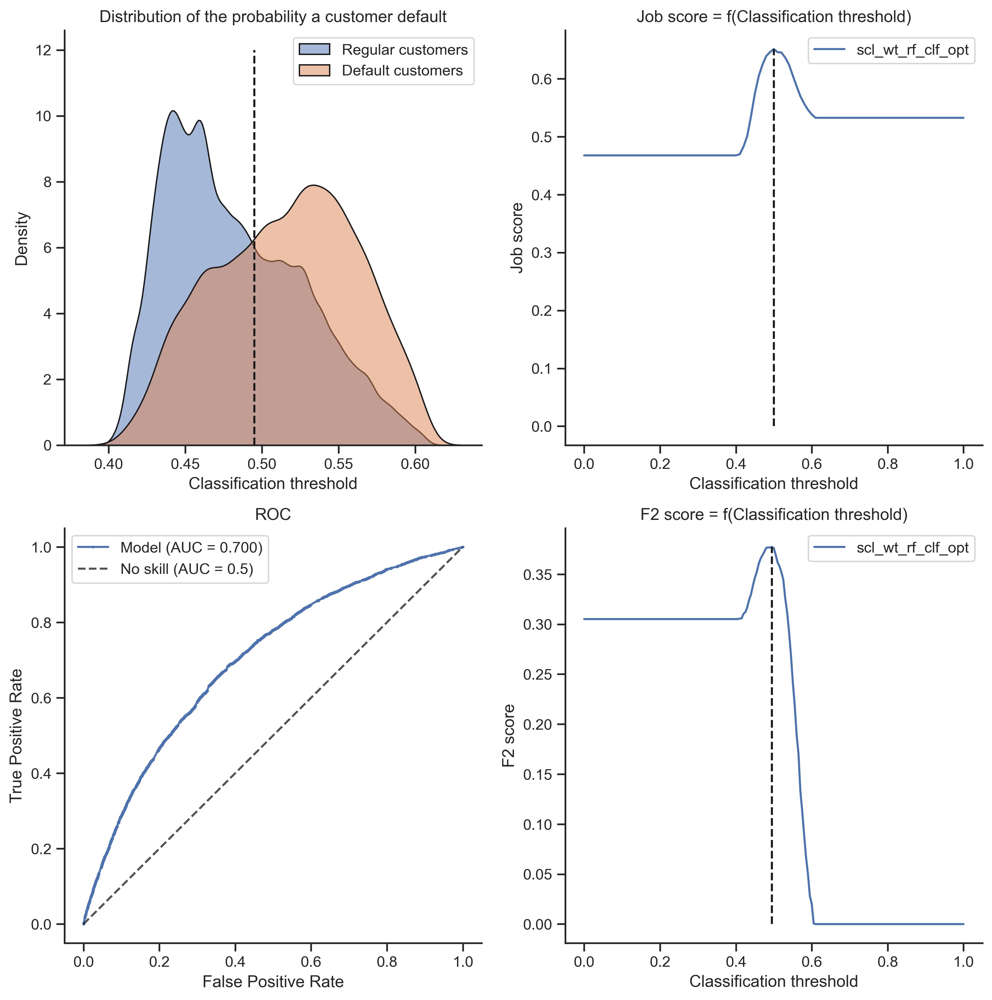

Confusion matrix:


,True negatives,True positives
Predicted negatives,TN: 43572,FN: 2032
Predicted positives,FP: 24271,TP: 3926


,True negatives,True positives
Predicted negatives,TN: 59 %,FN: 3 %
Predicted positives,FP: 33 %,TP: 5 %


Updating entry...
Done!


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F1_score_train,F1_score_test,F2_score_train,F2_score_test,Process_time_train (s),Process_time_test (s),"Confusion_matrix_values_train ([TP, FP, FN, TN])","Confusion_matrix_values_test ([TP, FP, FN, TN])",Sensitivity_train,Sensitivity_test,Specificity_train,Specificity_test,Accuracy_train,Accuracy_test,Precision_train,Precision_test
Model_labels,,,,,,,,,,,,,,,,,,,,,,,,,
dummy_clf,"(DummyClassifier(random_state=0, strategy='stratified'))","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000000,1.000000,0.527832,0.532227,0.500488,0.499268,0.080872,0.000000,0.080200,0.000000,0.478027,0.003998,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079712,0.000000,0.921875,1.000000,0.853516,0.919434,0.082031,NaN
logi_reg_clf_opt,"(LogisticRegression(C=1e-05, penalty=None))","[0.033066418095732714, 0.03007705954760686, 0.17344222279519414, 0.09647487136108307, 0.07808859...","[0.07824874203922699, 0.09149148707242516, 0.13981734877251237, 0.05852108160123277, 0.118669422...",0.080017,0.080017,0.611328,0.611816,0.651367,0.653320,0.200439,0.201294,0.346924,0.344482,14.945312,3.757812,"[4027, 30198, 1931, 37645]","[3254, 24103, 1711, 32434]",0.675781,0.655273,0.554688,0.573730,0.564453,0.580078,0.117676,0.118958
rf_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_state=1201628423), DecisionTreeClassifier(max_dept...","[0.075, 0.2, 0.025, 0.025, 0.0, 0.225, 0.0, 0.15, 0.325, 0.15, 0.15, 0.1, 0.025, 0.125, 0.075, 0...","[0.0, 0.075, 0.15, 0.025, 0.1, 0.1, 0.1, 0.05, 0.1, 0.0, 0.325, 0.025, 0.025, 0.0, 0.0, 0.15, 0....",0.100000,0.075000,0.652739,0.644213,0.700945,0.696554,0.239932,0.224640,0.372677,0.372402,6317.873555,1655.654983,"[3518, 19849, 2440, 47994]","[3293, 21060, 1672, 35477]",0.590467,0.663243,0.707427,0.627501,0.697985,0.630386,0.150554,0.135219
xgb_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_state=90674200), DecisionTreeClassifier(max_depth=...","[0.025, 0.2, 0.025, 0.075, 0.0, 0.25, 0.0, 0.075, 0.2, 0.175, 0.125, 0.075, 0.0, 0.15, 0.1, 0.0,...","[0.0, 0.025, 0.125, 0.025, 0.125, 0.175, 0.125, 0.075, 0.05, 0.025, 0.525, 0.025, 0.0, 0.05, 0.0...",0.100000,0.100000,0.653940,0.650466,0.700888,0.696130,0.240878,0.238049,0.374153,0.369961,6389.598782,1652.960590,"[3532, 19836, 2426, 48007]","[2913, 16596, 2052, 39941]",0.592816,0.586707,0.707619,0.706458,0.698351,0.696790,0.151147,0.149316
lgbm_clf_opt,"(LGBMClassifier(colsample_bytree=0.7, learning_rate=0.3, max_depth=90,\n min_child...","[0.021936205597345243, 0.029568041126756296, 0.02041787188040117, 0.015718219328144982, 0.012333...","[0.031716460534315975, 0.06559982930144571, 0.237373787827351, 0.015561757439220099, 0.051481839...",0.070000,0.075000,0.686776,0.689275,0.746162,0.748967,0.268821,0.272992,0.413864,0.416416,8.210522,1.985998,"[3851, 18842, 2107, 49001]","[3182, 15165, 1783, 41372]",0.646358,0.640886,0.722271,0.731769,0.716142,0.724432,0.169700,0.173434
scl_dummy_clf,"(MinMaxScaler(), DummyClassifier(random_state=0, strategy='stratified'))","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000000,1.000000,0.527989,0.532429,0.500691,0.499301,0.080865,0.000000,0.080177,0.000000,2.107001,0.521998,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079725,0.000000,0.921657,1.000000,0.853688,0.919271,0.082038,NaN
scl_logi_reg_clf_opt,"(MinMaxScaler(), LogisticRegression(C=100.0))","[0.035853712231460805, 0.1475082341545223, 0.029553950569784923, 0.04520307258108902, 0.02008463...","[0.04184723335839981, 0.04286953092831966, 0.14682043294273395, 0.015697336828667037, 0.19396850...",0.075000,0.080000,0

CPU times: total: 27.6 s
Wall time: 24.2 s


In [54]:
%%time

# Evaluate the model and store the results in the storage dataframe and MLFlow.
df_MODELS = block_evaluate(model_pl_opt, df_MODELS, model_label,
                           X = X_TRAIN, y = y_TRAIN, cv = SKF_5,
                           eval_dataset = 'train_cv',
                           update_table = UPDATE_TABLE)

# Show the table.
display_EZ(df_MODELS)

#### v. Generalization over the test set


   ### Scores ###

Accuracy  = 0.654
Precision = 0.146
Recall    = 0.680
AUROC     = 0.716
F1        = 0.241
F2        = 0.393
Job score = 0.665

----------------------------------------------------------------------------------------------------



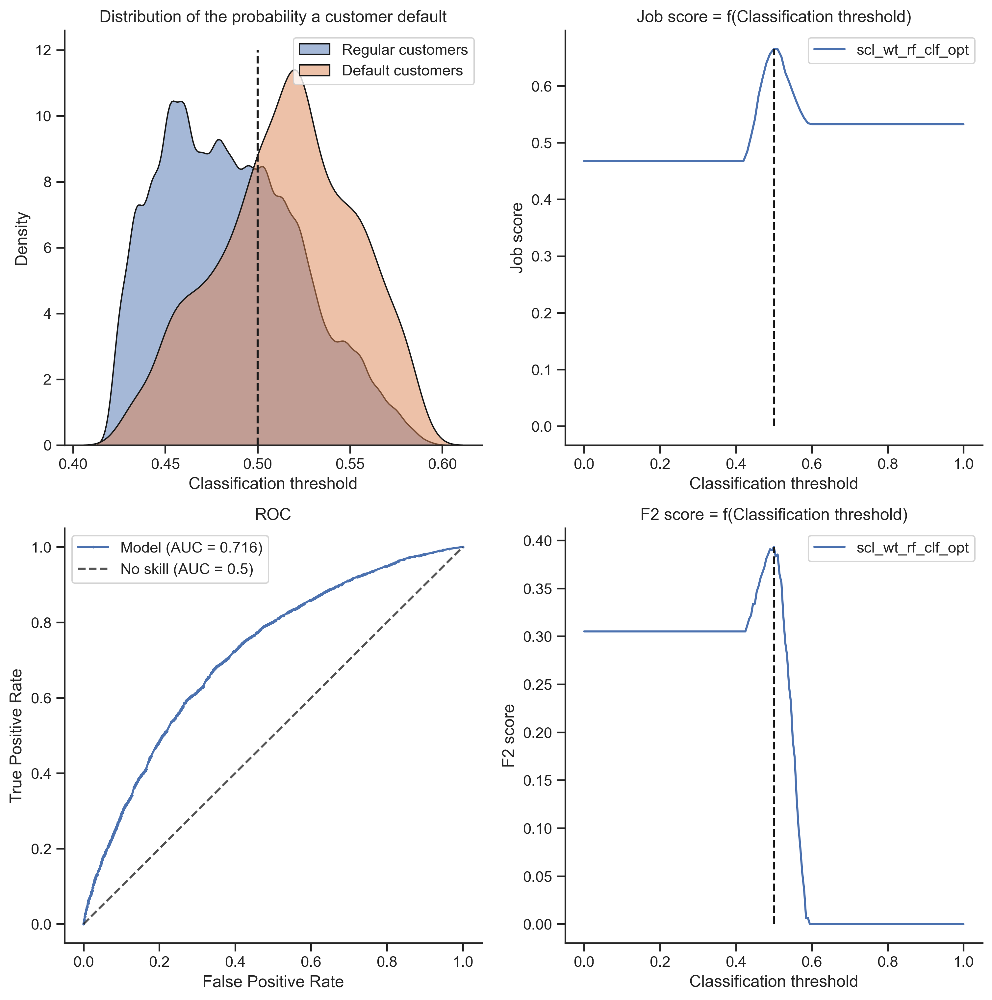

Confusion matrix:


,True negatives,True positives
Predicted negatives,TN: 36839,FN: 1589
Predicted positives,FP: 19698,TP: 3376


,True negatives,True positives
Predicted negatives,TN: 60 %,FN: 3 %
Predicted positives,FP: 32 %,TP: 5 %


Updating entry...
Done!


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F1_score_train,...,"Confusion_matrix_values_train ([TP, FP, FN, TN])","Confusion_matrix_values_test ([TP, FP, FN, TN])",Sensitivity_train,Sensitivity_test,Specificity_train,Specificity_test,Accuracy_train,Accuracy_test,Precision_train,Precision_test
Model_labels,,,,,,,,,,,,,,,,,,,,,
dummy_clf,"(DummyClassifier(random_state=0, strategy='str...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527832,0.532227,0.500488,0.499268,0.080872,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079712,0.000000,0.921875,1.000000,0.853516,0.919434,0.082031,NaN
logi_reg_clf_opt,"(LogisticRegression(C=1e-05, penalty=None))","[0.033066418095732714, 0.03007705954760686, 0....","[0.07824874203922699, 0.09149148707242516, 0.1...",0.080017,0.080017,0.611328,0.611816,0.651367,0.653320,0.200439,...,"[4027, 30198, 1931, 37645]","[3254, 24103, 1711, 32434]",0.675781,0.655273,0.554688,0.573730,0.564453,0.580078,0.117676,0.118958
rf_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.075, 0.2, 0.025, 0.025, 0.0, 0.225, 0.0, 0....","[0.0, 0.075, 0.15, 0.025, 0.1, 0.1, 0.1, 0.05,...",0.100000,0.075000,0.652739,0.644213,0.700945,0.696554,0.239932,...,"[3518, 19849, 2440, 47994]","[3293, 21060, 1672, 35477]",0.590467,0.663243,0.707427,0.627501,0.697985,0.630386,0.150554,0.135219
xgb_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.025, 0.2, 0.025, 0.075, 0.0, 0.25, 0.0, 0.0...","[0.0, 0.025, 0.125, 0.025, 0.125, 0.175, 0.125...",0.100000,0.100000,0.653940,0.650466,0.700888,0.696130,0.240878,...,"[3532, 19836, 2426, 48007]","[2913, 16596, 2052, 39941]",0.592816,0.586707,0.707619,0.706458,0.698351,0.696790,0.151147,0.149316
lgbm_clf_opt,"(LGBMClassifier(colsample_bytree=0.7, learning...","[0.021936205597345243, 0.029568041126756296, 0...","[0.031716460534315975, 0.06559982930144571, 0....",0.070000,0.075000,0.686776,0.689275,0.746162,0.748967,0.268821,...,"[3851, 18842, 2107, 49001]","[3182, 15165, 1783, 41372]",0.646358,0.640886,0.722271,0.731769,0.716142,0.724432,0.169700,0.173434
scl_dummy_clf,"(MinMaxScaler(), DummyClassifier(random_state=...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527989,0.532429,0.500691,0.499301,0.080865,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079725,0.000000,0.921657,1.000000,0.853688,0.919271,0.082038,NaN
scl_logi_reg_clf_opt,"(MinMaxScaler(), LogisticRegression(C=100.0))","[0.035853712231460805, 0.1475082341545223, 0.0...","[0.04184723335839981, 0.04286953092831966, 0.1...",0.075000,0.080000,0.701639,0.698070,0.768655,0.765997,0.271702,...,"[4288, 21318, 1670, 46525]","[3425, 16661, 1540, 39876]",0.719705,0.689829,0.685775,0.705308,0.688514,0.704058,0.167461,0.170517
scl_rf_clf_opt,"(MinMaxScaler(), (DecisionTreeClassifier(max_d...","[0.075, 0.3, 0.05, 0.0, 0.025, 0.275, 0.0, 0.1...","[0.05, 0.0, 0.075, 0.05, 0.075, 0.125, 0.125, ...",0.100000,0.075000,0.654380,0.645418,0.702637,0.699355,0.241519,...,"[3524, 19700, 2434, 48143]","[3307, 21072, 1658, 35465]",0.591474,0.666062,0.709624,0.627288,0.700085,0.630419,0.151740,0.135650
scl_xgb_clf_opt,"(MinMaxScaler(), XGBClassifier(base_score=None...","[0.021636762, 0.07428472, 0.009730786, 0.01228...","[0.012133582, 0.10084057, 0.08689384, 0.117308...",0.045000,0.035000,0.664025,0.656069,0.722360,0.715501,0.242595,...,"[3923, 22461, 2035, 45382]","[3541, 22281, 1424, 34256]",0.658442,0.713192,0.668927,0.605904,0.668080,0.614565,0.148689,0.137131


CPU times: total: 19.9 s
Wall time: 17 s


In [55]:
%%time

# Evaluate the model over the test set and store the results within the storage dataframe.
df_MODELS = block_evaluate(model_pl_opt, df_MODELS, model_label,
                           X = X_TRAIN, y = y_TRAIN, X_test=X_TEST, y_test=y_TEST, cv=0,
                           eval_dataset = 'test',
                           update_table = UPDATE_TABLE)

# Show the table.
display(df_MODELS)

### d) XGBoosting

#### i. Importation

In [56]:
import xgboost as xgb
from xgboost import XGBClassifier

print('XGBoost version:', xgb.__version__)

XGBoost version: 2.0.3


#### ii. Creation of the model pipeline

In [57]:
# Initialize the model with its default values.
model = XGBClassifier(objective='binary:logistic', seed=0)

# Add a scaler to transform data prior modelisation.
scaler = SCALER

# Select the class imbalance management method.
imb_process = IMB_PROCESS

# Set the label of the model according to the way imbalaced data is managed.
model_label = select_model_label(imb_process, 'xgb_clf_opt')

# Build the model or the pipeline with its default values.
# NB: scaler = MinMaxScaler() as binary categories won't be changed and
#     the distance between all other values of a feature will be kept.
model_pl = set_model_pipeline(model, scaler, imb_process)

# Check the pipeline.
model_pl

Pipeline(steps=[('scaler', MinMaxScaler()),
                ['model',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, random_state=None, ...)]])

#### iii. Hyperparameters tuning

In [58]:
# Get the list of the model's hyperparameters.
pprint(model_pl.get_params(), compact=True)

{'memory': None,
 'model': XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...),
 'model__base_score': None,
 'model__booster': None,
 'model__callbacks': None,
 'model__colsample_bylevel': None,
 'model__colsample_bynode': None,
 'model__colsample_bytree': None,
 'model__device': None,
 'model

In [59]:
### Get the optimal number of trees thanks to early stopping ###

# Set the number of runs to perform.
n_es_loop = 5

# Set the xgboost evaluation metric for the early stopping.
# NB: if more than one evaluation metric are given the last one is used for early stopping
model.set_params(eval_metric='auc')

# Run the set amount of loops to get the most promising range of number of trees to get.
verbose = 0
l_n_iters = []
l_scores = []
l_n_trees = []
count = 0
for count in range(n_es_loop):
    model.fit(X_TRAIN, y_TRAIN, early_stopping_rounds=50, eval_set=[(X_TEST, y_TEST)], verbose=verbose)
    l_scores.append(model.best_score)
    l_n_iters.append(model.best_iteration)
    # [Deprecated] l_n_trees.append(model.best_ntree_limit)
    if verbose != 0:
        print()

# Show the results.    
print("Averages gotten on {0} loops. \
      \n Average score: {1}\n Average number of iterations: {2}".\
      format(n_es_loop, np.mean(l_scores), np.mean(l_n_iters))) # , np.mean(l_n_trees) #\n Average number of trees: {3}".\

Averages gotten on 5 loops.       
 Average score: 0.7600332864034837
 Average number of iterations: 27.0


Finally, it appears that the optimal number of estimators depends too much on the other hyperparameters.<br>
=> Thus, the number of estimators obtained here won't be set as default but will be among the hyperparameters to test during the optimization step.

In [60]:
### Hyperparameters tuning range setting ###

# 1. Forest's hyperparameters.

# Learning rate.
eta = [round(x, 2) for x in np.linspace(start=0.02, stop=0.3, num=15)]
#learning_rate = [x for x in np.logspace(-4, 0, 5)], # default 0.1 

# Number of trees in the random forest.
n_estimators = [int(x) for x in np.linspace(2, 50, 25)]


# 2. Tree's hyperparameters.

# Maximum number of levels in each tree.
max_depth = [int(x) for x in np.linspace(1, 100, 11)]

# Defines the minimum sum of weights of all observations required in a child.
min_child_weight = [int(x) for x in np.linspace(1, 10, 10)]

# Specify the minimum loss reduction required to make a split.
gamma = [x for x in np.linspace(0, 0.2, 11)] #uniform(0, 0.5)

# Denotes the fraction of observations to be random samples for each tree.
subsample = [x for x in np.linspace(0.5, 1.0, 6)]

# Denotes the fraction of columns to be random samples for each tree.
colsample_bytree = [x for x in np.linspace(0.5, 1.0, 6)]


# 3. Regulators' hyperparameters.

# L2 regularization term on weights (analogous to Ridge regression).
lambda_regul = [x for x in np.logspace(-4, 0, 5)], # default 0.1

# L1 regularization term on weight (analogous to Lasso regression)
alpha_regul = [x for x in np.logspace(-4, 0, 5)], # default 0.1 


### Building of the hyperparameters' grid ###

# Add the classifier's hyperparameters to tune.
hyperparams_grid = {'model__eta': eta,
                    'model__n_estimators': n_estimators,
                    'model__max_depth': max_depth,
                    'model__min_child_weight': min_child_weight,
                    'model__gamma': gamma,
                    'model__subsample': subsample,
                    'model__colsample_bytree': colsample_bytree
                   }


### Add and/or set additional contextual hyperparameters if required ###

# Add the hyperparameters preset of the resampler if needed.
if imb_process == 'Osp':
    hyperparams_grid.update(OSP_GRID)
elif imb_process == 'Usp':
    hyperparams_grid.update(USP_GRID)

# Add a weight hyperparameter for the imbalanced data.
elif imb_process == 'Weight':
    model_pl['model'].set_params(scale_pos_weight=9) # NB: scale_pos_weight = TN / TP


### Check the results ###    

# Show the hyperparameters list and their associated range of values to try.
print("Hyperameters tuning ranges:")
pprint(hyperparams_grid, compact=True)

print()

# Show the pipeline models' default hyperparmeters' values.
print("Default values of the model's hyperparameters:")
pprint(model_pl)

Hyperameters tuning ranges:
{'model__colsample_bytree': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
 'model__eta': [0.02, 0.04, 0.06, 0.08, 0.1, 0.12, 0.14, 0.16, 0.18, 0.2, 0.22,
                0.24, 0.26, 0.28, 0.3],
 'model__gamma': [0.0, 0.02, 0.04, 0.06, 0.08, 0.1, 0.12, 0.14, 0.16, 0.18,
                  0.2],
 'model__max_depth': [1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
 'model__min_child_weight': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
 'model__n_estimators': [2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30,
                         32, 34, 36, 38, 40, 42, 44, 46, 48, 50],
 'model__subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]}

Default values of the model's hyperparameters:
Pipeline(steps=[('scaler', MinMaxScaler()),
                ['model',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                       

In [61]:
%%time

# Hyperparameters tuning.
model_pl_opt = block_hyperparams_tune(df=df_MODELS, X=X_TRAIN, y=y_TRAIN, cv=SKF_5, tune=HT,
                                      n_iter=5, grid_loop=1, range_precision=None, rand_state=0,
                                      verbose=2, model_label=model_label)
print()


Best combination of hyperparmaters found:

{'memory': None,
 'model': XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='auc', feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...),
 'model__base_score': None,
 'model__booster': None,
 'model__callbacks': None,
 'model__colsample_bylevel': None,
 'model__colsample_bynode': None,
 'model__colsample_b

#### iv. Evaluation by cross-validation over the train set


   ### Scores ###

Accuracy  = 0.688
Precision = 0.155
Recall    = 0.642
AUROC     = 0.723
F1        = 0.249
F2        = 0.394
Job score = 0.668

----------------------------------------------------------------------------------------------------



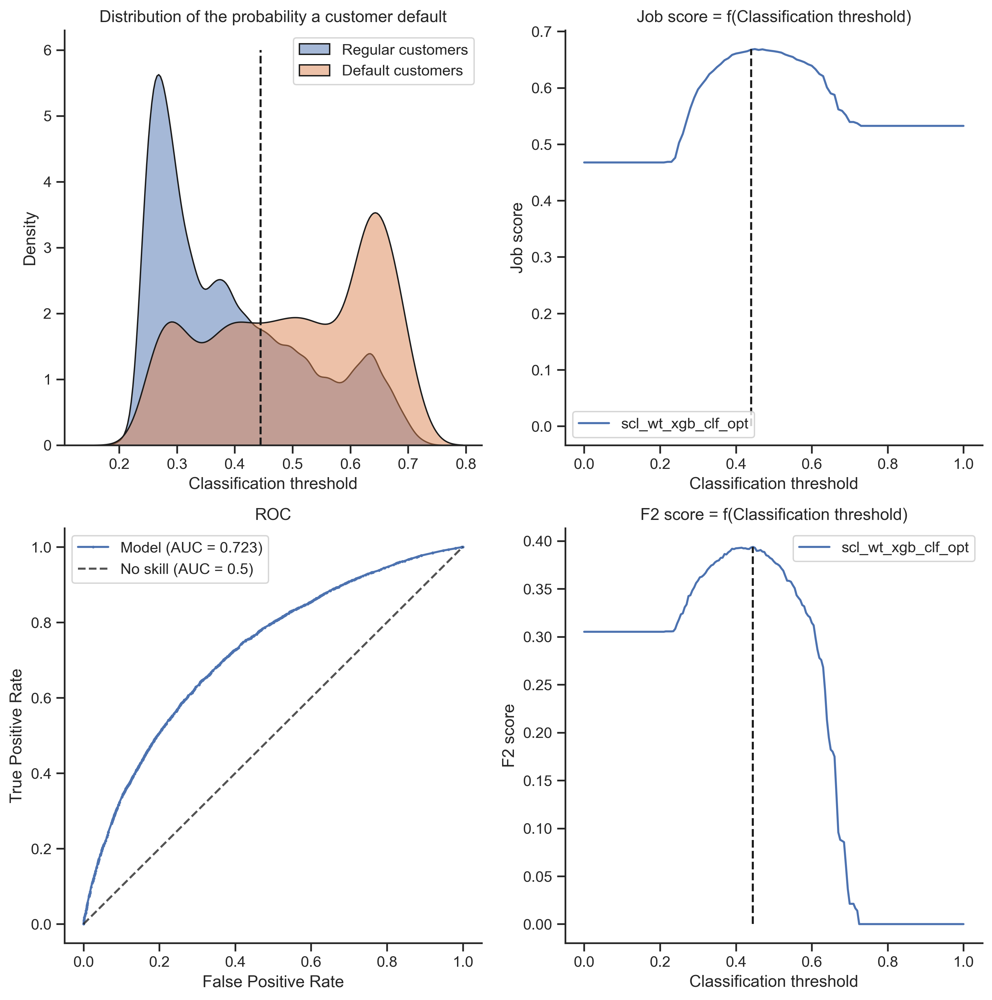

Confusion matrix:


,True negatives,True positives
Predicted negatives,TN: 46943,FN: 2135
Predicted positives,FP: 20900,TP: 3823


,True negatives,True positives
Predicted negatives,TN: 64 %,FN: 3 %
Predicted positives,FP: 28 %,TP: 5 %


Updating entry...
Done!


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F1_score_train,...,"Confusion_matrix_values_train ([TP, FP, FN, TN])","Confusion_matrix_values_test ([TP, FP, FN, TN])",Sensitivity_train,Sensitivity_test,Specificity_train,Specificity_test,Accuracy_train,Accuracy_test,Precision_train,Precision_test
Model_labels,,,,,,,,,,,,,,,,,,,,,
dummy_clf,"(DummyClassifier(random_state=0, strategy='str...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527832,0.532227,0.500488,0.499268,0.080872,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079712,0.000000,0.921875,1.000000,0.853516,0.919434,0.082031,NaN
logi_reg_clf_opt,"(LogisticRegression(C=1e-05, penalty=None))","[0.033066418095732714, 0.03007705954760686, 0....","[0.07824874203922699, 0.09149148707242516, 0.1...",0.080017,0.080017,0.611328,0.611816,0.651367,0.653320,0.200439,...,"[4027, 30198, 1931, 37645]","[3254, 24103, 1711, 32434]",0.675781,0.655273,0.554688,0.573730,0.564453,0.580078,0.117676,0.118958
rf_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.075, 0.2, 0.025, 0.025, 0.0, 0.225, 0.0, 0....","[0.0, 0.075, 0.15, 0.025, 0.1, 0.1, 0.1, 0.05,...",0.100000,0.075000,0.652739,0.644213,0.700945,0.696554,0.239932,...,"[3518, 19849, 2440, 47994]","[3293, 21060, 1672, 35477]",0.590467,0.663243,0.707427,0.627501,0.697985,0.630386,0.150554,0.135219
xgb_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.025, 0.2, 0.025, 0.075, 0.0, 0.25, 0.0, 0.0...","[0.0, 0.025, 0.125, 0.025, 0.125, 0.175, 0.125...",0.100000,0.100000,0.653940,0.650466,0.700888,0.696130,0.240878,...,"[3532, 19836, 2426, 48007]","[2913, 16596, 2052, 39941]",0.592816,0.586707,0.707619,0.706458,0.698351,0.696790,0.151147,0.149316
lgbm_clf_opt,"(LGBMClassifier(colsample_bytree=0.7, learning...","[0.021936205597345243, 0.029568041126756296, 0...","[0.031716460534315975, 0.06559982930144571, 0....",0.070000,0.075000,0.686776,0.689275,0.746162,0.748967,0.268821,...,"[3851, 18842, 2107, 49001]","[3182, 15165, 1783, 41372]",0.646358,0.640886,0.722271,0.731769,0.716142,0.724432,0.169700,0.173434
scl_dummy_clf,"(MinMaxScaler(), DummyClassifier(random_state=...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527989,0.532429,0.500691,0.499301,0.080865,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079725,0.000000,0.921657,1.000000,0.853688,0.919271,0.082038,NaN
scl_logi_reg_clf_opt,"(MinMaxScaler(), LogisticRegression(C=100.0))","[0.035853712231460805, 0.1475082341545223, 0.0...","[0.04184723335839981, 0.04286953092831966, 0.1...",0.075000,0.080000,0.701639,0.698070,0.768655,0.765997,0.271702,...,"[4288, 21318, 1670, 46525]","[3425, 16661, 1540, 39876]",0.719705,0.689829,0.685775,0.705308,0.688514,0.704058,0.167461,0.170517
scl_rf_clf_opt,"(MinMaxScaler(), (DecisionTreeClassifier(max_d...","[0.075, 0.3, 0.05, 0.0, 0.025, 0.275, 0.0, 0.1...","[0.05, 0.0, 0.075, 0.05, 0.075, 0.125, 0.125, ...",0.100000,0.075000,0.654380,0.645418,0.702637,0.699355,0.241519,...,"[3524, 19700, 2434, 48143]","[3307, 21072, 1658, 35465]",0.591474,0.666062,0.709624,0.627288,0.700085,0.630419,0.151740,0.135650
scl_xgb_clf_opt,"(MinMaxScaler(), XGBClassifier(base_score=None...","[0.021636762, 0.07428472, 0.009730786, 0.01228...","[0.012133582, 0.10084057, 0.08689384, 0.117308...",0.045000,0.035000,0.664025,0.656069,0.722360,0.715501,0.242595,...,"[3923, 22461, 2035, 45382]","[3541, 22281, 1424, 34256]",0.658442,0.713192,0.668927,0.605904,0.668080,0.614565,0.148689,0.137131


In [62]:
# Evaluate the model and store the results in the storage dataframe and MLFlow.
df_MODELS = block_evaluate(model_pl_opt, df_MODELS, model_label,
                           X = X_TRAIN, y = y_TRAIN, cv = SKF_5,
                           eval_dataset = 'train_cv',
                           update_table = UPDATE_TABLE)

# Show the table.
display(df_MODELS)

#### v. Generalization over the test set


   ### Scores ###

Accuracy  = 0.679
Precision = 0.153
Recall    = 0.655
AUROC     = 0.725
F1        = 0.248
F2        = 0.395
Job score = 0.669

----------------------------------------------------------------------------------------------------



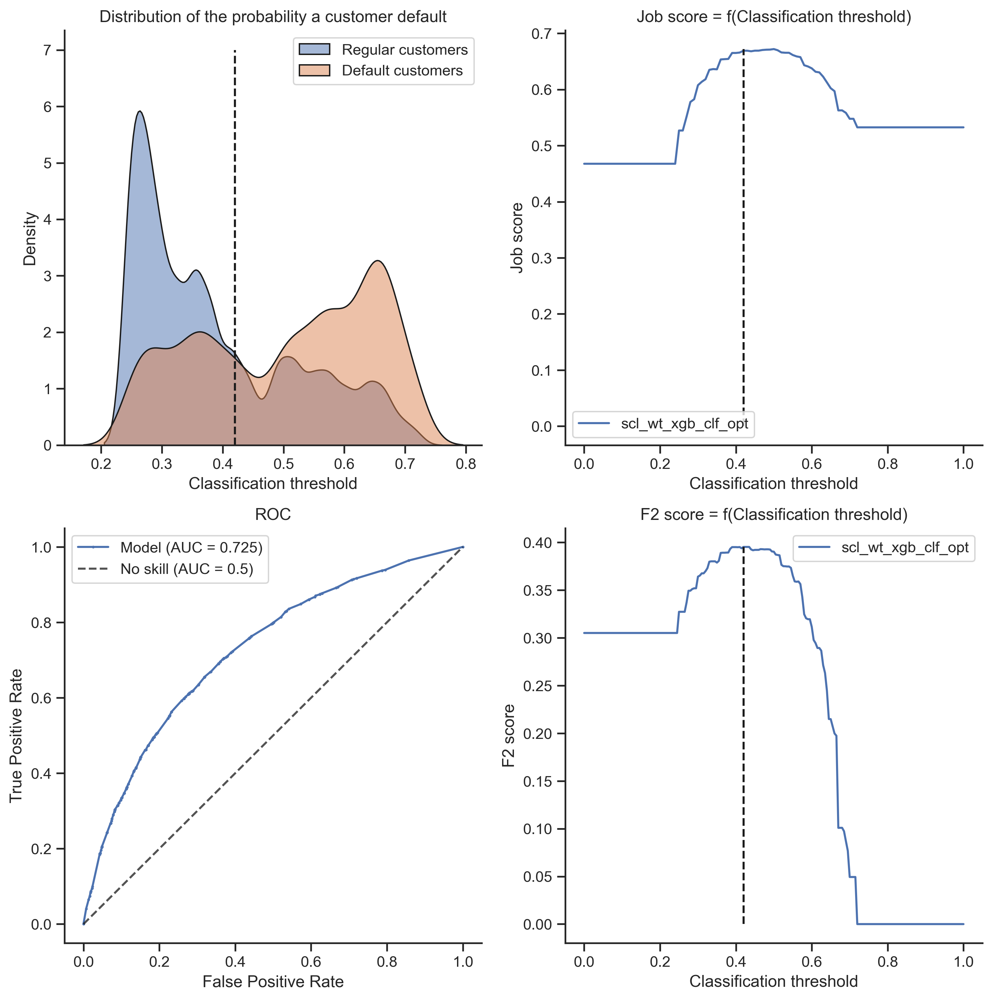

Confusion matrix:


,True negatives,True positives
Predicted negatives,TN: 38493,FN: 1711
Predicted positives,FP: 18044,TP: 3254


,True negatives,True positives
Predicted negatives,TN: 63 %,FN: 3 %
Predicted positives,FP: 29 %,TP: 5 %


Updating entry...
Done!


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F1_score_train,...,"Confusion_matrix_values_train ([TP, FP, FN, TN])","Confusion_matrix_values_test ([TP, FP, FN, TN])",Sensitivity_train,Sensitivity_test,Specificity_train,Specificity_test,Accuracy_train,Accuracy_test,Precision_train,Precision_test
Model_labels,,,,,,,,,,,,,,,,,,,,,
dummy_clf,"(DummyClassifier(random_state=0, strategy='str...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527832,0.532227,0.500488,0.499268,0.080872,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079712,0.000000,0.921875,1.000000,0.853516,0.919434,0.082031,NaN
logi_reg_clf_opt,"(LogisticRegression(C=1e-05, penalty=None))","[0.033066418095732714, 0.03007705954760686, 0....","[0.07824874203922699, 0.09149148707242516, 0.1...",0.080017,0.080017,0.611328,0.611816,0.651367,0.653320,0.200439,...,"[4027, 30198, 1931, 37645]","[3254, 24103, 1711, 32434]",0.675781,0.655273,0.554688,0.573730,0.564453,0.580078,0.117676,0.118958
rf_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.075, 0.2, 0.025, 0.025, 0.0, 0.225, 0.0, 0....","[0.0, 0.075, 0.15, 0.025, 0.1, 0.1, 0.1, 0.05,...",0.100000,0.075000,0.652739,0.644213,0.700945,0.696554,0.239932,...,"[3518, 19849, 2440, 47994]","[3293, 21060, 1672, 35477]",0.590467,0.663243,0.707427,0.627501,0.697985,0.630386,0.150554,0.135219
xgb_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.025, 0.2, 0.025, 0.075, 0.0, 0.25, 0.0, 0.0...","[0.0, 0.025, 0.125, 0.025, 0.125, 0.175, 0.125...",0.100000,0.100000,0.653940,0.650466,0.700888,0.696130,0.240878,...,"[3532, 19836, 2426, 48007]","[2913, 16596, 2052, 39941]",0.592816,0.586707,0.707619,0.706458,0.698351,0.696790,0.151147,0.149316
lgbm_clf_opt,"(LGBMClassifier(colsample_bytree=0.7, learning...","[0.021936205597345243, 0.029568041126756296, 0...","[0.031716460534315975, 0.06559982930144571, 0....",0.070000,0.075000,0.686776,0.689275,0.746162,0.748967,0.268821,...,"[3851, 18842, 2107, 49001]","[3182, 15165, 1783, 41372]",0.646358,0.640886,0.722271,0.731769,0.716142,0.724432,0.169700,0.173434
scl_dummy_clf,"(MinMaxScaler(), DummyClassifier(random_state=...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527989,0.532429,0.500691,0.499301,0.080865,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079725,0.000000,0.921657,1.000000,0.853688,0.919271,0.082038,NaN
scl_logi_reg_clf_opt,"(MinMaxScaler(), LogisticRegression(C=100.0))","[0.035853712231460805, 0.1475082341545223, 0.0...","[0.04184723335839981, 0.04286953092831966, 0.1...",0.075000,0.080000,0.701639,0.698070,0.768655,0.765997,0.271702,...,"[4288, 21318, 1670, 46525]","[3425, 16661, 1540, 39876]",0.719705,0.689829,0.685775,0.705308,0.688514,0.704058,0.167461,0.170517
scl_rf_clf_opt,"(MinMaxScaler(), (DecisionTreeClassifier(max_d...","[0.075, 0.3, 0.05, 0.0, 0.025, 0.275, 0.0, 0.1...","[0.05, 0.0, 0.075, 0.05, 0.075, 0.125, 0.125, ...",0.100000,0.075000,0.654380,0.645418,0.702637,0.699355,0.241519,...,"[3524, 19700, 2434, 48143]","[3307, 21072, 1658, 35465]",0.591474,0.666062,0.709624,0.627288,0.700085,0.630419,0.151740,0.135650
scl_xgb_clf_opt,"(MinMaxScaler(), XGBClassifier(base_score=None...","[0.021636762, 0.07428472, 0.009730786, 0.01228...","[0.012133582, 0.10084057, 0.08689384, 0.117308...",0.045000,0.035000,0.664025,0.656069,0.722360,0.715501,0.242595,...,"[3923, 22461, 2035, 45382]","[3541, 22281, 1424, 34256]",0.658442,0.713192,0.668927,0.605904,0.668080,0.614565,0.148689,0.137131


In [63]:
# Evaluate the model over the test set and store the results within the storage dataframe.
df_MODELS = block_evaluate(model_pl_opt, df_MODELS, model_label,
                           X = X_TRAIN, y = y_TRAIN, X_test=X_TEST, y_test=y_TEST, cv=0,
                           eval_dataset = 'test',
                           update_table = UPDATE_TABLE)

# Show the table.
display(df_MODELS)

### e) LightGBM

#### i. Importation

In [64]:
import lightgbm as lgbm
from lightgbm import LGBMClassifier

print('lightgbm version:', lgbm.__version__)

lightgbm version: 3.3.5


#### ii. Creation of the model pipeline

In [65]:
# Initialize the model with its default values.
model = LGBMClassifier(objective='binary', random_state=0)

# Add a scaler to transform data prior modelisation.
scaler = SCALER

# Select the class imbalance management method.
imb_process = IMB_PROCESS

# Set the label of the model according to the way imbalaced data is managed.
model_label = select_model_label(imb_process, 'lgbm_clf_opt')

# Build the model or the pipeline with its default values.
# NB: scaler = MinMaxScaler() as binary categories won't be changed and
#     the distance between all other values of a feature will be kept.
model_pl = set_model_pipeline(model, scaler, imb_process)

# Check the pipeline.
model_pl

Pipeline(steps=[('scaler', MinMaxScaler()),
                ['model', LGBMClassifier(objective='binary', random_state=0)]])

#### iii. Hyperparameters tuning

In [66]:
# Get the list of the model's hyperparameters.
pprint(model_pl.get_params(), compact=True)

{'memory': None,
 'model': LGBMClassifier(objective='binary', random_state=0),
 'model__boosting_type': 'gbdt',
 'model__class_weight': None,
 'model__colsample_bytree': 1.0,
 'model__importance_type': 'split',
 'model__learning_rate': 0.1,
 'model__max_depth': -1,
 'model__min_child_samples': 20,
 'model__min_child_weight': 0.001,
 'model__min_split_gain': 0.0,
 'model__n_estimators': 100,
 'model__n_jobs': -1,
 'model__num_leaves': 31,
 'model__objective': 'binary',
 'model__random_state': 0,
 'model__reg_alpha': 0.0,
 'model__reg_lambda': 0.0,
 'model__silent': 'warn',
 'model__subsample': 1.0,
 'model__subsample_for_bin': 200000,
 'model__subsample_freq': 0,
 'scaler': MinMaxScaler(),
 'scaler__clip': False,
 'scaler__copy': True,
 'scaler__feature_range': (0, 1),
 'steps': [('scaler', MinMaxScaler()),
           ['model', LGBMClassifier(objective='binary', random_state=0)]],
 'verbose': False}


In [67]:
### Hyperparameters tuning range setting ###

# 1. Forest's hyperparameters.

# Learning rate.
learning_rate = [round(x, 2) for x in np.linspace(start=0.0, stop=0.3, num=16)]
learning_rate[0] = 0.001
#learning_rate = [x for x in np.logspace(-4, 0, 5)], # default 0.1 

# Number of trees in the random forest.
n_estimators = [int(x) for x in np.linspace(2, 50, 25)]


# 2. Tree's hyperparameters.

# Maximum number of levels in each tree.
max_depth = [int(x) for x in np.linspace(1, 100, 11)]

# Defines the minimum sum of weights of all observations required in a child.
min_child_weight = [int(x) for x in np.linspace(1, 10, 10)]

# Specify the minimum loss reduction required to make a split.
#gamma = [x for x in np.linspace(0, 0.2, 11)] #uniform(0, 0.5)

# Denotes the fraction of observations to be random samples for each tree.
subsample = [x for x in np.linspace(0.5, 1.0, 6)]

# Denotes the fraction of columns to be random samples for each tree.
colsample_bytree = [x for x in np.linspace(0.5, 1.0, 6)]


# 3. Regulators' hyperparameters.

# L2 regularization term on weights (analogous to Ridge regression).
reg_lambda = [x for x in np.logspace(-4, 0, 5)] # default 0.1

# L1 regularization term on weight (analogous to Lasso regression)
reg_alpha = [x for x in np.logspace(-4, 0, 5)] # default 0.1 


### Building of the hyperparameters' grid ###

# Add the classifier's hyperparameters to tune.
hyperparams_grid = {'model__learning_rate': learning_rate,
                    'model__n_estimators': n_estimators,
                    'model__max_depth': max_depth,
                    'model__min_child_weight': min_child_weight,
                    #'model__gamma': gamma,
                    'model__subsample': subsample,
                    'model__colsample_bytree': colsample_bytree,
                    'model__reg_lambda': reg_lambda,
                    'model__reg_alpha': reg_alpha
                   }


### Add and/or set additional contextual hyperparameters if required ###

# Add the hyperparameters preset of the resampler if needed.
if imb_process == 'Osp':
    hyperparams_grid.update(OSP_GRID)
elif imb_process == 'Usp':
    hyperparams_grid.update(USP_GRID)

# Add a weight hyperparameter for the imbalanced data.
elif imb_process == 'Weight':
    model_pl['model'].set_params(class_weight='balanced')


### Check the results ###    

# Show the hyperparameters list and their associated range of values to try.
print("Hyperameters tuning ranges:")
pprint(hyperparams_grid, compact=True)

print()

# Show the pipeline models' default hyperparmeters' values.
print("Default values of the model's hyperparameters:")
pprint(model_pl)

Hyperameters tuning ranges:
{'model__colsample_bytree': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
 'model__learning_rate': [0.001, 0.02, 0.04, 0.06, 0.08, 0.1, 0.12, 0.14, 0.16,
                          0.18, 0.2, 0.22, 0.24, 0.26, 0.28, 0.3],
 'model__max_depth': [1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
 'model__min_child_weight': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
 'model__n_estimators': [2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30,
                         32, 34, 36, 38, 40, 42, 44, 46, 48, 50],
 'model__reg_alpha': [0.0001, 0.001, 0.01, 0.1, 1.0],
 'model__reg_lambda': [0.0001, 0.001, 0.01, 0.1, 1.0],
 'model__subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]}

Default values of the model's hyperparameters:
Pipeline(steps=[('scaler', MinMaxScaler()),
                ['model',
                 LGBMClassifier(class_weight='balanced', objective='binary',
                                random_state=0)]])


In [68]:
%%time

# Hyperparameters tuning.
model_pl_opt = block_hyperparams_tune(df=df_MODELS, X=X_TRAIN, y=y_TRAIN, cv=SKF_5, tune=HT,
                                      n_iter=20, grid_loop=1, range_precision=None, rand_state=0,
                                      verbose=2, model_label=model_label)
print()


Best combination of hyperparmaters found:

{'memory': None,
 'model': LGBMClassifier(class_weight='balanced', objective='binary', random_state=0),
 'model__boosting_type': 'gbdt',
 'model__class_weight': 'balanced',
 'model__colsample_bytree': 1.0,
 'model__importance_type': 'split',
 'model__learning_rate': 0.1,
 'model__max_depth': -1,
 'model__min_child_samples': 20,
 'model__min_child_weight': 0.001,
 'model__min_split_gain': 0.0,
 'model__n_estimators': 100,
 'model__n_jobs': -1,
 'model__num_leaves': 31,
 'model__objective': 'binary',
 'model__random_state': 0,
 'model__reg_alpha': 0.0,
 'model__reg_lambda': 0.0,
 'model__silent': 'warn',
 'model__subsample': 1.0,
 'model__subsample_for_bin': 200000,
 'model__subsample_freq': 0,
 'scaler': MinMaxScaler(),
 'scaler__clip': False,
 'scaler__copy': True,
 'scaler__feature_range': (0, 1),
 'steps': [('scaler', MinMaxScaler()),
           ['model',
            LGBMClassifier(class_weight='balanced', objective='binary', random_state=0

#### iv. Evaluation by cross-validation over the train set


   ### Scores ###

Accuracy  = 0.682
Precision = 0.165
Recall    = 0.727
AUROC     = 0.770
F1        = 0.269
F2        = 0.433
Job score = 0.701

----------------------------------------------------------------------------------------------------



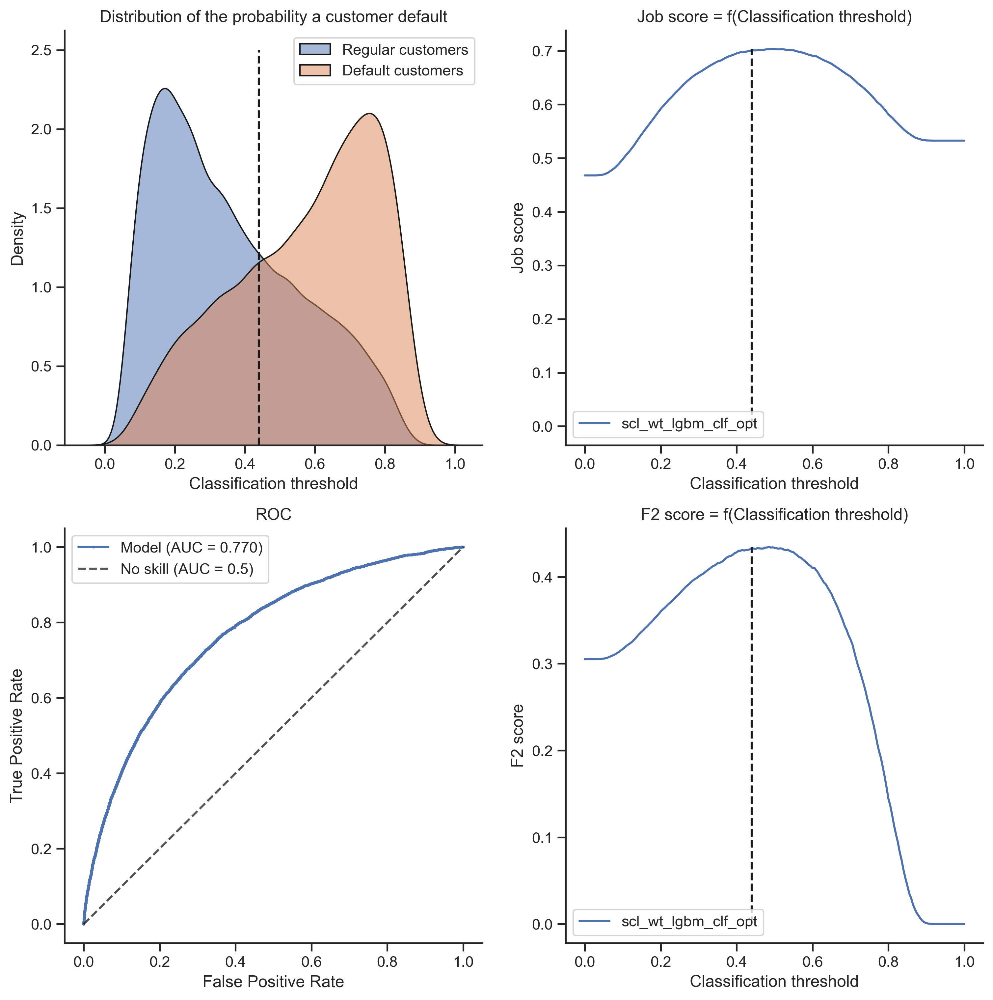

Confusion matrix:


,True negatives,True positives
Predicted negatives,TN: 45990,FN: 1627
Predicted positives,FP: 21853,TP: 4331


,True negatives,True positives
Predicted negatives,TN: 62 %,FN: 2 %
Predicted positives,FP: 30 %,TP: 6 %


Updating entry...
Done!


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F1_score_train,...,"Confusion_matrix_values_train ([TP, FP, FN, TN])","Confusion_matrix_values_test ([TP, FP, FN, TN])",Sensitivity_train,Sensitivity_test,Specificity_train,Specificity_test,Accuracy_train,Accuracy_test,Precision_train,Precision_test
Model_labels,,,,,,,,,,,,,,,,,,,,,
dummy_clf,"(DummyClassifier(random_state=0, strategy='str...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527832,0.532227,0.500488,0.499268,0.080872,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079712,0.000000,0.921875,1.000000,0.853516,0.919434,0.082031,NaN
logi_reg_clf_opt,"(LogisticRegression(C=1e-05, penalty=None))","[0.033066418095732714, 0.03007705954760686, 0....","[0.07824874203922699, 0.09149148707242516, 0.1...",0.080017,0.080017,0.611328,0.611816,0.651367,0.653320,0.200439,...,"[4027, 30198, 1931, 37645]","[3254, 24103, 1711, 32434]",0.675781,0.655273,0.554688,0.573730,0.564453,0.580078,0.117676,0.118958
rf_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.075, 0.2, 0.025, 0.025, 0.0, 0.225, 0.0, 0....","[0.0, 0.075, 0.15, 0.025, 0.1, 0.1, 0.1, 0.05,...",0.100000,0.075000,0.652739,0.644213,0.700945,0.696554,0.239932,...,"[3518, 19849, 2440, 47994]","[3293, 21060, 1672, 35477]",0.590467,0.663243,0.707427,0.627501,0.697985,0.630386,0.150554,0.135219
xgb_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.025, 0.2, 0.025, 0.075, 0.0, 0.25, 0.0, 0.0...","[0.0, 0.025, 0.125, 0.025, 0.125, 0.175, 0.125...",0.100000,0.100000,0.653940,0.650466,0.700888,0.696130,0.240878,...,"[3532, 19836, 2426, 48007]","[2913, 16596, 2052, 39941]",0.592816,0.586707,0.707619,0.706458,0.698351,0.696790,0.151147,0.149316
lgbm_clf_opt,"(LGBMClassifier(colsample_bytree=0.7, learning...","[0.021936205597345243, 0.029568041126756296, 0...","[0.031716460534315975, 0.06559982930144571, 0....",0.070000,0.075000,0.686776,0.689275,0.746162,0.748967,0.268821,...,"[3851, 18842, 2107, 49001]","[3182, 15165, 1783, 41372]",0.646358,0.640886,0.722271,0.731769,0.716142,0.724432,0.169700,0.173434
scl_dummy_clf,"(MinMaxScaler(), DummyClassifier(random_state=...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527989,0.532429,0.500691,0.499301,0.080865,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079725,0.000000,0.921657,1.000000,0.853688,0.919271,0.082038,NaN
scl_logi_reg_clf_opt,"(MinMaxScaler(), LogisticRegression(C=100.0))","[0.035853712231460805, 0.1475082341545223, 0.0...","[0.04184723335839981, 0.04286953092831966, 0.1...",0.075000,0.080000,0.701639,0.698070,0.768655,0.765997,0.271702,...,"[4288, 21318, 1670, 46525]","[3425, 16661, 1540, 39876]",0.719705,0.689829,0.685775,0.705308,0.688514,0.704058,0.167461,0.170517
scl_rf_clf_opt,"(MinMaxScaler(), (DecisionTreeClassifier(max_d...","[0.075, 0.3, 0.05, 0.0, 0.025, 0.275, 0.0, 0.1...","[0.05, 0.0, 0.075, 0.05, 0.075, 0.125, 0.125, ...",0.100000,0.075000,0.654380,0.645418,0.702637,0.699355,0.241519,...,"[3524, 19700, 2434, 48143]","[3307, 21072, 1658, 35465]",0.591474,0.666062,0.709624,0.627288,0.700085,0.630419,0.151740,0.135650
scl_xgb_clf_opt,"(MinMaxScaler(), XGBClassifier(base_score=None...","[0.021636762, 0.07428472, 0.009730786, 0.01228...","[0.012133582, 0.10084057, 0.08689384, 0.117308...",0.045000,0.035000,0.664025,0.656069,0.722360,0.715501,0.242595,...,"[3923, 22461, 2035, 45382]","[3541, 22281, 1424, 34256]",0.658442,0.713192,0.668927,0.605904,0.668080,0.614565,0.148689,0.137131


In [69]:
# Evaluate the model and store the results in the storage dataframe and MLFlow.
df_MODELS = block_evaluate(model_pl_opt, df_MODELS, model_label,
                           X = X_TRAIN, y = y_TRAIN, cv = SKF_5,
                           eval_dataset = 'train_cv',
                           update_table = UPDATE_TABLE)

# Show the table.
display(df_MODELS)

#### v. Generalization over the test set


   ### Scores ###

Accuracy  = 0.685
Precision = 0.166
Recall    = 0.722
AUROC     = 0.772
F1        = 0.270
F2        = 0.433
Job score = 0.701

----------------------------------------------------------------------------------------------------



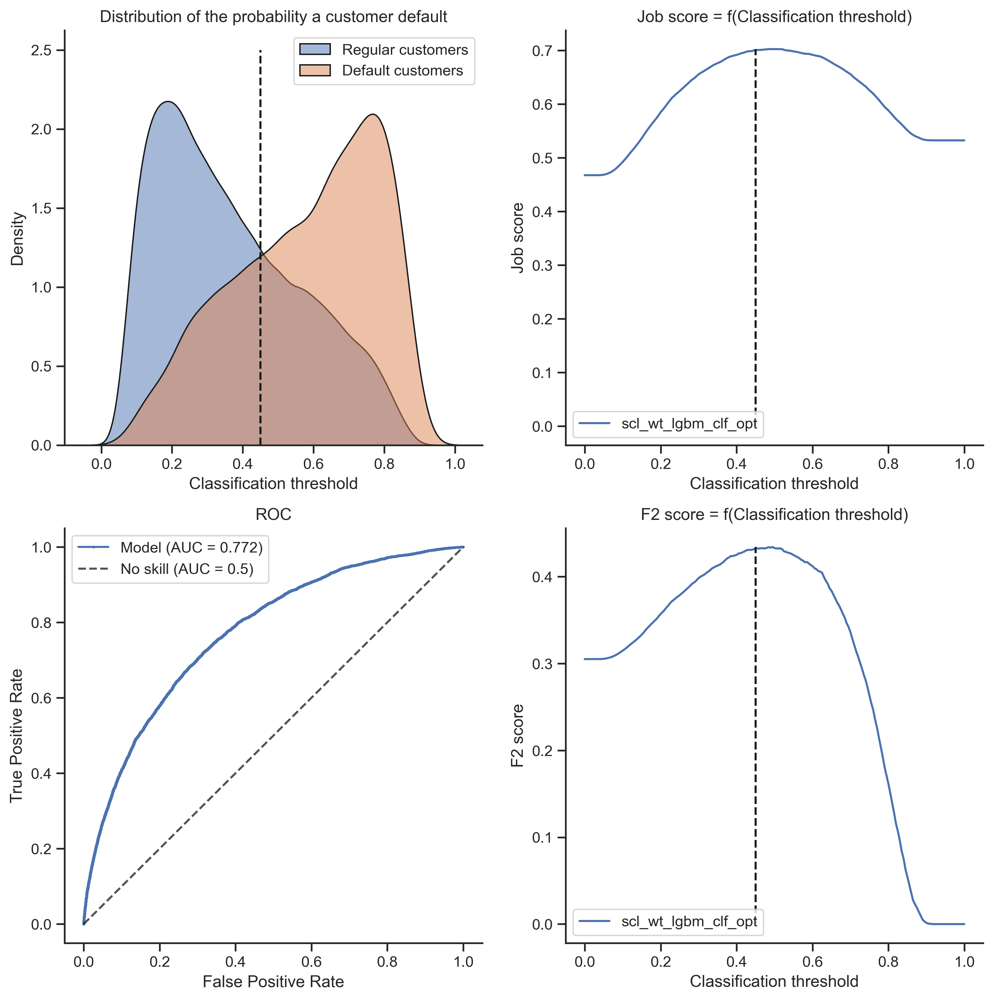

Confusion matrix:


,True negatives,True positives
Predicted negatives,TN: 38570,FN: 1381
Predicted positives,FP: 17967,TP: 3584


,True negatives,True positives
Predicted negatives,TN: 63 %,FN: 2 %
Predicted positives,FP: 29 %,TP: 6 %


Updating entry...
Done!


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F1_score_train,...,"Confusion_matrix_values_train ([TP, FP, FN, TN])","Confusion_matrix_values_test ([TP, FP, FN, TN])",Sensitivity_train,Sensitivity_test,Specificity_train,Specificity_test,Accuracy_train,Accuracy_test,Precision_train,Precision_test
Model_labels,,,,,,,,,,,,,,,,,,,,,
dummy_clf,"(DummyClassifier(random_state=0, strategy='str...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527832,0.532227,0.500488,0.499268,0.080872,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079712,0.000000,0.921875,1.000000,0.853516,0.919434,0.082031,NaN
logi_reg_clf_opt,"(LogisticRegression(C=1e-05, penalty=None))","[0.033066418095732714, 0.03007705954760686, 0....","[0.07824874203922699, 0.09149148707242516, 0.1...",0.080017,0.080017,0.611328,0.611816,0.651367,0.653320,0.200439,...,"[4027, 30198, 1931, 37645]","[3254, 24103, 1711, 32434]",0.675781,0.655273,0.554688,0.573730,0.564453,0.580078,0.117676,0.118958
rf_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.075, 0.2, 0.025, 0.025, 0.0, 0.225, 0.0, 0....","[0.0, 0.075, 0.15, 0.025, 0.1, 0.1, 0.1, 0.05,...",0.100000,0.075000,0.652739,0.644213,0.700945,0.696554,0.239932,...,"[3518, 19849, 2440, 47994]","[3293, 21060, 1672, 35477]",0.590467,0.663243,0.707427,0.627501,0.697985,0.630386,0.150554,0.135219
xgb_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_...","[0.025, 0.2, 0.025, 0.075, 0.0, 0.25, 0.0, 0.0...","[0.0, 0.025, 0.125, 0.025, 0.125, 0.175, 0.125...",0.100000,0.100000,0.653940,0.650466,0.700888,0.696130,0.240878,...,"[3532, 19836, 2426, 48007]","[2913, 16596, 2052, 39941]",0.592816,0.586707,0.707619,0.706458,0.698351,0.696790,0.151147,0.149316
lgbm_clf_opt,"(LGBMClassifier(colsample_bytree=0.7, learning...","[0.021936205597345243, 0.029568041126756296, 0...","[0.031716460534315975, 0.06559982930144571, 0....",0.070000,0.075000,0.686776,0.689275,0.746162,0.748967,0.268821,...,"[3851, 18842, 2107, 49001]","[3182, 15165, 1783, 41372]",0.646358,0.640886,0.722271,0.731769,0.716142,0.724432,0.169700,0.173434
scl_dummy_clf,"(MinMaxScaler(), DummyClassifier(random_state=...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...",0.000000,1.000000,0.527989,0.532429,0.500691,0.499301,0.080865,...,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079725,0.000000,0.921657,1.000000,0.853688,0.919271,0.082038,NaN
scl_logi_reg_clf_opt,"(MinMaxScaler(), LogisticRegression(C=100.0))","[0.035853712231460805, 0.1475082341545223, 0.0...","[0.04184723335839981, 0.04286953092831966, 0.1...",0.075000,0.080000,0.701639,0.698070,0.768655,0.765997,0.271702,...,"[4288, 21318, 1670, 46525]","[3425, 16661, 1540, 39876]",0.719705,0.689829,0.685775,0.705308,0.688514,0.704058,0.167461,0.170517
scl_rf_clf_opt,"(MinMaxScaler(), (DecisionTreeClassifier(max_d...","[0.075, 0.3, 0.05, 0.0, 0.025, 0.275, 0.0, 0.1...","[0.05, 0.0, 0.075, 0.05, 0.075, 0.125, 0.125, ...",0.100000,0.075000,0.654380,0.645418,0.702637,0.699355,0.241519,...,"[3524, 19700, 2434, 48143]","[3307, 21072, 1658, 35465]",0.591474,0.666062,0.709624,0.627288,0.700085,0.630419,0.151740,0.135650
scl_xgb_clf_opt,"(MinMaxScaler(), XGBClassifier(base_score=None...","[0.021636762, 0.07428472, 0.009730786, 0.01228...","[0.012133582, 0.10084057, 0.08689384, 0.117308...",0.045000,0.035000,0.664025,0.656069,0.722360,0.715501,0.242595,...,"[3923, 22461, 2035, 45382]","[3541, 22281, 1424, 34256]",0.658442,0.713192,0.668927,0.605904,0.668080,0.614565,0.148689,0.137131


In [70]:
# Evaluate the model over the test set and store the results within the storage dataframe.
df_MODELS = block_evaluate(model_pl_opt, df_MODELS, model_label,
                           X = X_TRAIN, y = y_TRAIN, X_test=X_TEST, y_test=y_TEST, cv=0,
                           eval_dataset = 'test',
                           update_table = UPDATE_TABLE)

# Show the table.
display(df_MODELS)

### f) Models comparison

#### i. Summarizing table

In [71]:
# Exports all results for the report in csv format.
df_MODELS.to_csv(os.path.join(EXPORTS_MODELS_DIR_PATH, 'models_info.csv'))

In [72]:
# Show the summarizing table.
display_EZ(df_MODELS)

,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F1_score_train,F1_score_test,F2_score_train,F2_score_test,Process_time_train (s),Process_time_test (s),"Confusion_matrix_values_train ([TP, FP, FN, TN])","Confusion_matrix_values_test ([TP, FP, FN, TN])",Sensitivity_train,Sensitivity_test,Specificity_train,Specificity_test,Accuracy_train,Accuracy_test,Precision_train,Precision_test
Model_labels,,,,,,,,,,,,,,,,,,,,,,,,,
dummy_clf,"(DummyClassifier(random_state=0, strategy='stratified'))","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000000,1.000000,0.527832,0.532227,0.500488,0.499268,0.080872,0.000000,0.080200,0.000000,0.478027,0.003998,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079712,0.000000,0.921875,1.000000,0.853516,0.919434,0.082031,NaN
logi_reg_clf_opt,"(LogisticRegression(C=1e-05, penalty=None))","[0.033066418095732714, 0.03007705954760686, 0.17344222279519414, 0.09647487136108307, 0.07808859...","[0.07824874203922699, 0.09149148707242516, 0.13981734877251237, 0.05852108160123277, 0.118669422...",0.080017,0.080017,0.611328,0.611816,0.651367,0.653320,0.200439,0.201294,0.346924,0.344482,14.945312,3.757812,"[4027, 30198, 1931, 37645]","[3254, 24103, 1711, 32434]",0.675781,0.655273,0.554688,0.573730,0.564453,0.580078,0.117676,0.118958
rf_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_state=1201628423), DecisionTreeClassifier(max_dept...","[0.075, 0.2, 0.025, 0.025, 0.0, 0.225, 0.0, 0.15, 0.325, 0.15, 0.15, 0.1, 0.025, 0.125, 0.075, 0...","[0.0, 0.075, 0.15, 0.025, 0.1, 0.1, 0.1, 0.05, 0.1, 0.0, 0.325, 0.025, 0.025, 0.0, 0.0, 0.15, 0....",0.100000,0.075000,0.652739,0.644213,0.700945,0.696554,0.239932,0.224640,0.372677,0.372402,6317.873555,1655.654983,"[3518, 19849, 2440, 47994]","[3293, 21060, 1672, 35477]",0.590467,0.663243,0.707427,0.627501,0.697985,0.630386,0.150554,0.135219
xgb_clf_opt,"((DecisionTreeClassifier(max_depth=90, random_state=90674200), DecisionTreeClassifier(max_depth=...","[0.025, 0.2, 0.025, 0.075, 0.0, 0.25, 0.0, 0.075, 0.2, 0.175, 0.125, 0.075, 0.0, 0.15, 0.1, 0.0,...","[0.0, 0.025, 0.125, 0.025, 0.125, 0.175, 0.125, 0.075, 0.05, 0.025, 0.525, 0.025, 0.0, 0.05, 0.0...",0.100000,0.100000,0.653940,0.650466,0.700888,0.696130,0.240878,0.238049,0.374153,0.369961,6389.598782,1652.960590,"[3532, 19836, 2426, 48007]","[2913, 16596, 2052, 39941]",0.592816,0.586707,0.707619,0.706458,0.698351,0.696790,0.151147,0.149316
lgbm_clf_opt,"(LGBMClassifier(colsample_bytree=0.7, learning_rate=0.3, max_depth=90,\n min_child...","[0.021936205597345243, 0.029568041126756296, 0.02041787188040117, 0.015718219328144982, 0.012333...","[0.031716460534315975, 0.06559982930144571, 0.237373787827351, 0.015561757439220099, 0.051481839...",0.070000,0.075000,0.686776,0.689275,0.746162,0.748967,0.268821,0.272992,0.413864,0.416416,8.210522,1.985998,"[3851, 18842, 2107, 49001]","[3182, 15165, 1783, 41372]",0.646358,0.640886,0.722271,0.731769,0.716142,0.724432,0.169700,0.173434
scl_dummy_clf,"(MinMaxScaler(), DummyClassifier(random_state=0, strategy='stratified'))","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000000,1.000000,0.527989,0.532429,0.500691,0.499301,0.080865,0.000000,0.080177,0.000000,2.107001,0.521998,"[475, 5315, 5483, 62528]","[0, 0, 4965, 56537]",0.079725,0.000000,0.921657,1.000000,0.853688,0.919271,0.082038,NaN
scl_logi_reg_clf_opt,"(MinMaxScaler(), LogisticRegression(C=100.0))","[0.035853712231460805, 0.1475082341545223, 0.029553950569784923, 0.04520307258108902, 0.02008463...","[0.04184723335839981, 0.04286953092831966, 0.14682043294273395, 0.015697336828667037, 0.19396850...",0.075000,0.080000,0

#### ii. Figures

##### __- ROCs comparison__

Models comparison: No Normalization + No imbalance management


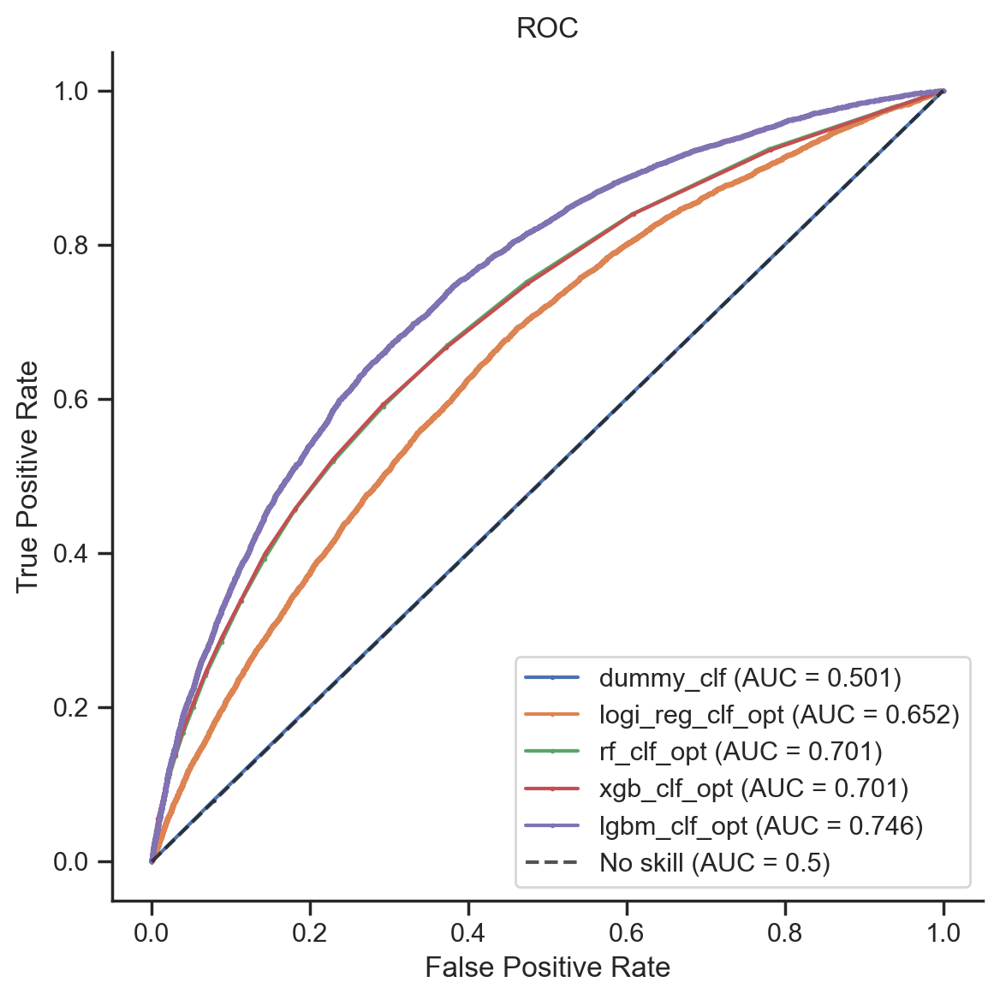

Models comparison: Normalization + No imbalance management


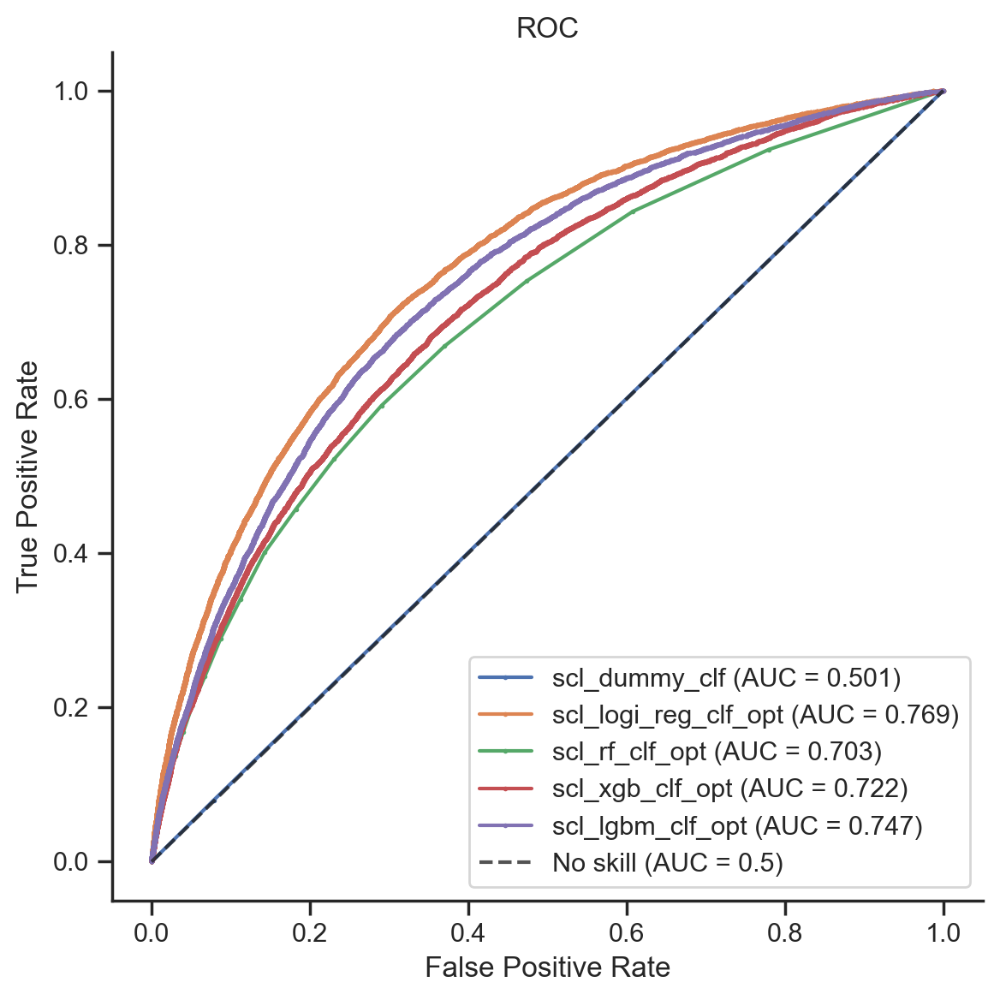

Models comparison: Normalization + Weight


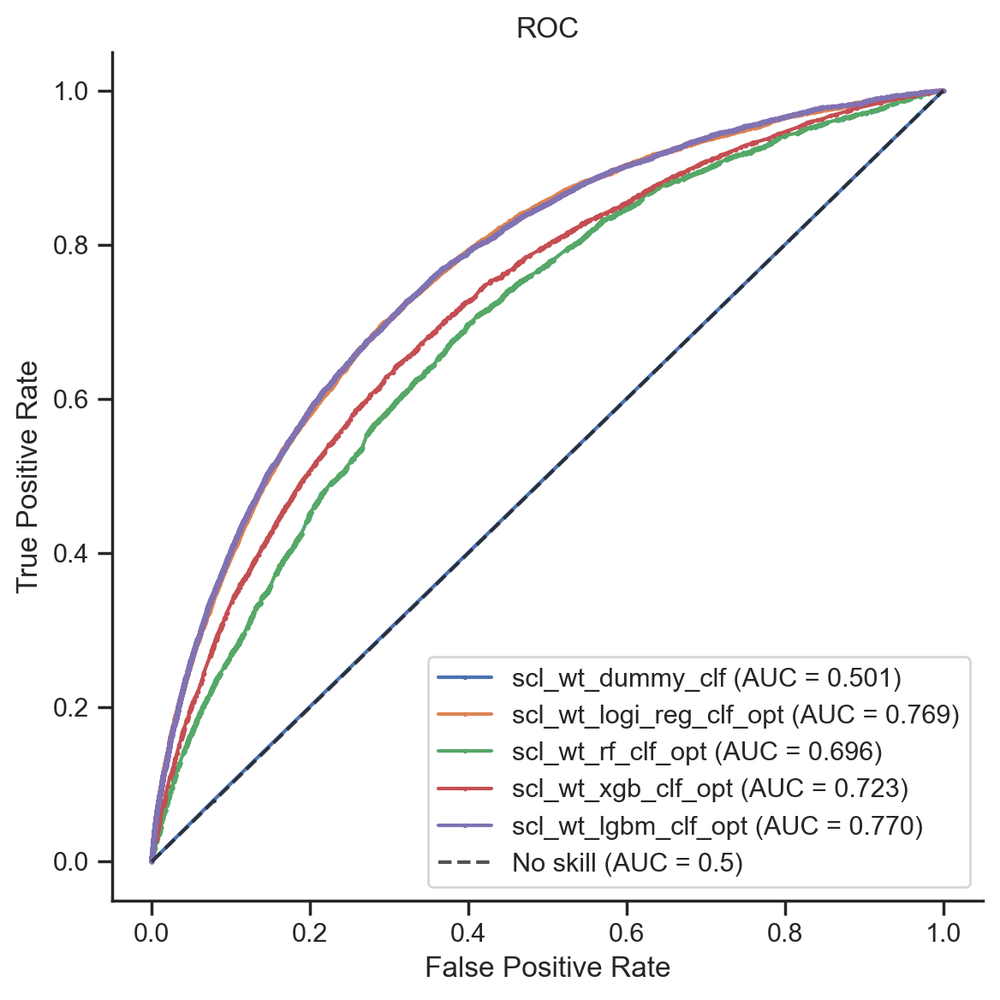

Models comparison: Normalization + Data oversampling


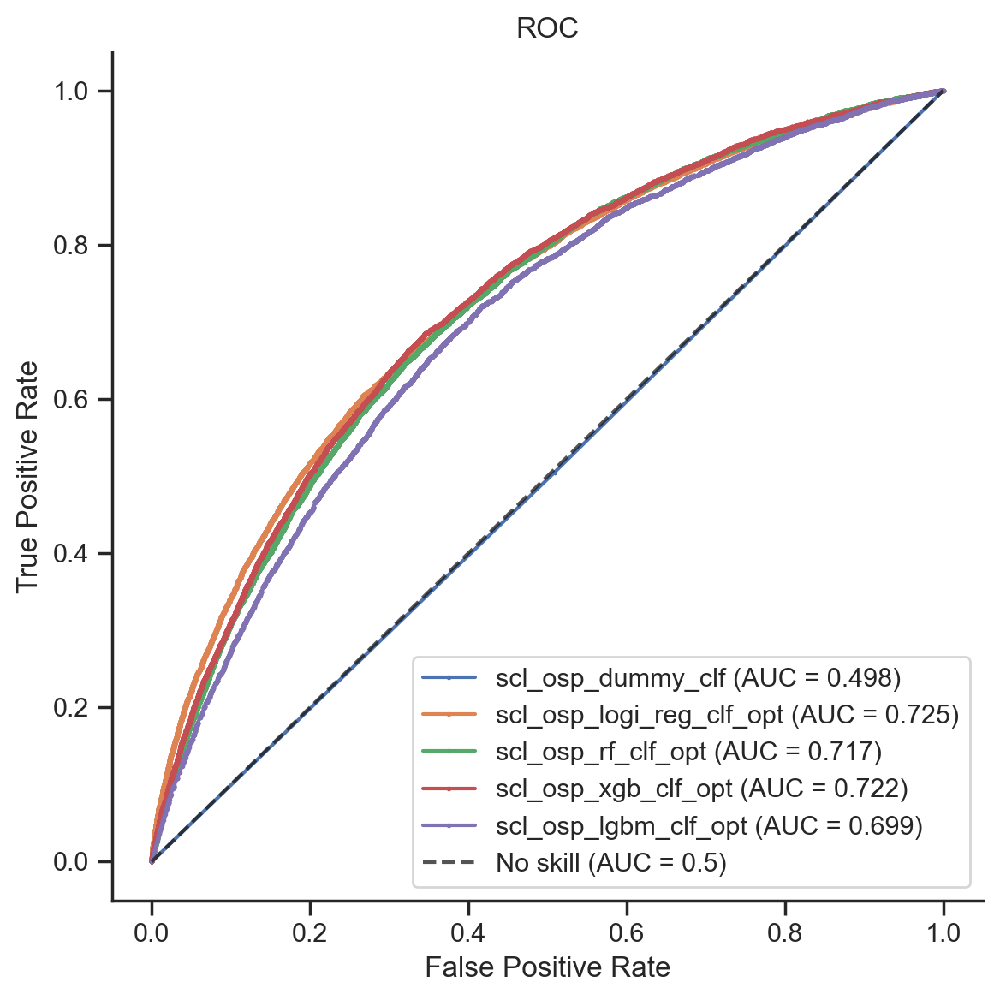

Models comparison: Normalization + Data undersampling


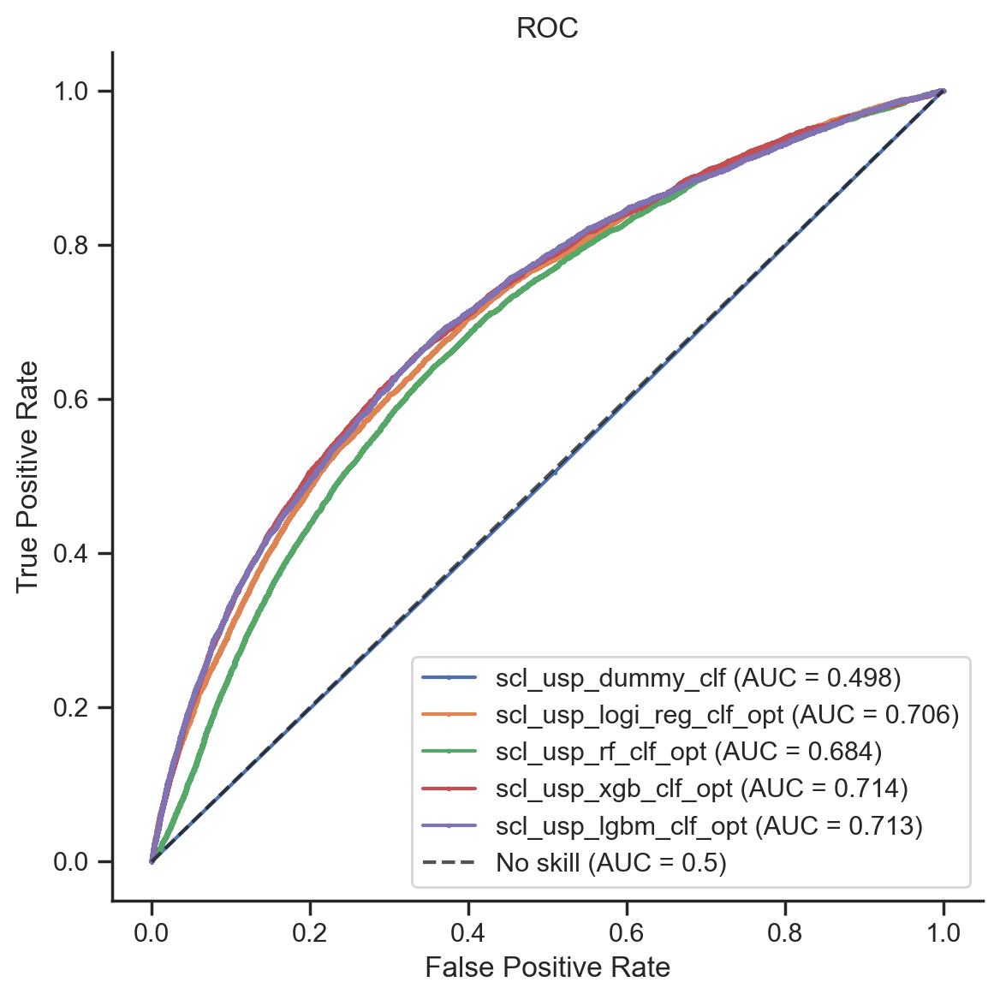

CPU times: total: 2.28 s
Wall time: 2.29 s


In [73]:
%%time

#        ### Plot figures normalization, no normalization, data resampling ###

#    ## Configuration ##

jmax = 25
for j in np.arange(0, df_MODELS.shape[0], 5):
    
    # Display only figure associated to models from this notebook.
    if j >= jmax:
        break
    
    # Set the whole figure title.
    if j < 5:
        print("Models comparison: No Normalization + No imbalance management")
    elif j < 10:
        print("Models comparison: Normalization + No imbalance management")
    elif j < 15:
        print("Models comparison: Normalization + Weight")
    elif j < 20:
        print("Models comparison: Normalization + Data oversampling")
    elif j < jmax:
        print("Models comparison: Normalization + Data undersampling")

        ## Plotting the Gain curves ##

    figure_roc(y_TRAIN, df_MODELS['yhat_train'][j:j+5], df_MODELS.index[j:j+5])
    
        ## Drawing ##

    # Arrange the subplots such as they are not superimposing each others. 
    plt.tight_layout()

    # Draw the figure.
    plt.show()

##### __- Job score comparison__

Models comparison: No Normalization + No imbalance management


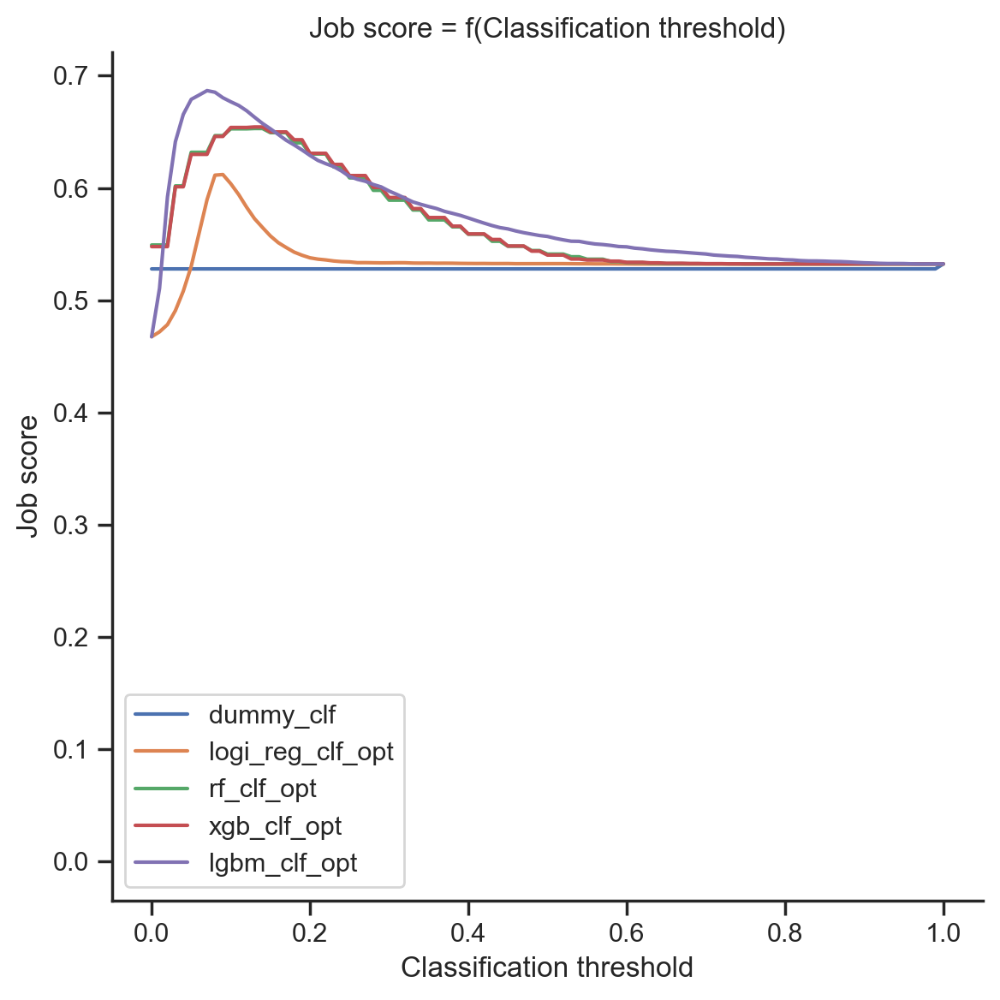

Models comparison: Normalization + No imbalance management


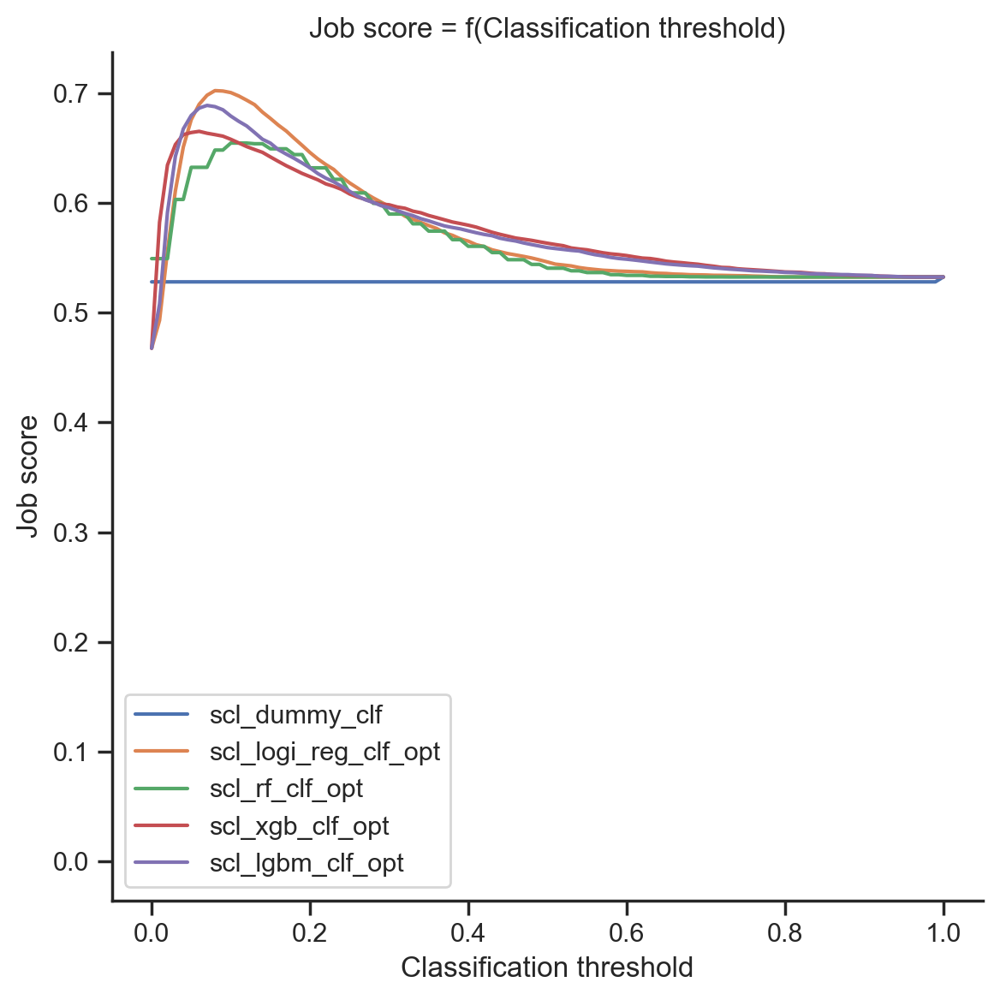

Models comparison: Normalization + Weight


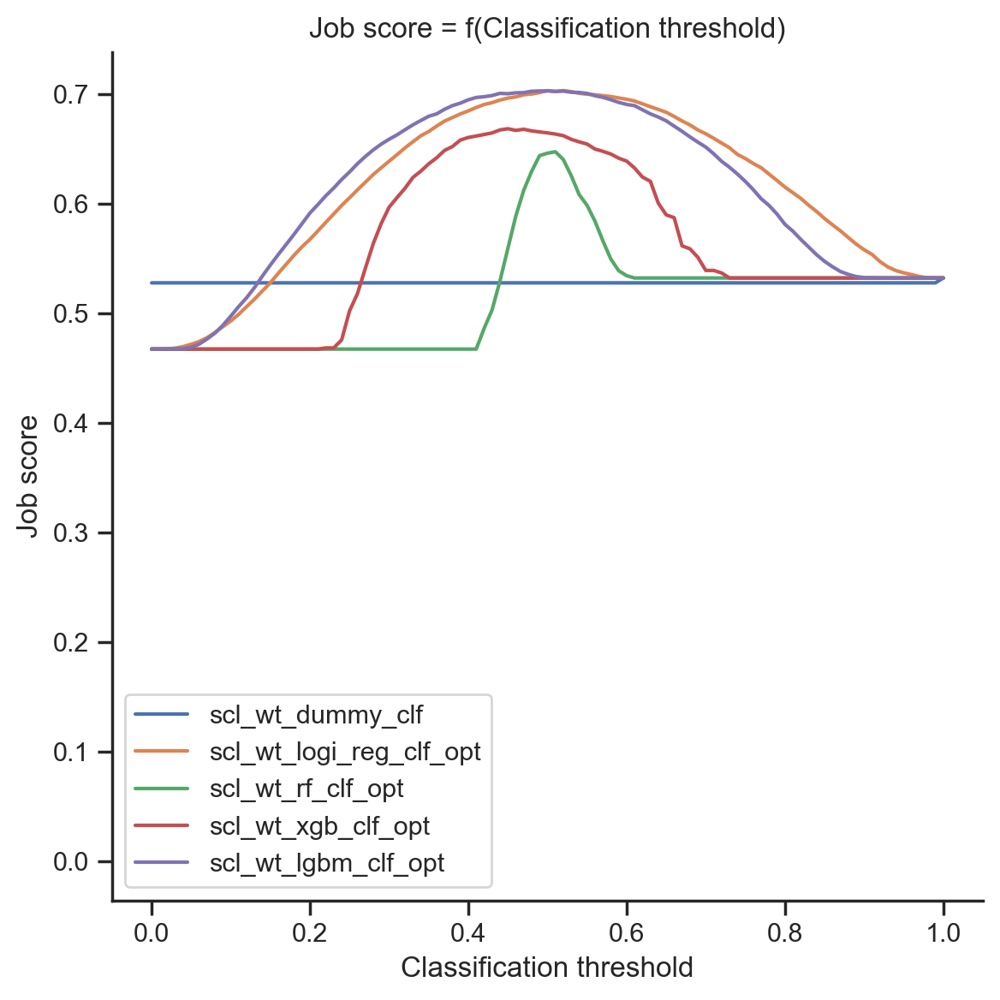

Models comparison: Normalization + Data oversampling


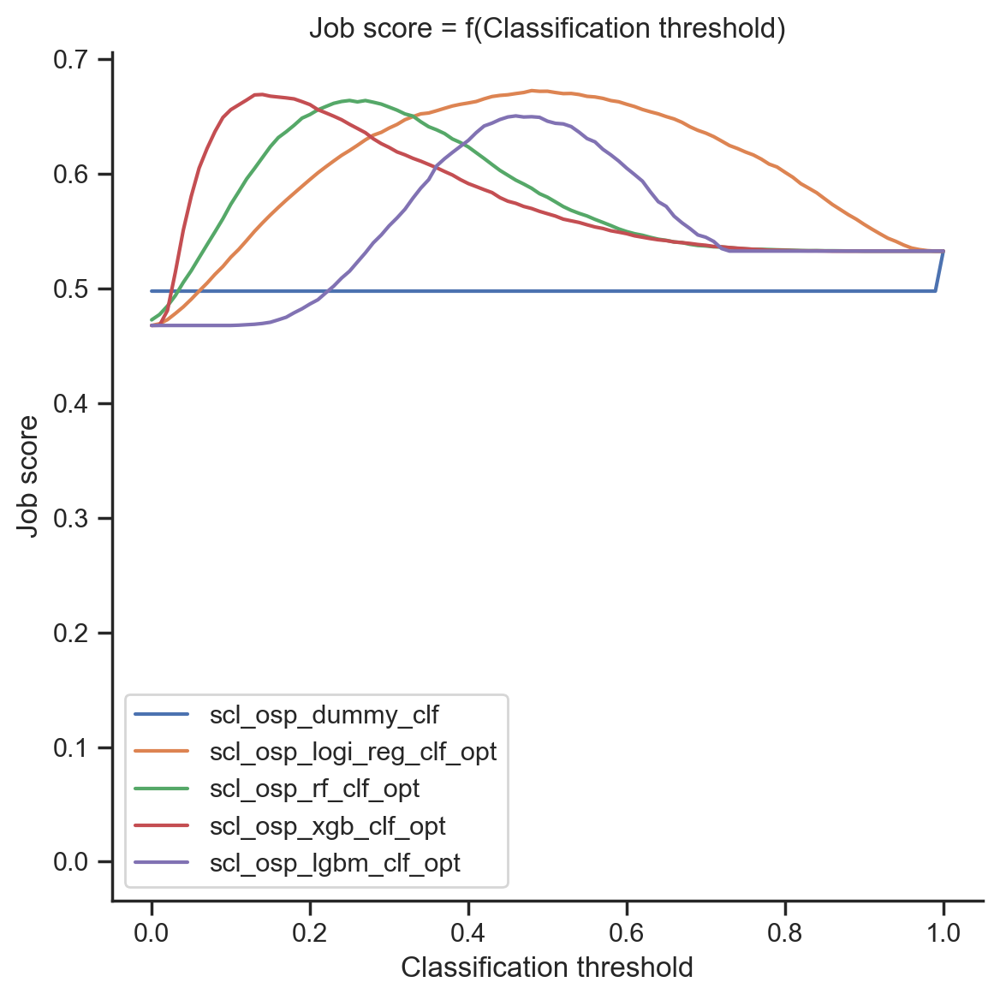

Models comparison: Normalization + Data undersampling


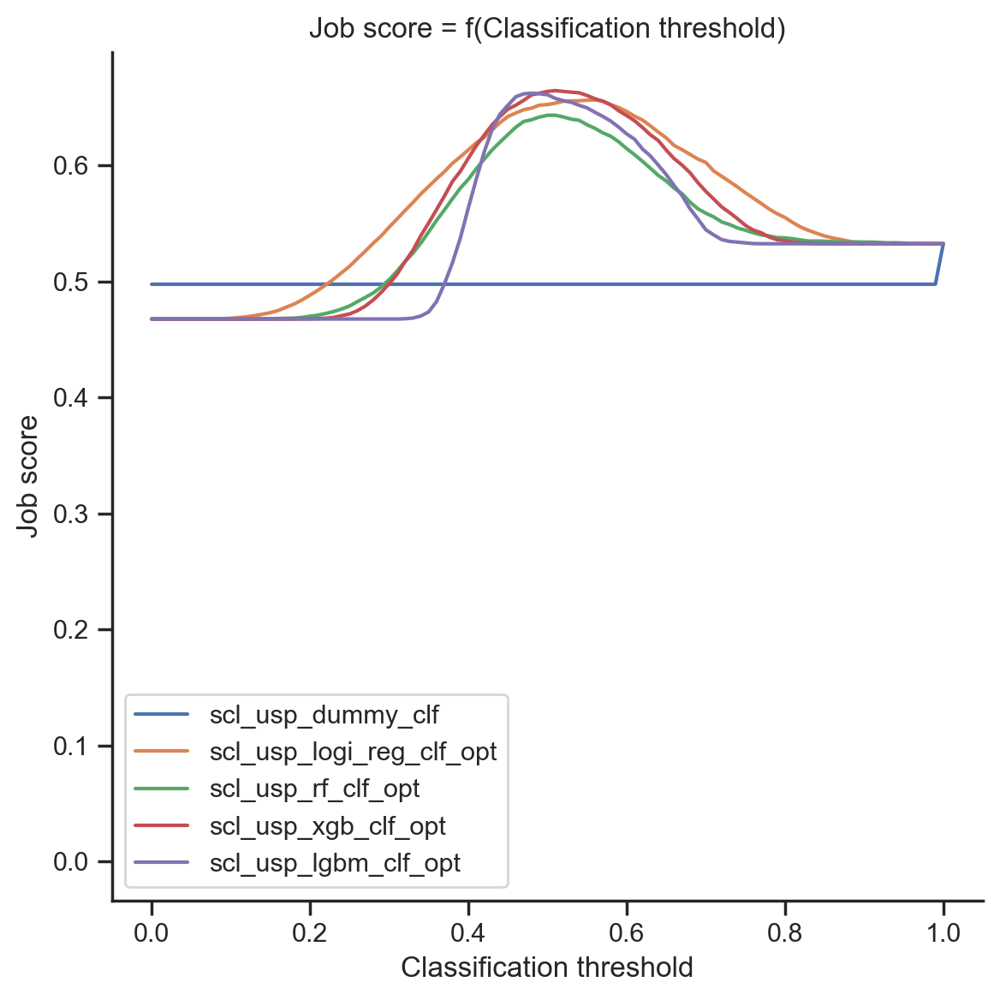

CPU times: total: 1min 55s
Wall time: 1min 55s


In [74]:
%%time

### Plot figures normalization, no normalization, data resampling ###

## Configuration ##

jmax = 25
for j in np.arange(0, df_MODELS.shape[0], 5):
    
    # Display only figure associated to models from this notebook.
    if j >= jmax:
        break
    
    # Set the whole figure title.
    if j < 5:
        print("Models comparison: No Normalization + No imbalance management")
    elif j < 10:
        print("Models comparison: Normalization + No imbalance management")
    elif j < 15:
        print("Models comparison: Normalization + Weight")
    elif j < 20:
        print("Models comparison: Normalization + Data oversampling")
    elif j < jmax:
        print("Models comparison: Normalization + Data undersampling")
        
        
    # Display only figure associated to models from this notebook.
    #if j > 10:
    #    break
        
        
    ### Plotting the Gain ###
    
    for i in range(j, j+5):

        # Stop the loop if it start to get out of the models' labels indexes.
        if i >= df_MODELS.shape[0]:
            break
        
        # Plot.
        figure_job_score_curve(y_TRAIN, df_MODELS['yhat_train'][i], model_label=df_MODELS.index[i], thr_line_vis=False)


    ## Drawing ##
    
    # Arrange the subplots such as they are not superimposing each others. 
    plt.tight_layout()

    # Draw the figure.
    plt.show()

##### __- Scores and processing times comparisons__

In [75]:
def figure_barplot (df, x_label = 'Model_labels', y_label = 'Score', title = None):
    
    # Rearrange the df such as it fits the seaborn.barplot() data format.
    tidy = df.reset_index().melt(id_vars=x_label, value_name=y_label, var_name='')
    
    # Plot the figure.
    ax = sns.barplot(data=tidy, y=x_label, x=y_label, hue='', orient='h', edgecolor='k')
    
    # Display values in bars.
    for i, val in enumerate(tidy[y_label]):
        ax.text(val/2, i+0.075, str(round(val,2)), ha='center', color='white')
    
    # Set the figure title.
    plt.title(title)


----------------------------------------------------------------------------------------------------

Models comparison: No Normalization + No imbalance management


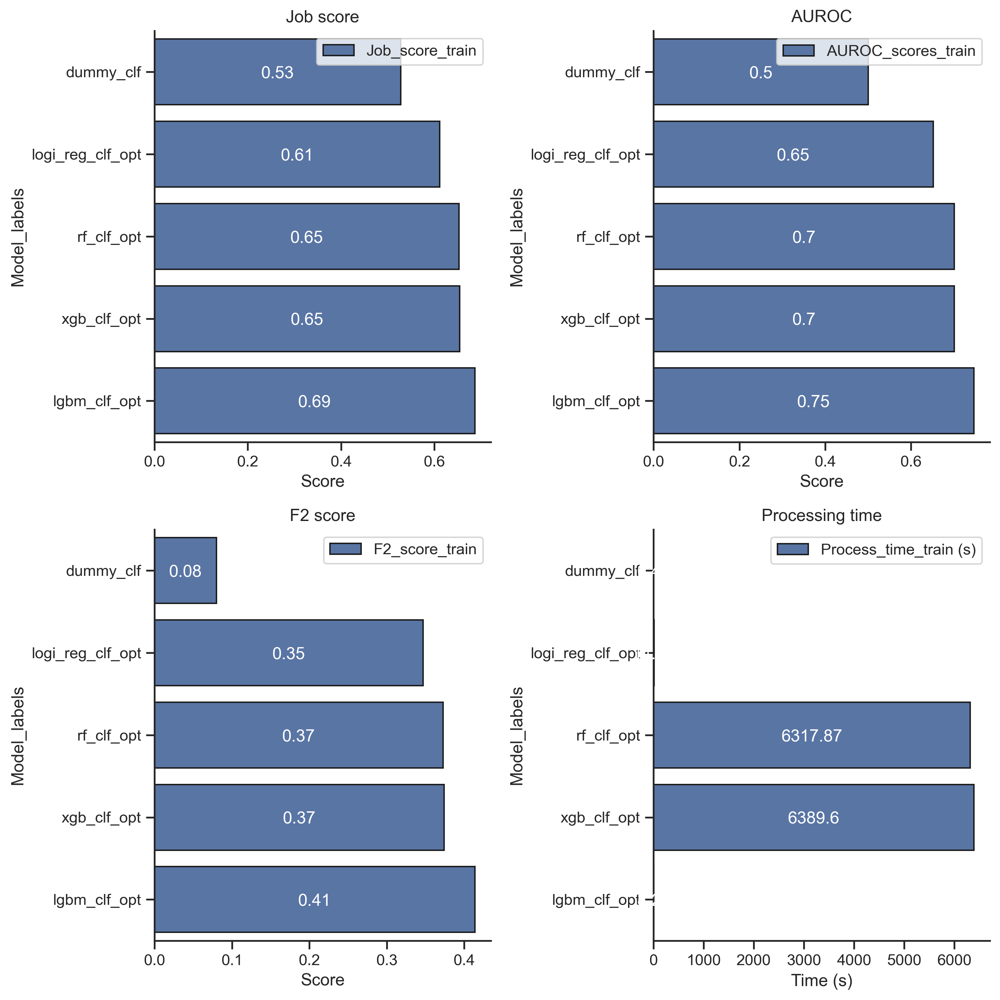


----------------------------------------------------------------------------------------------------

Models comparison: Normalization + No imbalance management


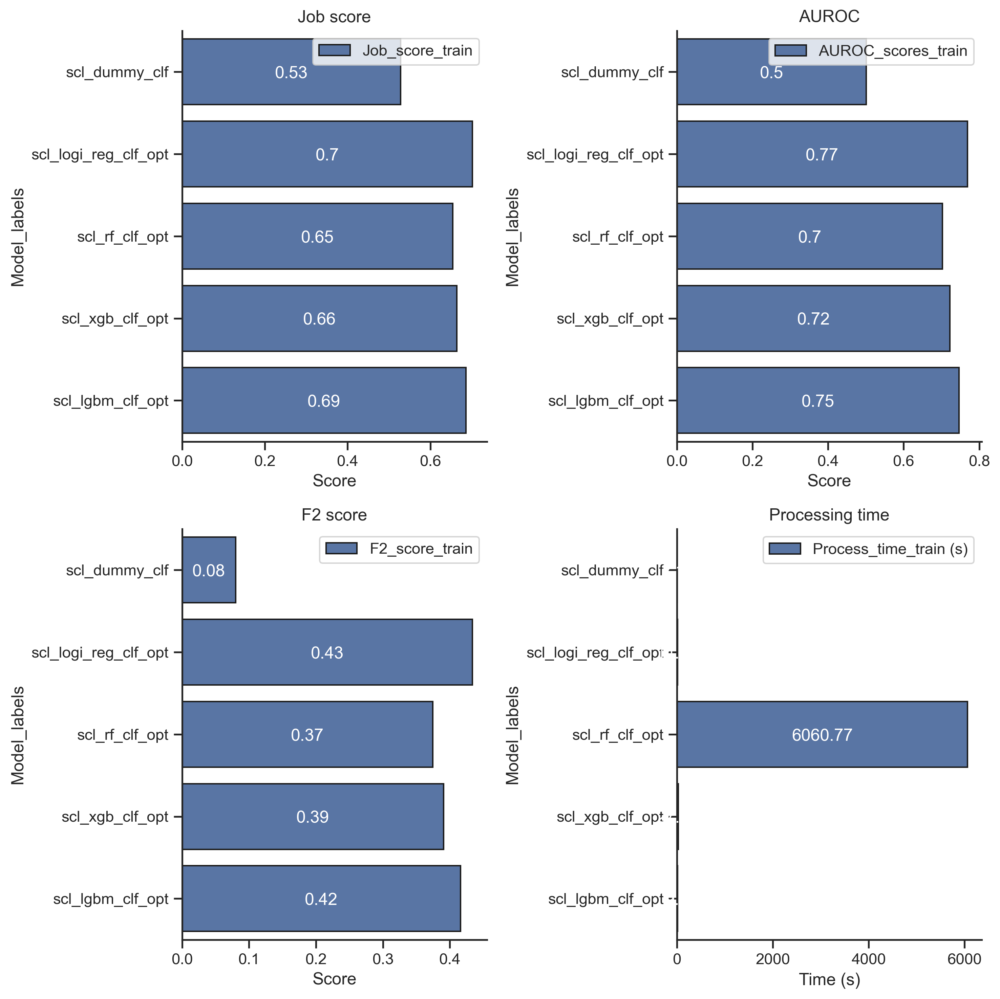


----------------------------------------------------------------------------------------------------

Models comparison: Normalization + Weight


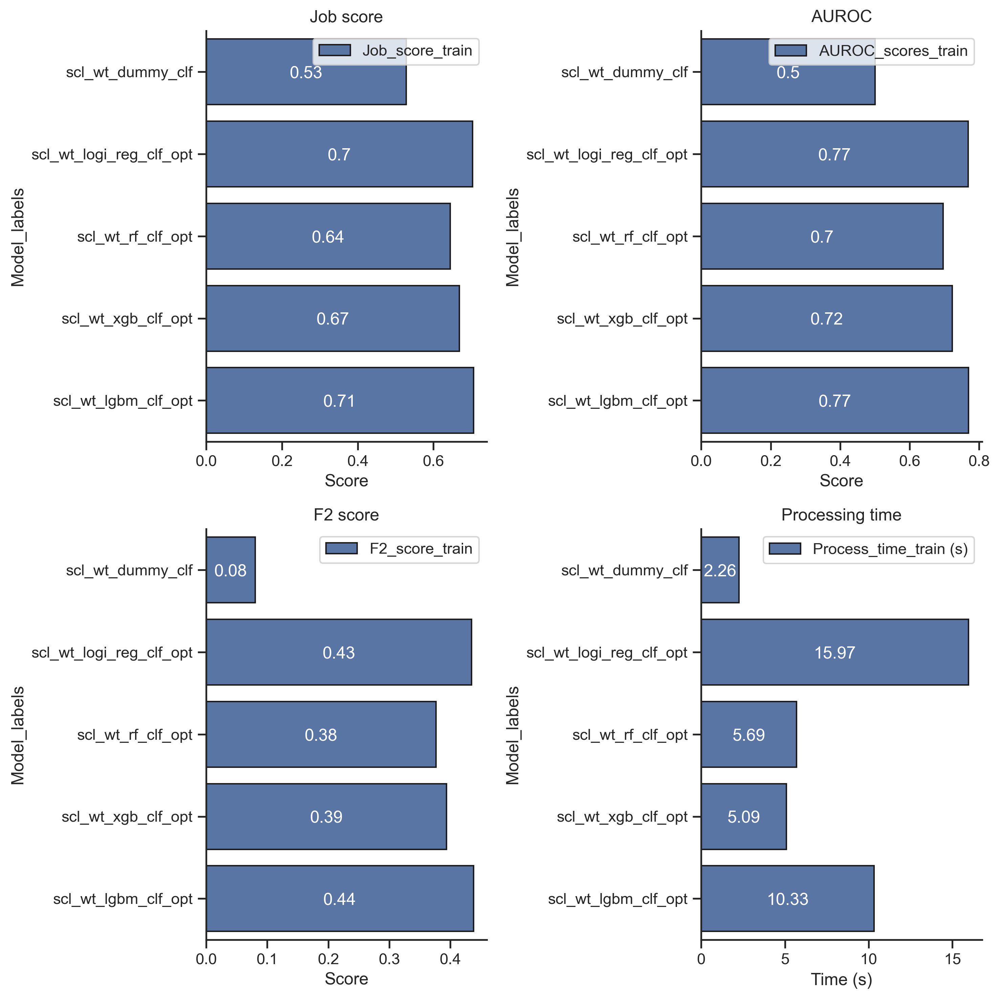


----------------------------------------------------------------------------------------------------

Models comparison: Normalization + Data oversampling


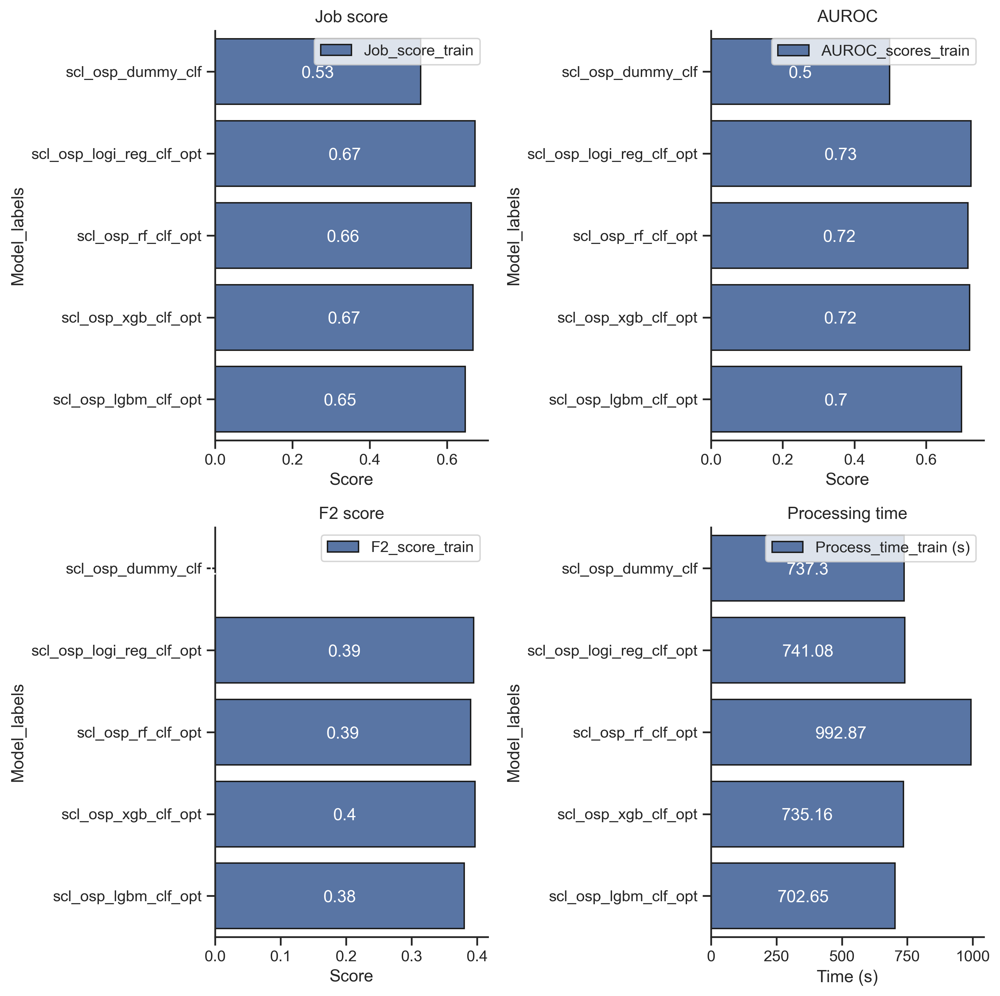


----------------------------------------------------------------------------------------------------

Models comparison: Normalization + Data undersampling


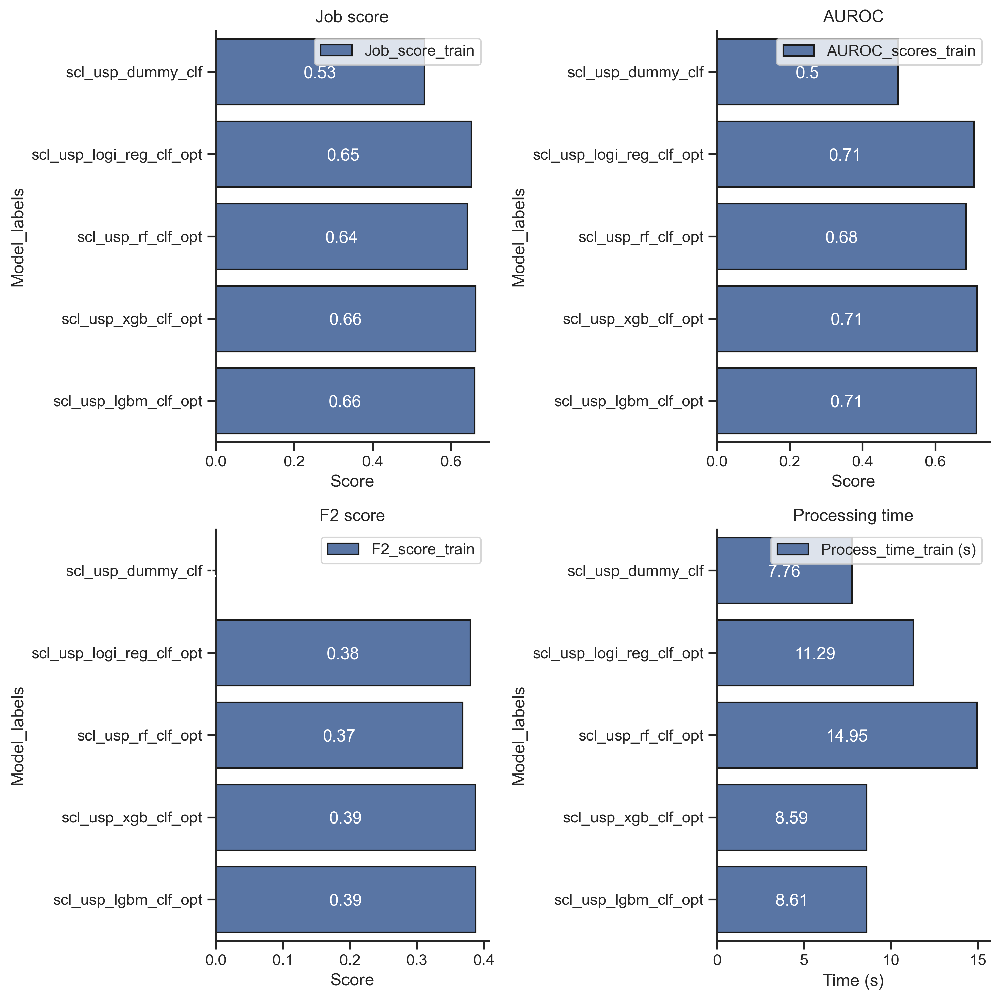

CPU times: total: 4.58 s
Wall time: 4.57 s


In [76]:
%%time

### Configuration ###

# Select the columns to compare.
l_features_peers = [
                    ['Job_score_train'], #'Job_score_test'],
                    ['AUROC_scores_train'], #'AUROC_scores_test'],
                    ['F2_score_train'], #'F2_score_test'],
                    ['Process_time_train (s)'], #'Process_time_test (s)']
                   ]

# Set each subplot titles.
l_subplot_titles = ["Job score",
                    "AUROC",
                    "F2 score",
                    "Processing time"
                   ]


# Plot figures normalization, no normalization, data resampling.
jmax = 25
for j in np.arange(0, df_MODELS.shape[0], 5):
    
    # Display only figure associated to models from this notebook.
    if j >= jmax:
        break
    
    # Figures separator.
    print("\n" + "-" * 100 + "\n")
    
    # Set the figure environment.
    fig = plt.figure(figsize=(10,10), dpi=300)
    
    # Set the whole figure title.
    if j < 5:
        print("Models comparison: No Normalization + No imbalance management")
    elif j < 10:
        print("Models comparison: Normalization + No imbalance management")
    elif j < 15:
        print("Models comparison: Normalization + Weight")
    elif j < 20:
        print("Models comparison: Normalization + Data oversampling")
    elif j < jmax:
        print("Models comparison: Normalization + Data undersampling")

    
    # Initialize the subplot grid (2 lines x 2 columns).
    l, c = int(len(l_features_peers) / 2), 2
    
    ### Plotting ###

    # Run the loop to draw and position each subplot on the figure's subplot grid.
    for i in range(len(l_features_peers)):

        # Get the columns and the subplot title to plot.
        features_peer = l_features_peers[i]
        subplot_title = l_subplot_titles[i]

        # Set the position of the subplot.
        p = i + 1
        plt.subplot(l, c, p)
        
        # Set the label of the abscissa.
        if p > 3:
            ylabel = 'Time (s)'
        else:
            ylabel = 'Score'
        
        # Plot the subplot.
        figure_barplot(df_MODELS[features_peer].iloc[j:j+5],
                       x_label = 'Model_labels', y_label = ylabel,
                       title = subplot_title)

        
    ### Drawing ###

    # Arrange the subplots such as they are not superimposing each others. 
    plt.tight_layout()

    # Draw the figure.
    plt.show()

#### iii. Conclusion

##### - Observations

- Without any data transformation ensemblist models perform better despite their slow processing time depending on their combinations of hyperparameters (except for lightGBM).
- Scaling data does not influence much the score obtained for ensemblist models but greatly improves the performances of the logistic regression classifier.
- Among the various data imbalance management techniques tried, it seems that cost-sensitive performs the best with LightGBM (Both, F2 and job scores, show best results). This techniques has also the advantage to not require a further step to transform data. Therefore, the training is faster and there is neither synthetic data potentially not representative of the reality unlike in oversampling nor the size of the sample to train on is reduced increasing chances to overfit the model unlike in undersampling.


##### - Interpretations

Performances of logistic regression might depends on the way imputations were made within the previous notebook. Being more strict on the selection of features (according to their filling rate for example) might alter performances of this classifier. A reduction of dimension such as PCA would also participate to select the most relevant features.  
*NB: Nevertheless, fine tuning features with the model in order to get the best possible score is out of the scope of this project.*

Despite the logistic regression is very close in terms of performances, LightGBM shows other interesting properties. It is able to manage ordinal categorical features, its nature based on decisional trees makes it also a good candidate for model's interpretability and it is less sensitive to outliers than logistic regression. In addition, it have a higher speed, more memory efficient and a generally better accuracy than other gradient boosting classifiers.

Overall, the observations appear consistent given the nature and sensitivity of each type of model tested. The LightGBM classifier performed fairly well in all situations, showed the best performance associated with a management of the class imbalance by the cost-sensitive method and meets all the classifier criteria required for this project

=> That is why, the classifier LightGBM seems to be the most promising overall from those tested.